# Sotiris code with squeezing

## Creation of the Agent

In [1]:
#Package
using CellBasedModels
#Functions for generating random distributions
using Random
using Distributions
#Package for plotting in 3D
import Pkg; Pkg.add("GLMakie")
using GLMakie
#using CairoMakie #<-- Nicer but much slower!

# To reset to GLMakie:
GLMakie.activate!()

Makie.inline!(true)

#using MathTexEngine
#Makie.update_theme!(fonts = (regular = texfont(), bold = texfont(:bold), italic = texfont(:italic)))

import Pkg; Pkg.add("CSV")
using CSV
#using DataFrames
import Pkg; Pkg.add("Distances")
import Pkg; Pkg.add("Clustering")
import Pkg; Pkg.add("StaticArrays")
import Pkg; Pkg.add("NearestNeighbors")
import Pkg; Pkg.add("DataFrames")
import Pkg; Pkg.add("GeometryBasics")
import Pkg; Pkg.add("Colors")
import Pkg; Pkg.add("Statistics")
using Pkg
Pkg.add("WriteVTK")
using DataFrames, Distances, Clustering
using GeometryBasics
using Colors
using StaticArrays
using Statistics


using Dates

    Updating registry at `~/.julia/registries/General.toml`
   Resolving package versions...
  No Changes to `~/.julia/environments/v1.8/Project.toml`
  No Changes to `~/.julia/environments/v1.8/Manifest.toml`
┌ Warning: Error requiring `MakieCore` from `Polynomials`
│   exception =
│    LoadError: ArgumentError: Package Polynomials does not have MakieCore in its dependencies:
│    - You may have a partially installed environment. Try `Pkg.instantiate()`
│      to ensure all packages in the environment are installed.
│    - Or, if you have Polynomials checked out for development and have
│      added MakieCore as a dependency but haven't updated your primary
│      environment's manifest file, try `Pkg.resolve()`.
│    - Otherwise you may need to report an issue with Polynomials
│    Stacktrace:
│      [1] macro expansion
│        @ ./loading.jl:1167 [inlined]
│      [2] macro expansion
│        @ ./lock.jl:223 [inlined]
│      [3] require(into::Module, mod::Symbol)
│        @ Base ./l

### Define the agent

First, we have to create an instance of an agent with all the propoerties of the agents.First, we have to create an instance of an agent with all the propoerties of the agents.

In [2]:

#Nmax = 1000
#P_track = [3.2, 5.02]
#P_track_test = [4.44, 6.66]
#pop!(P_track_test)
#pop!(P_track_test)

#P_state = [0]
#pop!(P_state)

model = ABM(3,

    #Inherit model mechanics
    ###baseModelInit = [CBMModels.softSpheres3D],

   
    #Global parameters
    model = Dict(

        
        :b=>Float64,
        :λ=>Float64,
        :ζ=>Float64,
        :μ=>Float64,
        :f0=>Array{Float64},
        :f0_rep=>Array{Float64},
        
        #############################################################################################################################
        #:ndist => Float64, #Maximum distance to compute neighbor distance
        :kpON=>Float64, #Protrusion rate/"probability" (Could make this different for each cell AND change with time!)
        :kpOFF=>Float64, #Protrusion duration rate/"probability" (Could make this different for each cell AND change with time!)
        #:kpOFF_C=>Float64,
        :kpON_=>Array{Float64},
        :kpOFF_=>Array{Float64},
        :fRange_P=>Float64, # Protrusion force interaction range factor
        :fRange_P_min=>Float64, # Protrusion force minimum range factor for establishing protrusion bond
        :fRange_P_break=>Float64, # Protrusion force break range factor
        :fPI=>Float64, # Contractile Protrusion force magnitude
        :ε=>Float64, #LJ minimum energy for cell-cell protrusion interaction
        #:P_track=>Array{Float64}, #<--- EMINA THAME!
        #:PP=>Array{Int64},
        :p=>Float64,  #Transition rate from A to B
        :q=>Float64,  #Transition rate from B to C
        #:κ0=>Float64, #Transition rate feedback factor constant
        :κ0=>Array{Float64}, #Transition rate feedback factor constant
        #:κ=>Array{Float64}, #Transition rate feedback factor
        :fs0=>Float64, #Soft Core repulsion between B and C type cells
        :fs=>Array{Int64},
        :f0_0=>Float64, #Attraction between  cells
        :f0_0_rep=>Float64, #Hard Core repulsion between  cells
        :fPI_=>Array{Float64}, # Contractile Protrusion force magnitude

        #Division constants:
        :τDiv_=>Array{Float64},
        :τDiv_pre_=>Array{Float64},
        :σDiv_=>Array{Float64},

        # velocity dissipation:
        :vel_diss=>Float64,

        # Squeezing
        :z_plate_height=>Float64,
        :z_plate_height_min=>Float64,
        :dz_plate_height_displacement=>Float64,
        :Fz_squeeze=>Float64,
        :cell_plate_contact_dist=>Float64,
        :z_substrate_height=>Float64,
        :z_substrate_height_min=>Float64,
        :dz_substrate_height_displacement=>Float64,
        :cell_substrate_contact_dist=>Float64,
        #############################################################################################################################
        
        #Chemical constants
        :α=>Float64, 
        :K=>Float64, 
        :nn=>Float64, 
        :mm=>Float64,
        #Physical constants
        :fRange=>Float64,
        :mi=>Float64, 
        :ri=>Float64, 
        :k0=>Float64,
        #Division constants
        :fAdh=>Float64, 
        :τDiv=>Float64, 
        :σDiv=>Float64, 
        :c0=>Float64, 
        :σc=>Float64, 
        :nCirc=>Float64, 
        :σNCirc=>Float64,
        :fMin=>Float64, 
        :fMax=>Float64, 
        :fPrE=>Float64, 
        :fEPI=>Float64, 
        :τCirc=>Float64, 
        :στCirc=>Float64, 
        :rESC=>Float64,
        :nOn=>Float64, 
        :cMax=>Float64
    ),

    
    #Local float parameters
    agent = Dict(

        :m=>Float64,
        :r=>Float64,
        :vx=>Float64,
        :vy=>Float64,
        :vz=>Float64,
        :fx=>Float64,
        :fy=>Float64,
        :fz=>Float64,
        
        #############################################################################################################################
        :fpx=>Float64,
        :fpy=>Float64,
        :fpz=>Float64,
        
        :nNeighs=>Int64,  #Number of neighbors that the agent has for velocity term in forces
        :nNeighs_A=>Int64,  #Number of neighbors that the agent has in state A (cellFate = 1)
        :nNeighs_B=>Int64,  #Number of neighbors that the agent has in state B (cellFate = 2)
        :nNeighs_C=>Int64,  #Number of neighbors that the agent has in state C (cellFate = 3)
        #:nNeighs_ABC=>Int64, #Number of neighbors that the agent has in state A,B,C (cellFate = 1,2,3) # agent class cannot have arrays :(
        :nNeighs_P=>Int64,  #Number of neighbours that the agent has for Protrusion term in forces
        :nSumVx=>Float64, #Sum of neighbors' vx
        :nSumVy=>Float64, #Sum of neighbors' vy
        :nSumVz=>Float64, #Sum of neighbors' vz

        :kp=>Float64,  #Cell protrusion random number
        :τp=>Float64,  #Protrusion time constant
        :tij=>Float64, #Protrusion time 
        :tij_c=>Float64, #Protrusion time counter
        #:P=>Int64, #Cell protrusion state (active/inactive)
        #:PP=>Array{Float64},
        #:kp=>Float64,   #Cell protrusion probability

        #For Various aggregates:
        :cell_aggregate=>Int64,
        #For controlling division:
        :cell_dividing=>Int64,
        :cell_div_relax_steps=>Int64,

        :salt_and_pepper_switch=>Int64,

        :N_start_sim_switch=>Int64,

        :N_diff_min_switch=>Int64,

        :prolif_active_switch=>Int64,

        :N_active=>Int64, # com.cellFate components out of Nmax that are actually there!
        :N_state1=>Int64, # Number of com.cellFate components that are = 1 — state A!

        :prolif_active=>Int64, # Tell if cell is chosen randomly for proliferation

        :switch_cell_plate_dist_1=>Int64,
        :switch_cell_plate_dist_2=>Int64,
        #############################################################################################################################
        
        :c=>Float64,
        :tDivision=>Float64, #Variable storing the time of division of the cell
        :ci=>Float64, #Chemical activity of the neighbors
        :ni=>Float64,  #Number of neighbors
        :tOff=>Bool,    #indicate if the circuit for that cell is on or off (0,1)
        :cellFate=>Int64 #Identity of the cell (1 A, 2 B, 3 C)
    ),


    
    ###Mechnical & Chemical dynamics
    agentODE = quote
        
        #############################################################################################################################
        #Mechanics
        #vx_[i1_] = 0.0; vy_[i1_] = 0.0; vz_[i1_] = 0.0
        fx = 0.0; fy = 0.0; fz = 0.0
        #fmax = 110.0  # corresponds to a distance of R/3 between the cells
        #fmax = 1482.0  # corresponds to a distance of R/10 between the cells
        fmax = 1000.0  # corresponds to a distance of R/8 between the cells
        #fmax = 180.0  # corresponds to a distance of 0.4 (R/2*0.4) between the cells
        #fmax = 500.0  # corresponds to a distance of 0.4 (R/2*0.4) between the cells
        #fmax = 200.0  # corresponds to a distance of 0.4 (R/2*0.4) between the cells
        switch_fmax_x = 0
        switch_fmax_y = 0
        switch_fmax_z = 0

        inv_lambda = 1.0 / λ  # precompute 1/λ
        inv_nNeighs = 1.0 / nNeighs
        
        dist_to_plate = sqrt((z-z_plate_height)^2)
        dist_to_substrate = sqrt((z-z_substrate_height)^2)

        # precompute inverses for distances
        inv_dist_plate = 1.0 / dist_to_plate
        inv_dist_substrate = 1.0 / dist_to_substrate

        # masks as 0/1
        plate_mask = dist_to_plate <= cell_plate_contact_dist ? 1.0 : 0.0
        substrate_mask = dist_to_substrate <= cell_substrate_contact_dist ? 1.0 : 0.0
        
        #switch_cell_plate_dist_1 = 0
        #switch_cell_plate_dist_2 = 0
        @loopOverNeighbors it2 begin
            dij = sqrt((x-x[it2])^2+(y-y[it2])^2+(z-z[it2])^2)
            rij = r+r[it2]
            
            #if dij < μ*rij && dij > 0   
            if dij < μ*rij && dij > 0
                
                if dij < rij

                    #1#: used for 9.2:
                    #fx += ( f0_0_rep *(rij/dij-1)*(μ*rij/dij-1) - fs0*fs[cellFate[i1_],cellFate[it2]]*log(dij/rij) ) * (x-x[it2])/dij 
                    #fy += ( f0_0_rep *(rij/dij-1)*(μ*rij/dij-1) - fs0*fs[cellFate[i1_],cellFate[it2]]*log(dij/rij) ) * (y-y[it2])/dij
                    #fz += ( f0_0_rep *(rij/dij-1)*(μ*rij/dij-1) - fs0*fs[cellFate[i1_],cellFate[it2]]*log(dij/rij) ) * (z-z[it2])/dij

                    #5#: used for 1.0_polarisation
                    #fx += ( f0_0_rep * f0[cellFate[i1_],cellFate[it2]] * (rij/dij-1)*(μ*rij/dij-1) - fs0*fs[cellFate[i1_],cellFate[it2]]*log(dij/rij) ) * (x-x[it2])/dij 
                    #fy += ( f0_0_rep * f0[cellFate[i1_],cellFate[it2]] * (rij/dij-1)*(μ*rij/dij-1) - fs0*fs[cellFate[i1_],cellFate[it2]]*log(dij/rij) ) * (y-y[it2])/dij
                    #fz += ( f0_0_rep * f0[cellFate[i1_],cellFate[it2]] * (rij/dij-1)*(μ*rij/dij-1) - fs0*fs[cellFate[i1_],cellFate[it2]]*log(dij/rij) ) * (z-z[it2])/dij

                    #5#:
                    #fx += ( f0_0_rep * f0[cellFate[i1_],cellFate[it2]] * (rij/dij-1)*(μ*rij/dij-1) ) * (x-x[it2])/dij 
                    #fy += ( f0_0_rep * f0[cellFate[i1_],cellFate[it2]] * (rij/dij-1)*(μ*rij/dij-1) ) * (y-y[it2])/dij
                    #fz += ( f0_0_rep * f0[cellFate[i1_],cellFate[it2]] * (rij/dij-1)*(μ*rij/dij-1) ) * (z-z[it2])/dij

                    #6#: <-- TO DO for version 1.1_Polarisation:
                    fx += ( f0_0_rep * f0_rep[cellFate[i1_],cellFate[it2]] * (rij/dij-1)*(μ*rij/dij-1) ) * (x-x[it2])/dij 
                    fy += ( f0_0_rep * f0_rep[cellFate[i1_],cellFate[it2]] * (rij/dij-1)*(μ*rij/dij-1) ) * (y-y[it2])/dij
                    fz += ( f0_0_rep * f0_rep[cellFate[i1_],cellFate[it2]] * (rij/dij-1)*(μ*rij/dij-1) ) * (z-z[it2])/dij

                    #7#: <-- TO DO for version 1.1_Polarisation:
                    #fx += ( f0_0_rep * f0_rep[cellFate[i1_],cellFate[it2]] * (rij/dij-1)*(μ*rij/dij-1) - fs0*fs[cellFate[i1_],cellFate[it2]]*log(dij/rij) * nNeighs_C ) * (x-x[it2])/dij 
                    #fy += ( f0_0_rep * f0_rep[cellFate[i1_],cellFate[it2]] * (rij/dij-1)*(μ*rij/dij-1) - fs0*fs[cellFate[i1_],cellFate[it2]]*log(dij/rij) * nNeighs_C ) * (y-y[it2])/dij
                    #fz += ( f0_0_rep * f0_rep[cellFate[i1_],cellFate[it2]] * (rij/dij-1)*(μ*rij/dij-1) - fs0*fs[cellFate[i1_],cellFate[it2]]*log(dij/rij) * nNeighs_C ) * (z-z[it2])/dij


                                        
                    #4#:
                    #fx += (f0_0_rep * f0[1,1]*(rij/dij-1)*(μ*rij/dij-1) - fs0*fs[cellFate[i1_],cellFate[it2]]*log(dij/rij) ) * (x-x[it2])/dij 
                    #fy += (f0_0_rep * f0[1,1]*(rij/dij-1)*(μ*rij/dij-1) - fs0*fs[cellFate[i1_],cellFate[it2]]*log(dij/rij) ) * (y-y[it2])/dij
                    #fz += (f0_0_rep * f0[1,1]*(rij/dij-1)*(μ*rij/dij-1) - fs0*fs[cellFate[i1_],cellFate[it2]]*log(dij/rij) ) * (z-z[it2])/dij
    
                    #2#:
                    #2#fx += (f0[1,1]*(rij/dij-1)*(μ*rij/dij-1) - fs0*fs[cellFate[i1_],cellFate[it2]]*log(dij/(μ*rij)) ) * (x-x[it2])/dij 
                    #2#fy += (f0[1,1]*(rij/dij-1)*(μ*rij/dij-1) - fs0*fs[cellFate[i1_],cellFate[it2]]*log(dij/(μ*rij)) ) * (y-y[it2])/dij
                    #2#fz += (f0[1,1]*(rij/dij-1)*(μ*rij/dij-1) - fs0*fs[cellFate[i1_],cellFate[it2]]*log(dij/(μ*rij)) ) * (z-z[it2])/dij
    
                    # softer force:
                    if fx > fmax
                        fx = fmax
                        if switch_fmax_x == 0
                            println(" **********   fx REACHED fmax!!!   **********")
                            switch_fmax_x = 1
                        end
                    end
                    if fy > fmax
                        fy = fmax
                        if switch_fmax_y == 0
                            println(" **********   fy REACHED fmax!!!   **********")
                            switch_fmax_y = 1
                        end
                    end
                    if fz > fmax
                        fz = fmax
                        if switch_fmax_z == 0
                            println(" **********   fz REACHED fmax!!!   **********")
                            switch_fmax_z = 1
                        end
                    end
                
                else

                    # Original force:
                    #1#:
                    fx += f0_0 * f0[cellFate[i1_],cellFate[it2]]*(rij/dij-1)*(μ*rij/dij-1)*(x-x[it2])/dij
                    fy += f0_0 * f0[cellFate[i1_],cellFate[it2]]*(rij/dij-1)*(μ*rij/dij-1)*(y-y[it2])/dij
                    fz += f0_0 * f0[cellFate[i1_],cellFate[it2]]*(rij/dij-1)*(μ*rij/dij-1)*(z-z[it2])/dij

                    #4#:
                    #fx += f0_0 * f0[cellFate[i1_],cellFate[it2]]*(rij/dij-1)*(μ*rij/dij-1)*(x-x[it2])/dij
                    #fy += f0_0 * f0[cellFate[i1_],cellFate[it2]]*(rij/dij-1)*(μ*rij/dij-1)*(y-y[it2])/dij
                    #fz += f0_0 * f0[cellFate[i1_],cellFate[it2]]*(rij/dij-1)*(μ*rij/dij-1)*(z-z[it2])/dij
    
                    #2#:
                    #2#fx += ( f0[cellFate[i1_],cellFate[it2]]*(rij/dij-1)*(μ*rij/dij-1) - fs0*fs[cellFate[i1_],cellFate[it2]]*log(dij/(μ*rij)) ) * (x-x[it2])/dij
                    #2#fy += ( f0[cellFate[i1_],cellFate[it2]]*(rij/dij-1)*(μ*rij/dij-1) - fs0*fs[cellFate[i1_],cellFate[it2]]*log(dij/(μ*rij)) ) * (y-y[it2])/dij
                    #2#fz += ( f0[cellFate[i1_],cellFate[it2]]*(rij/dij-1)*(μ*rij/dij-1) - fs0*fs[cellFate[i1_],cellFate[it2]]*log(dij/(μ*rij)) ) * (z-z[it2])/dij
    
                    # This is for using only 1 if clause with : "if dij < μ*rij && dij > 0 -- does seem to work too well though. Hard repulsion is needed"
                    #0#:
                    #0#fx += (f0[cellFate[i1_],cellFate[it2]]*(rij/dij-1)*(μ*rij/dij-1) - fs0*fs[cellFate[i1_],cellFate[it2]]*log(dij/rij) ) * (x-x[it2])/dij 
                    #0#fy += (f0[cellFate[i1_],cellFate[it2]]*(rij/dij-1)*(μ*rij/dij-1) - fs0*fs[cellFate[i1_],cellFate[it2]]*log(dij/rij) ) * (y-y[it2])/dij
                    #0#fz += (f0[cellFate[i1_],cellFate[it2]]*(rij/dij-1)*(μ*rij/dij-1) - fs0*fs[cellFate[i1_],cellFate[it2]]*log(dij/rij) ) * (z-z[it2])/dij
                    #0#println("Here is f0[cellFate[i1_],cellFate[it2]], (rij/dij-1), (μ*rij/dij-1), (x-x[it2])/dij = ", f0[cellFate[i1_],cellFate[it2]], ", ", (rij/dij-1), ", ", (μ*rij/dij-1), ", ", (x-x[it2])/dij )
    
                    # softer force:
                    if fx > fmax
                        fx = fmax
                        if switch_fmax_x == 0
                            println(" **********   fx REACHED fmax!!!   **********")
                            switch_fmax_x = 1
                        end
                    end
                    if fy > fmax
                        fy = fmax
                        if switch_fmax_y == 0
                            println(" **********   fy REACHED fmax!!!   **********")
                            switch_fmax_y = 1
                        end
                    end
                    if fz > fmax
                        fz = fmax
                        if switch_fmax_z == 0
                            println(" **********   fz REACHED fmax!!!   **********")
                            switch_fmax_z = 1
                        end
                    end

                end
                
            end

            
        end

       

        #if nNeighs > 0 
            #println("Here is nNeighs = ",nNeighs)
            #println("Here is dt(vx) = ",dt(vx))
        #end
        #dt(vx) = -b*nNeighs*vx/m+fx/m    #dt(vx) = -b*vx/m+fx/m
        
        # ORIGINAL UPDATE:
        ###dt(vx) = -b*vx/m+fx/m
        ###dt(vy) = -b*vy/m+fy/m
        ###dt(vz) = -b*vz/m+fz/m
        ###dt(x) = vx
        ###dt(y) = vy
        ###dt(z) = vz

        # New definition of velocities:
        #!# if nNeighs == 0
        ###if nNeighs < 2 # <-- THIS WORKS BETTER!!!
        
        if nNeighs < N_relV_min
        #if N < N_relV_min
        #if N < N_relV_min || nNeighs < 1
            
            # ORIGINAL VERSION
            #dt(vx) = -b*vx/m+fx/m #+ nSumVx/nNeighs * (nNeighs)#+ nSumVx/nNeighs/m/100.  #dt(vx) = -b*vx/m+fx/m
            #dt(vy) = -b*vy/m+fy/m  #dt(vy) = -b*vy/m+fy/m
            #dt(vz) = -b*vz/m+fz/m  #dt(vz) = -b*vz/m+fz/m

            #dt(x) = vx
            #dt(y) = vy
            #dt(z) = vz
            
            # MODIFIED VERSION
           # dt(vx) = -b*vx/1000000
           # dt(vy) = -b*vy/1000000
           # dt(vz) = -b*vz/1000000
            
            #dt(vx) = fx 
            #dt(vy) = fy 
            #dt(vz) = fz 
            
            #dt(vx) = fx + fpx
            #dt(vy) = fy + fpy
            #dt(vz) = fz + fpz 

            #dt(vx) = 0. 
            #dt(vy) = 0. 
            #dt(vz) = 0. 

            # ATTEMPT: 
            #dt(x) = fx/λ + fpx/λ
            #dt(y) = fy/λ + fpy/λ
            #dt(z) = fz/λ + fpz/λ


            dt(x) = (fx + fpx) * inv_lambda
            dt(y) = (fy + fpy) * inv_lambda

            #dt(z) = (fz + fpz) * inv_lambda +
            #Fz_squeeze * (z - z_plate_height) * plate_mask * inv_dist_plate +
            #Fz_squeeze * (z - z_substrate_height) * substrate_mask * inv_dist_substrate

            dt(z) = (fz + fpz) * inv_lambda +
            plate_mask * Fz_squeeze * (z - z_plate_height) * inv_dist_plate +
            substrate_mask * Fz_squeeze * (z - z_substrate_height) * inv_dist_substrate

            

            #vx_[i1_] = dt(x)
            #vy_[i1_] = dt(y)
            #vz_[i1_] = dt(z)

            vx = dt(x)
            vy = dt(y)
            vz = dt(z)
            
            #vx_[i1_] = fx + fpx
            #vy_[i1_] = fy + fpy
            #vz_[i1_] = fz + fpz
        
        else
            
            #println("Here is nNeighs = ",nNeighs)
            #println("Here is nSumVx = ",nSumVx)
            #println("Here is nSumVx/nNeighs = ",nSumVx/nNeighs)

            # KEEPING DRAG TERM
            #dt(vx) = -b*vx/m+fx/m + nSumVx/nNeighs/m/λ #+ nSumVx/nNeighs/m/λ  #dt(vx) = -b*vx/m+fx/m
            #dt(vy) = -b*vy/m+fy/m + nSumVy/nNeighs/m/λ #dt(vy) = -b*vy/m+fy/m
            #dt(vz) = -b*vz/m+fz/m + nSumVz/nNeighs/m/λ #dt(vz) = -b*vz/m+fz/m
            
            # WITHOUT DRAG TERM & OVERDAMPTED (NO m):
            #dt(vx) = fx/nNeighs/λ + nSumVx/nNeighs #+ nSumVx/nNeighs/m/λ  #dt(vx) = -b*vx/m+fx/m
            #dt(vy) = fy/nNeighs/λ + nSumVy/nNeighs #dt(vy) = -b*vy/m+fy/m
            #dt(vz) = fz/nNeighs/λ + nSumVz/nNeighs #dt(vz) = -b*vz/m+fz/m
            #dt(x) = vx  #dt(x) = vx
            #dt(y) = vy  #dt(y) = vy
            #dt(z) = vz  #dt(z) = vz

            # WITHOUT DRAG TERM & OVERDAMPTED (NO m) & PROTRUSION FORCE:
           #!# dt(vx) = fx/nNeighs/λ + nSumVx/nNeighs/ζ + fpx/nNeighs/λ
           #!# dt(vy) = fy/nNeighs/λ + nSumVy/nNeighs/ζ + fpy/nNeighs/λ
           #!# dt(vz) = fz/nNeighs/λ + nSumVz/nNeighs/ζ + fpz/nNeighs/λ 
           #!# dt(x) = vx  #dt(x) = vx
           #!# dt(y) = vy  #dt(y) = vy
           #!# dt(z) = vz  #dt(z) = vz

            # ATTEMPT: 
            #dt(vx) = fx/nNeighs/λ + nSumVx/nNeighs/ζ + fpx/nNeighs/λ
            #dt(vy) = fy/nNeighs/λ + nSumVy/nNeighs/ζ + fpy/nNeighs/λ
            #dt(vz) = fz/nNeighs/λ + nSumVz/nNeighs/ζ + fpz/nNeighs/λ 


            
            #dt(x) = fx/nNeighs/λ + nSumVx/nNeighs/ζ + fpx/nNeighs/λ
            #dt(y) = fy/nNeighs/λ + nSumVy/nNeighs/ζ + fpy/nNeighs/λ
            #dt(z) = fz/nNeighs/λ + nSumVz/nNeighs + fpz/nNeighs/λ

            dt(x) = (fx + nSumVx + fpx) * inv_lambda * inv_nNeighs
            dt(y) = (fy + nSumVy + fpy) * inv_lambda * inv_nNeighs

            dt(z) = (fz + nSumVz + fpz) * inv_lambda * inv_nNeighs +
            plate_mask *Fz_squeeze * (z - z_plate_height) * inv_dist_plate +
            substrate_mask * Fz_squeeze * (z - z_substrate_height) * inv_dist_substrate

            # MORE TESTS#
            #dt(x) = fx/4/λ + nSumVx/4/ζ + fpx/4/λ
            #dt(y) = fy/4/λ + nSumVy/4/ζ + fpy/4/λ
            #dt(z) = fz/4/λ + nSumVz/4/ζ + fpz/4/λ 

            #dt(x) = fx/nNeighs/λ + fpx/nNeighs/λ
            #dt(y) = fy/nNeighs/λ + fpy/nNeighs/λ
            #dt(z) = fz/nNeighs/λ + fpz/nNeighs/λ 

            #vx_[i1_] = dt(x)
            #vy_[i1_] = dt(y)
            #vz_[i1_] = dt(z)

            vx = dt(x)
            vy = dt(y)
            vz = dt(z)
            
            #vx_[i1_] = fx/nNeighs/λ + nSumVx/nNeighs/ζ + fpx/nNeighs/λ
            #vy_[i1_] = fy/nNeighs/λ + nSumVy/nNeighs/ζ + fpy/nNeighs/λ
            #vz_[i1_] = fz/nNeighs/λ + nSumVz/nNeighs/ζ + fpz/nNeighs/λ 

            

            
        end

        ### REMEMBER TO COMMENT THIS OUT AFTER CHECKING CODE!
        #if nNeighs != 0 #&& i1_ == 2
        #if vx > 1.0 || vy > 1.0 || vz > 1.0 #&& i1_ == 2
            #println("Here is nNeighs = ",nNeighs)
            #println("Here is nSumVx = ",nSumVx)
            #println("Here is nSumVx/nNeighs = ",nSumVx/nNeighs)
           #!# println("FOR cell ",i1_, ":")
           #!# println("Here is fx/nNeighs/λ = ",fx/nNeighs/λ, "  fy/nNeighs/λ = ",fy/nNeighs/λ, "  fz/nNeighs/λ = ",fz/nNeighs/λ)
           #!# println("Here is nSumVx/nNeighs = ",nSumVx/nNeighs, "  nSumVy/nNeighs = ",nSumVy/nNeighs, "  nSumVz/nNeighs = ",nSumVz/nNeighs)
           #!# println("Here is fpx/nNeighs/λ = ",fpx/nNeighs/λ, "  fpy/nNeighs/λ = ",fpy/nNeighs/λ, "  fpz/nNeighs/λ = ",fpz/nNeighs/λ)
           #!# println("Here is dt(vx) = ",dt(vx), "  dt(vy) = ",dt(vy), "  dt(vz) = ",dt(vz))
            #println("Here is vx, vy, vz, dt(vx), dt(vy), dt(vz), fx/m, fy/m, fz/m = ", vx, ", ", vy, ", ", vz, ", ", dt(vx), ", ", dt(vy), ", ", dt(vz), ", ", fx/m, ", ", fy/m, ", ", fz/m)
        #end
        
    

        compile=false
        #############################################################################################################################

        
        #Chemical dynamics
        
       # ni = 0
       # ci = 0
       # @loopOverNeighbors it2 begin
       #     dij = CBMMetrics.euclidean(x,x[it2],y,y[it2],z,z[it2])
       #     rij = r+r[it2]
       #     if dij < fRange*rij
       #         ni += 1
       #         ci += c[it2]
       #     end
       # end

       # #println("Here is dt( c ) = ",dt( c ))
       # if tOff == false && N > nOn #Activate circuit
       #     dt( c ) = α*(1+c^nn)^mm/((1+c^nn)^mm+(1+(ci/ni)/K)^(2*mm)) - c
       #     #println("Here is N = ",N)
       #     #println("Here is dt( c ) = ",dt( c ))
       # end

    end,


    
    #Interaction computation

    # COMMENTS BEGINNING WITH:
    ###-@!@-###
    # mark previous version using LIVE agent variables that have not yet been updated!!! This worked! Albeit a few time steps were "wasted"
    # by the time the variable got updated (sequentially) in the update step!
    # So if something goes wrong revert to this method of declaring/updating variables!
    
    agentRule=quote

        # If we want to list the nNeighs:
        nNeighs_list = zeros(Int64, 0)
        
        nNeighs_P_list = zeros(Int64, 0)
        ## if (t > 19 + dt) && (t < 19 + 3*dt)
        ##     println("\n Working with cell ", i1_, ". Here is nNeighs_list = ",nNeighs_list)
        ##     println("\n Working with cell ", i1_, ". Here is nNeighs_P_list = ",nNeighs_P_list)
        ## end
            
        #############################################################################################################################
        fpx = 0.; fpy = 0.; fpz = 0.
        # Count neighbours for each cell & Add neighbour velocities for primary cell velocity calculation
        nNeighs_new = 0 #Set it to zero before starting the computation
        #nNeighs_new_switch = 0
        nNeighs_A_new = 0 #Set it to zero before starting the computation
        nNeighs_B_new = 0 #Set it to zero before starting the computation
        nNeighs_C_new = 0 #Set it to zero before starting the computation
        nNeighs_P_new = 0 #Set it to zero before starting the computation
        nSumVx_new = 0. #Set it to zero before starting the computation
        nSumVy_new = 0. #Set it to zero before starting the computation
        nSumVz_new = 0. #Set it to zero before starting the computation
        nSumV_max = 100.0 #max vel force
        switch_nSumVx_max = 0
        switch_nSumVy_max = 0
        switch_nSumVz_max = 0
        #switch_mean_field = 0
        #println(" Protrusion force prob for cell ", i1_, " is: ", kp)
        #tij = 0.0
        #fpc = 12.*ε * ((2.*r/d)^13. - (2.*r/d)^7.) * (x-x[it2])/d/(2.*r)
        halt_division = 0


        ######## THIS IS WEIRD! ARRAYS ARE "BONDED" AND WHEN ONE IS CHANGED THE OTHER IS AUTOMATICALLY CHANGED ALSO! ########
               # vec = P_track
       # println(" P_track_test is ", P_track_test, " ", typeof(P_track_test), " ", length(P_track_test))
       # println(" P_track is ", P_track, " ", typeof(P_track), " ", length(P_track))
       # #P_track_new = pop!(P_track)
       # #P_track = [3.2, 5.02]
       # P_track[2]= 0.7
       # println(" P_track[2] is ", P_track[2], " ", typeof(P_track[2]), " ", length(P_track[2]))
       # println(" P_track is ", P_track, " ", typeof(P_track), " ", length(P_track))
       # vec = [0.6, 0.7, 0.5]
       # println(" vec is ", vec, " ", typeof(vec), " ", length(vec))
       # #vec = push(P_track, 4.5)
       # 
       # push!(P_track, 4.5)
       # println("\n P_track is ", P_track, " ", typeof(P_track), " ", length(P_track))
       # println(" vec is ", vec, " ", typeof(vec), " ", length(vec))
       # 
       # push!(vec, 7.01)
       # println("\n P_track is ", P_track, " ", typeof(P_track), " ", length(P_track))
       # println(" vec is ", vec, " ", typeof(vec), " ", length(vec))
       #
       # P_track[2]= 88.88
       # vec[2]= 99.09
       # println("\n P_track is ", P_track, " ", typeof(P_track), " ", length(P_track))
       # println(" vec is ", vec, " ", typeof(vec), " ", length(vec))
       # 
       # #P_track_new = [1:2  4:5  7:8]
       # #println(" P_track is ", P_track)
       # #println(" P_track_new is ", P_track_new)


        
        
        # FOR INITIALISING SALT & PEPPER DISTRIBUTION: 
        #if N == N_start_sim && salt_and_pepper == 1 && cellFate == 1
        #if N == N_start_sim && salt_and_pepper == 1 && salt_and_pepper_switch[i1_] == 0
        if N == N_start_sim && salt_and_pepper == 1 && salt_and_pepper_switch == 0

            #println("\n ~~~~~~~~~~~~~  MODIFYING com.cellFate  ~~~~~~~~~~~~~ \n")
            #println(" ~~~~~~~~~~~~~  HERE IS FINAL salt_and_pepper_switch = ",salt_and_pepper_switch, "  ~~~~~~~~~~~~~ ")
            #println(" ~~~~~~~~~~~~~  HERE IS INITIAL com.cellFate = ",com.cellFate, "  ~~~~~~~~~~~~~ ")
            #selected_indices = randperm(rng, N_start_sim)[1:num_to_convert]  # Random indices from type 1
            #cellFate[selected_indices] .= 3
            if i1_ in selected_indices
                cellFate = 2
            end
            #println(" ~~~~~~~~~~~~~  HERE IS FINAL com.cellFate = ",com.cellFate, "  ~~~~~~~~~~~~~ ")
            salt_and_pepper_switch = 1
            #salt_and_pepper_switch .= 1
            #println(" ~~~~~~~~~~~~~  HERE IS FINAL salt_and_pepper_switch = ",salt_and_pepper_switch, "  ~~~~~~~~~~~~~ ")
        end

        # FOR SQUEEZING
        #if N >= N_start_squeeze && squeeze_ON == 1 && z_plate_height > z_plate_height_min 
        if N >= N_start_squeeze && squeeze_ON == 1
            if z_plate_height > z_plate_height_min
                z_plate_height = z_plate_height - dz_plate_height_displacement
                end
            if z_substrate_height < z_substrate_height_min
                z_substrate_height = z_substrate_height + dz_substrate_height_displacement
            end
            #if switch_cell_plate_dist_1 == 0
            #    println(" ~~~~~~~~~~~~~   z_plate_height = ",z_plate_height, "  ~~~~~~~~~~~~~ ")
            #    #switch_cell_plate_dist_1 = 1
            #end
            #if z_plate_height <= z_plate_height_min
            #    if switch_cell_plate_dist_2 == 0
            #        println(" ~~~~~~~~~~~~~  z_plate_height <= z_plate_height_min, z_plate_height = ",z_plate_height, "  ~~~~~~~~~~~~~ ")
            #        #switch_cell_plate_dist_2 = 1
            #    end
            #    #squeeze_ON = 0
            #end
        end
        

        
        # For neighbour relative velocity interaction:
       #!# println("Starting Loop over neigbours of cell ", i1_, " with kp=", kp, " and kpON=", kpON, " and nNeighs=", nNeighs )
        #P_state = [0]
        #println("P_state is ", P_state, " ", typeof(P_state), " ", length(P_state))
        #println("PP is ", PP, " ", typeof(PP), " ", length(PP))
        
        @loopOverNeighbors it2 begin
            #push!(P_state, 0)
            #if i1_ == 1
            #    push!(PP, 1)
            #    push!(PP, 2)
            #    push!(PP, 3)
            #    push!(PP, 4)
            #    ##### WTH! WHAT IS THIS??? --> NO CHANGE IN PP AFTER THESE LINES!
            #    PP[1] = 7
            #    PP[i1_] = 7
            #    println("----  ----- PP is ", PP, " PP[i1_]=",PP[i1_], " PP[1]=",PP[1], " PP[2]=",PP[2], "  ", typeof(PP), " ", length(PP))
            #    # THIS WAY WORKS FOR MODIFYING THE ARRAY:
            #    #splice!(PP, 2)
            #    #println("----  ----- PP is ", PP, " PP[i1_]=",PP[i1_], " PP[1]=",PP[1], " PP[2]=",PP[2], "  ", typeof(PP), " ", length(PP))
            #    splice!(PP, 3, 736)
            #    println("----  ----- PP is ", PP, " PP[i1_]=",PP[i1_], " PP[1]=",PP[1], " PP[2]=",PP[2], "  ", typeof(PP), " ", length(PP))
            #    #splice!(PI, 3, 736)
            #    #println("----  ----- PI is ", PI, " PI[i1_]=",PI[i1_], " PI[1]=",PI[1], " PI[2]=",PI[2], "  ", typeof(PI), " ", length(PI))
            #
            #   push!(PP, 0)
            #    
            #end
            #println("- it2=", it2, " P_state is now: ", P_state, " ", typeof(P_state), " ", length(P_state))
            #println("- it2=", it2, " PP is now: ", PP, " ", typeof(PP), " ", length(PP))
            #println("- it2=", it2, " PI is now: ", PI, " ", typeof(PI), " ", length(PI))
           
            d = CBMMetrics.euclidean(x,x[it2],y,y[it2],z,z[it2]) #Using euclidean matric provided in package
            ndist = (r + r[it2])*fRange
           #!# println("fRange=",fRange, " ndist=",ndist)
           #!# println("d=",d, " ndist=",ndist, " r=", r, " and r[",it2,"]=",r[it2])
            ##println("(2) HERE is x, x[it2], y, y[it2], z, z[it2]: ", x, ", ", x[it2], ", ", y, ", ", y[it2], ", ", z, ", ", z[it2])

            # For Cell Velocity update:
            if d < ndist
            #if d < ndist && d > (2.0*r) #<-- REMEMBER, CHECK THIS!
                
                #if nNeighs_new_switch == 0
                #    nNeighs_new -= 1
                #    nNeighs_new_switch = 1
                #end
            
                #println("(3) Here is d, ndist, vx, vx[it2] = ", d, ", ", ndist, ", ", vx, ", ", vx[it2])
                nNeighs_new += 1 #Add 1 to neighbors of cell

                if cellFate[it2] == 1
                    nNeighs_A_new += 1 #Add 1 to A-neighbors of cell
                elseif cellFate[it2] == 2
                    nNeighs_B_new += 1 #Add 1 to B-neighbors of cell
                elseif cellFate[it2] == 3
                    nNeighs_C_new += 1 #Add 1 to C-neighbors of cell
                end

                #if cell_dividing == 0
                #    #nSumVx_new += vx[it2]
                #    #nSumVy_new += vy[it2]
                #    #nSumVz_new += vz[it2]
                #    nSumVx_new += vx[it2]*vel_diss
                #    nSumVy_new += vy[it2]*vel_diss
                #    nSumVz_new += vz[it2]*vel_diss
                #    #nSumVx_new += vx[it2]/1.02
                #    #nSumVy_new += vy[it2]/1.02
                #    #nSumVz_new += vz[it2]/1.02
                #else
                #    cell_dividing += 1
                #    if cell_dividing > cell_div_relax_steps
                #        cell_dividing = 0
                #    end
                #end

                if cell_dividing == 0 && cell_dividing[it2] == 0
                #if cell_dividing[it2] == 0
                    #if d > (2.0*r)
                        #nSumVx_new += vx[it2]
                        #nSumVy_new += vy[it2]
                        #nSumVz_new += vz[it2]
                        nSumVx_new += vx[it2]*vel_diss
                        nSumVy_new += vy[it2]*vel_diss
                        nSumVz_new += vz[it2]*vel_diss
                        #println("\n **********    nSumV is non zero!     ********** ", nSumVx_new, " ", nSumVy_new, " ", nSumVz_new)
                        #nSumVx_new += vx[it2]/1.02
                        #nSumVy_new += vy[it2]/1.02
                        #nSumVz_new += vz[it2]/1.02
                    #end
                #end
                elseif cell_dividing > 0
                    cell_dividing += 1
                    if cell_dividing > cell_div_relax_steps
                        cell_dividing = 0
                    end
                end
                
                #nSumVx_new += vx_[it2]
                #nSumVy_new += vy_[it2]
                #nSumVz_new += vz_[it2]

                #nSumVx_new += dt(x)
                #nSumVy_new += dt(y)
                #nSumVz_new += dt(z)

                # If we want to list the nNeighs: 
                push!(nNeighs_list, it2)

                ## if (t > 19 + dt) && (t < 19 + 3*dt)
                ##     println("ndist = ", ndist, " ndist distance between cell ", i1_, " and cell ", it2, " is ", d, ". nNeighs_list = ",nNeighs_list, " length(nNeighs_list) = ", length(nNeighs_list) )  # <---- EMINA THAMEE!!!
                ## end
                
               #!# println("Adding cell ",it2, " as new neighbour to cell ",i1_, ". This cell now has ", nNeighs_new, " neighbours and nSumVx = ", nSumVx_new)
               #println("Adding cell ",it2, " as new neighbour to cell ",i1_, ". This cell now has ", nNeighs, " neighbours and nSumVx = ", nSumVx)
            end
           #!# println("cell ",i1_," (now) has ", nNeighs_new, " neighbours.")

            # For Protrusion Pair Interaction:
            ndist_P = r*fRange_P   # this is assuming all cells have the same radius! This gives FCC 3rd NNs! (Just before cells are allowed to pull other cells exactly behind their 1st NN (d=4r))
           #!# println(" ndist_P is ", ndist_P)
            # First version
            #if d < ndist_P && d > 2*r
            # Second version
            #if d < ndist_P && d > μ*2*r
            #-!!-#if d < ndist_P && d > 2*r
            #-!!-#if d < ndist_P && d > r
            #if d < ndist_P 
            if d < ndist_P && d > fRange_P_min*r
                nNeighs_P_new += 1

                push!(nNeighs_P_list, it2)

                ## if (t > 19 + dt) && (t < 19 + 3*dt)
                ##     println("ndist_P = ", ndist_P, " distance between cell ", i1_, " and cell ", it2, " is ", d, ". nNeighs_P_list = ",nNeighs_P_list, " length(nNeighs_P_list) = ", length(nNeighs_P_list) )
                ## end
                
            end

            # Finally, update nNeighs and Neighbour Velocity Sums for cell:
            #nNeighs = nNeighs_new
            #nSumVx = nSumVx_new
            #nSumVy = nSumVy_new
            #nSumVz = nSumVz_new
            #nNeighs_P = nNeighs_P_new
           #!# println("nNeighs_P=",nNeighs_P, " nNeighs_P_new=", nNeighs_P_new)
        
        end

        

        
        # For Protrusion Force Activation:

        if nNeighs_P_new != 0
            random_neigh = Int64(ceil(CBMDistributions.uniform(0,1) * length(nNeighs_P_list)))
            d = CBMMetrics.euclidean(x,x[random_neigh],y,y[random_neigh],z,z[random_neigh])
        end
        ## if (t > 19 + dt) && (t < 19 + 3*dt)
        ##     println("Protrusion interaction attempt with cell neighbour ", random_neigh)
        ##     println("    Attempt at Protrusion force Interaction for cell ", i1_, " with P=",PI[i1_], ", kp=", kp, " and kpON ", kpON, " and nNeighs_P_new=", nNeighs_P_new, " and cell ", random_neigh, " with P=", PI[random_neigh], " separated by a distance ", d, " that has to be greater than ", 2*r, " and with ndist_P = ", ndist_P)
        ## end
        
###-@!@-### if nNeighs != 0 && kp < kpON && P == 0
###-@!@-### if nNeighs_P != 0 && kp < kpON && P == 0
        
###-2@!@2-### if nNeighs_P_new != 0 && kp < kpON && P == 0
###-3@!@3-### if nNeighs_P_new != 0 && kp < kpON && PP[i1_] == 0
###-5@!@5-### if nNeighs_P_new != 0 && kp < kpON && PI[i1_] == 0 && d < ndist_P && d >= 2*r && PI[it2] == 0
        
       ###-6@!@6-### if nNeighs_P_new != 0 && kp < (kpON*dt) && PI[i1_] == 0 && d < ndist_P && d >= 2*r && PI[random_neigh] == 0

        # Protrusions prohibited between type B and type C cells:
        # First version:
        #if nNeighs_P_new != 0 && kp < (kpON*dt) && PI[i1_] == 0 && d < ndist_P && d >= 2*r && PI[random_neigh] == 0 && (cellFate[i1_] * cellFate[random_neigh]) != 6 && N >= N_prot_min
        # Second version:
        #if nNeighs_P_new != 0 && kp < (kpON*dt) && PI[i1_] == 0 && d < ndist_P && d >= 2*r && PI[random_neigh] == 0 && (cellFate[i1_] * cellFate[random_neigh]) != 6 && N >= N_prot_min && prot_ON == 1

        # ONLY B AND C CELLS AND NOT LALOWING PROTRUSIONS BETWEEN B,C (C,B):
        #if nNeighs_P_new != 0 && kp < (kpON_[cellFate[i1_],cellFate[random_neigh]]*dt) && PI[i1_] == 0 && d < ndist_P && d >= 2*r && PI[random_neigh] == 0 && (cellFate[i1_] * cellFate[random_neigh]) != 6 && N >= N_prot_min && prot_ON == 1
        
        # ALLOWING ALL PROTRUSION INTERACTIONS
        ###if nNeighs_P_new != 0 && kp < (kpON_[cellFate[i1_],cellFate[random_neigh]]*dt) && PI[i1_] == 0 && d < ndist_P && d >= 2*r && PI[random_neigh] == 0 && N >= N_prot_min && prot_ON == 1  #<-- what I had for 1.0_Polarisation.ipynb (21_test)
        
        # NO PROTRUSIONS BETWEEN A,B AND B,C:
        #if nNeighs_P_new != 0 && kp < (kpON_[cellFate[i1_],cellFate[random_neigh]]*dt) && PI[i1_] == 0 && d < ndist_P && d >= 2*r && PI[random_neigh] == 0 && (cellFate[i1_] * cellFate[random_neigh]) != 6 && (cellFate[i1_] * cellFate[random_neigh]) != 2 && N >= N_prot_min && prot_ON == 1

        # ALLOW ONE PROTRUSION PER CELL, BUT MORE THAN ONE BOND:
        #-!!-#if nNeighs_P_new != 0 && kp < (kpON_[cellFate[i1_],cellFate[random_neigh]]*dt) && PI[i1_] == 0 && d < ndist_P && d >= 2*r && N >= N_prot_min && prot_ON == 1
        #-!!-#if nNeighs_P_new != 0 && kp < (kpON_[cellFate[i1_],cellFate[random_neigh]]*dt) && PI[i1_] == 0 && d < ndist_P && d >= 1*r && N >= N_prot_min && prot_ON == 1
        #-!!-#if nNeighs_P_new != 0 && kp < (kpON_[cellFate[i1_],cellFate[random_neigh]]*dt) && PI[i1_] == 0 && d < ndist_P && N >= N_prot_min && prot_ON == 1
        if nNeighs_P_new != 0 && kp < (kpON_[cellFate[i1_],cellFate[random_neigh]]*dt) && PI[i1_] == 0 && d < ndist_P && d >= fRange_P_min*r && N >= N_prot_min && prot_ON == 1

            # println("    Attempt at Protrusion force Interaction for cell ", i1_, " with P=",PP[i1_], ", kp=", kp, " and kpON ", kpON, " and nNeighs_P_new=", nNeighs_P_new, " and cell ", it2, " with P=", PP[it2])
            # println("    Attempt at Protrusion force Interaction for cell ", i1_, " with P=",P, ", kp=", kp, " and kpON ", kpON, " and nNeighs_P_new=", nNeighs_P_new, " and cell ", it2, " with P=", P[it2]) 
            # println("    Attempt at Protrusion force Interaction for cell ", i1_, " with P=",P, ", kp=", kp, " and kpON ", kpON, " and nNeighs_P=", nNeighs_P, " and cell ", it2, " with P=", P[it2])
            #!# println("    Attempt at Protrusion force Interaction for cell ", i1_, " with P=",PI[i1_], ", kp=", kp, " and kpON ", kpON, " and nNeighs_P_new=", nNeighs_P_new, " and cell ", it2, " with P=", PI[it2])
            ## if (t > 19 + dt) && (t < 19 + 3*dt)
            ##     println("    Attempt at Protrusion force Interaction for cell ", i1_, " with P=",PI[i1_], ", kp=", kp, " and kpON ", kpON, " and nNeighs_P_new=", nNeighs_P_new, " and cell ", random_neigh, " with P=", PI[random_neigh])
            ## end
            
            #rij = r + r[it2] # this is NOT(!) the inter-particle distance! BUT it is the sum of the radii of particles i AND j
            #ndist_P = rij * fRange_P
            #println(" ndist_P is ", ndist_P)

            #println("    P for cell ", i1_, " is ", P, ", and P for cell ", it2, " is ", P[it2])

            
            # Activate cell-cell protrusion force interaction and Bond/Pair cells together:
           ###-2@!@2-### if P[it2] == 0 && d < ndist_P
           ###-3@!@3-### if PP[it2] == 0 && d < ndist_P
            #if PI[it2] == 0
            
            #tij_new = τp - log(CBMDistributions.uniform(0,1)) / (1.0 - kpON)
            #tij_new = τp - log(CBMDistributions.uniform(0,1)) / kpOFF
            tij_new = τp - log(CBMDistributions.uniform(0,1)) / kpOFF_[cellFate[i1_],cellFate[random_neigh]]
            
            #if cellFate[i1_] == 2
            #    tij_new = τp - log(CBMDistributions.uniform(0,1)) / kpOFF
            #else
            #    tij_new = τp - log(CBMDistributions.uniform(0,1)) / kpOFF_C
            #end
            
            #tij = τp - log(CBMDistributions.uniform(0,1)) / (1.0 - kpON)
           
            #println("        Cells ", i1_, " and ", it2, " are now bonded with tij=", tij)
            #!# println("        Cells ", i1_, " and ", it2, " are now bonded with tij=", tij_new)
            ## if (t > 19 + dt) && (t < 19 + 3*dt)
            ##     println("        Cells ", i1_, " and ", random_neigh, " are now bonded with tij=", tij_new)
            ## end
            
           # tij = tij_new
           # #tij[it2] = tij_new
           # tij[random_neigh] = tij_new
           # tij_c_new = 0.0
           # tij_c = tij_c_new
           # #tij_c[it2] = tij_c_new
           # tij_c[random_neigh] = tij_c_new

            # ALLOW ONE PROTRUSION PER CELL, BUT MORE THAN ONE BOND:
            tij = tij_new
            #tij[it2] = tij_new
            #tij[random_neigh] = tij_new
            tij_c_new = 0.0
            tij_c = tij_c_new
            #tij_c[it2] = tij_c_new
            #tij_c[random_neigh] = tij_c_new

           #!# println("        HEREEE         ")
            #P_new = it2
            #P = P_new
            #P[it2] = -i1_ #<--- EMINA THAME! MAKE THIS DYNAMIC!

            #println("        HEREEE    PP[it2] =     ", PP[it2])
            #println("        HEREEE    PP[i1_] =     ", PP[i1_])
            #println("        HEREEE    PP = ", PP, "length(PP) = ", length(PP))

            
           #!# println("        HEREEE    PI[i1_] =     ", PI[i1_])
           #!# println("        HEREEE    PI[it2] =     ", PI[it2])
           #!# println("        HEREEE    PI = ", PI, "length(PI) = ", length(PI))

            # WTH! MAYBE PP IS NOT UPDATED TO 2 SLOTS? 
            #PP[i1_] = it2
            #PP[it2] = -i1_
           
            #P = it2
            #PI[i1_] = it2
            #P[it2] = -i1_
            #PI[it2] = -i1_
           # P = random_neigh
           # PI[i1_] = random_neigh
           # P[random_neigh] = -i1_
           # PI[random_neigh] = -i1_

            # ALLOW ONE PROTRUSION PER CELL, BUT MORE THAN ONE BOND:
            #P = random_neigh
            PI[i1_] = random_neigh
            append!(PI_list[random_neigh], [i1_])
            #P[random_neigh] = -i1_
            #PI[random_neigh] = -i1_

           
            #!# println("        AFTERRR         ")

           #!# println("        HEREEE    PI[i1_] =     ", PI[i1_])
           #!# println("        HEREEE    PI[it2] =     ", PI[it2])
           #!# println("        HEREEE    PI = ", PI, "length(PI) = ", length(PI))
            
            #println("    P for cell ", i1_, " is ", P, ", and P for cell ", it2, " is ", P[it2])
           #!# println("        Establishing bond between cell ", i1_, " with P=", PI[i1_], " and cell ", it2, " with P=", PI[it2], " with random protrusion time: ", tij_new)
          # println("        Establishing bond between cell ", i1_, " with P=", it2, " and cell ", it2, " with P=", -i1_, " with random protrusion time: ", tij_new)
          # println("        Establishing bond between cell ", i1_, " with P=", P, " and cell ", it2, " with P=", P[it2], " with random protrusion time: ", tij_new)
        #elseif (P != 0 || P[it2] != 0) && tij_c < tij    
            #end

        # Assign new kp to cell:
###-@!@-### elseif nNeighs != 0 && kp >= kpON && P == 0
###-2@!@2-### elseif nNeighs_P_new != 0 && kp >= kpON && P == 0
###-3@!@3-### elseif nNeighs_P_new != 0 && kp >= kpON && PP[i1_] == 0
            
        #elseif nNeighs_P_new != 0 && kp >= kpON && PI[i1_] == 0
        else
           #!# println("    NO Protrusion interaction between cell ", i1_, " with kp=", kp, ", kpON= ", kpON, " and nNeighs_P_new=", nNeighs_P_new, ", and its neighbour cell ", it2) 
          # println("    NO Protrusion interaction between cell ", i1_, " with kp=", kp, ", kpON= ", kpON, " and nNeighs_P=", nNeighs_P, ", and its neighbour cell ", it2) 
            kp_new = CBMDistributions.uniform(0,1)
           #kp = CBMDistributions.uniform(0,1)
            kp = kp_new
           #!# println("    Assigning new kp value to cell ", i1_, " of kp=", kp_new)
           #println("    Assigning new kp value to cell ", i1_, " of kp=", kp)
        end


        # Finally, update nNeighs and Neighbour Velocity Sums for cell:

        #if nNeighs < 100
            nNeighs = nNeighs_new
            nNeighs_A = nNeighs_A_new
            nNeighs_B = nNeighs_B_new
            nNeighs_C = nNeighs_C_new
        #else
            #if check_switch == 0
            #end 
            #nNeighs = Int64(ceil(nNeighs_new/2.0))
            #nNeighs_A = Int64(ceil(nNeighs_A_new/2.0))
            #nNeighs_B = Int64(ceil(nNeighs_B_new/2.0))
            #nNeighs_C = Int64(ceil(nNeighs_C_new/2.0))
        #end
        
        #if cell_dividing == 0
        nSumVx = nSumVx_new
        nSumVy = nSumVy_new
        nSumVz = nSumVz_new
        #end
        nNeighs_P = nNeighs_P_new

        # check for nSumV's:
        #if abs(nSumVx) > nSumV_max
        #    #nSumVx = 0.
        #    if switch_nSumVx_max == 0
        #        println(" **********   nSumVx REACHED max!!!   **********")
        #        switch_nSumVx_max = 1
        #    end
        #end
        #if abs(nSumVy) > nSumV_max
        #    #nSumVy = 0.
        #    if switch_nSumVy_max == 0
        #        println(" **********   nSumVy REACHED max!!!   **********")
        #        switch_nSumVy_max = 1
        #    end
        #end
        #if abs(nSumVz) > nSumV_max
        #    #nSumVz = 0.
        #    if switch_nSumVz_max == 0
        #        println(" **********   nSumVz REACHED max!!!   **********")
        #        switch_nSumVz_max = 1
        #    end
        #end

        
        # Protrusion Force Profile:
       #!# println("    Cell P is ", P)
       ###-4@!@4-### if P != 0
        if (PI[i1_] != 0) && (N >= N_prot_min) && prot_ON == 1
           ###-4@!@4-### cell_neigh = abs(P)
           ###-4@!@4-### cell_neigh = abs(P)
           cell_partner = abs(PI[i1_])
           #!# println("    Cell ", i1_, " is bonded with cell (cell_neigh) ", cell_neigh, " or (abs(P))", abs(P))
           #!# println("    Cell ", i1_, " is bonded with tij=", tij, "! Attempt to determine FATE of protrusion force between cell ", i1_, " with P=", P, " and cell ", abs(P), " with P[",abs(P),"]=", P[abs(P)])
           #println("    Cell ", i1_, " is bonded with tij=", tij, "! Attempt to determine FATE of protrusion force between cell ", i1_, " with P=", P, " and cell ", abs(P), " with P[",abs(P),"]=", P[abs(P)])
           ###-4@!@4-### d = CBMMetrics.euclidean(x,x[abs(P)],y,y[abs(P)],z,z[abs(P)])
           ###-4@!@4-### rij = r + r[abs(P)]
            
            d_partner = CBMMetrics.euclidean(x,x[cell_partner],y,y[cell_partner],z,z[cell_partner])
            ###rij = r + r[cell_partner]
            ndist_P = r * fRange_P # Assuming FCC structure with all particles having same radius! 
            
            #!# println("    d=",d, " ndist_P=",ndist_P, " r=", r, " and r[",abs(P),"]=",r[abs(P)])
            ## if (t > 19 + dt) && (t < 19 + 3*dt)
            ##     println("    d=",d, " ndist_P=",ndist_P, " r=", r, " and r[",abs(P),"]=",r[abs(P)])
            ## end

            # Active cell-cell protrusion force interaction between the current cell and its Pair-cell given by abs(P):
            # First version:
            #if tij_c < tij && d < ndist_P && d >= 2*r && (cellFate[i1_] * cellFate[cell_partner]) != 6
            #-!!-#if tij_c < tij && d_partner < ndist_P && d_partner >= 2*r
            #-!!-#if tij_c < tij && d_partner < ndist_P && d_partner >= 1*r
            #-!!-#if tij_c < tij && d_partner < ndist_P
            if tij_c < tij && d_partner < ndist_P && d_partner >= fRange_P_break*r
            # Second version:
            #if tij_c < tij && d < ndist_P && d >= μ*2*r 
               #!# println("        Active protrusion force!")
               #!# println("        tij_c=",tij_c, " tij=",tij, " d=", d, " and ndist_P=",ndist_P)
                
                ## if (t > 19 + dt) && (t < 19 + 3*dt)
                ##     println("        Active protrusion force!")
                ##     println("        tij_c=",tij_c, " tij=",tij, " d=", d, " and ndist_P=",ndist_P)
                ## end
                
                tij_c += dt
                #tij_c[it2] += dt
                
                # LJ type force:
                #cutoff for LJ type Force
                #fpc = 12.0*ε * ((rij/ndist_P)^13. - (rij/ndist_P)^7.) / rij
                #fpx = (  12.0*ε * ((rij/d)^13. - (rij/d)^7.) /rij - fpc  )  *  (x-x[abs(P)])/d
                #fpy = (  12.0*ε * ((rij/d)^13. - (rij/d)^7.) /rij - fpc  )  *  (y-y[abs(P)])/d
                #fpz = (  12.0*ε * ((rij/d)^13. - (rij/d)^7.) /rij - fpc  )  *  (z-z[abs(P)])/d

                # Contractile Force:
                ###-4@!@4-### fpx = -fPI * (x-x[abs(P)])/d
                ###-4@!@4-### fpy = -fPI * (y-y[abs(P)])/d
                ###-4@!@4-### fpz = -fPI * (z-z[abs(P)])/d

                #fpx = -fPI * (x-x[cell_partner])/d
                #fpy = -fPI * (y-y[cell_partner])/d
                #fpz = -fPI * (z-z[cell_partner])/d

                fpx -= fPI_[cellFate[i1_],cellFate[cell_partner]] * (x-x[cell_partner])/d_partner
                fpy -= fPI_[cellFate[i1_],cellFate[cell_partner]] * (y-y[cell_partner])/d_partner
                fpz -= fPI_[cellFate[i1_],cellFate[cell_partner]] * (z-z[cell_partner])/d_partner
            
                # ALLOW ONE PROTRUSION PER CELL, BUT MORE THAN ONE BOND:
                #fpx[cell_partner] -= fPI_[cellFate[i1_],cellFate[cell_partner]] * (x[cell_partner]-x)/d_partner
                #fpy[cell_partner] -= fPI_[cellFate[i1_],cellFate[cell_partner]] * (y[cell_partner]-y)/d_partner
                #fpz[cell_partner] -= fPI_[cellFate[i1_],cellFate[cell_partner]] * (z[cell_partner]-z)/d_partner
                
                
            # De-Activate cell-cell protrusion force action:
            # First version:
            #elseif tij_c >= tij || d >= ndist_P || d < 2*r || (cellFate[i1_] * cellFate[cell_partner]) == 6
            #-!!-#elseif tij_c >= tij || d_partner >= ndist_P || d_partner < 2*r
            #-!!-#elseif tij_c >= tij || d_partner >= ndist_P || d_partner < 1*r
            #-!!-#elseif tij_c >= tij || d_partner >= ndist_P
            elseif tij_c >= tij || d_partner >= ndist_P || d_partner < fRange_P_break*r
            # Second version:
            #elseif tij_c >= tij || d >= ndist_P || d < μ*2*r

               #!# println("        De-activate protrusion force!")
               #!# println("        tij_c=",tij_c, " tij=",tij, " d=", d, " and ndist_P=",ndist_P)
                ## if (t > 19 + dt) && (t < 19 + 3*dt)
                ##     println("        De-activate protrusion force!")
                ##     println("        tij_c=",tij_c, " tij=",tij, " d=", d, " and ndist_P=",ndist_P)
                ## end
                
                #P = 0
                PI[i1_] = 0
                tij_c_new = 0.0
                tij_c = tij_c_new
                kp_new = CBMDistributions.uniform(0,1)
                kp = kp_new

                idx = findfirst(==(i1_), PI_list[cell_partner])
                if idx !== nothing
                    deleteat!(PI_list[cell_partner], idx)
                end
                
                #!# println("        PI is now ", PI, " PI[i1_]=",PI[i1_], " PI[cell_neigh]=",PI[cell_neigh], " PI[abs(P)]=",PI[abs(P)], "  ", typeof(PI), " ", length(PI))
                #!# println("        Protrusion force de-activated. Assigning new kp value to cell ", i1_, " of kp=", kp_new)
                ## if (t > 19 + dt) && (t < 19 + 3*dt)
                ##    println("        PI is now ", PI, " PI[i1_]=",PI[i1_], " PI[cell_neigh]=",PI[cell_neigh], " PI[abs(P)]=",PI[abs(P)], "  ", typeof(PI), " ", length(PI))
                ##    println("        Protrusion force de-activated. Assigning new kp value to cell ", i1_, " of kp=", kp_new)
                ## end
                
                #P's & rest for neighbour cell will happen when i1_ goes over neighbour cell:
                #P[cell_neigh] = 0
                #PI[cell_neigh] = 0
                #tij_c[cell_neigh] = tij_c_new
                #kp_new = CBMDistributions.uniform(0,1)
                #kp[cell_neigh] = kp_new

                # ALLOW ONE PROTRUSION PER CELL, BUT MORE THAN ONE BOND:
                #P[cell_partner] = 0
                #PI[cell_partner] = 0
                #tij_c[cell_partner] = tij_c_new
                #kp_new = CBMDistributions.uniform(0,1)
                #kp[cell_partner] = kp_new
                
            #else
                #println("!!! ALTERNATIVE CASE DETECTED IN PROTRUSION PAIRWISE INTERACTION !!! = ")
                #break
            end
        end

        
        # Compute force due to cell being bonded to other cells that extended prots to it:
        
        if (N >= N_prot_min) && prot_ON == 1
            for cell_partnered_to in PI_list[i1_]
                    
                #dx = x[i1_] - x[cell_partnered_to]
                #dy = y[i1_] - y[cell_partnered_to]
                #dz = z[i1_] - z[cell_partnered_to]
                #d = sqrt(dx^2 + dy^2 + dz^2)
                d = CBMMetrics.euclidean(x,x[cell_partnered_to],y,y[cell_partnered_to],z,z[cell_partnered_to])
                ndist_P = r * fRange_P # Assuming FCC structure with all particles having same radius!
        
                #-!!-#if tij_c[cell_partnered_to] < tij[cell_partnered_to] && d != 0 && d < ndist_P && d >= 2*r
                #-!!-#if tij_c[cell_partnered_to] < tij[cell_partnered_to] && d != 0 && d < ndist_P && d >= 1*r
                #-!!-#if tij_c[cell_partnered_to] < tij[cell_partnered_to] && d != 0 && d < ndist_P
                if tij_c[cell_partnered_to] < tij[cell_partnered_to] && d != 0 && d < ndist_P && d >= fRange_P_break*r
                #if tij_c[cell_partnered_to] < tij[cell_partnered_to] && d != 0
                #if d != 0 && d < ndist_P && d >= 2*r
        
                    #tij_c[cell_partnered_to] += dt
                    
                    fpx -= fPI_[cellFate[cell_partnered_to],cellFate[i1_]] * (x-x[cell_partnered_to])/d
                    fpy -= fPI_[cellFate[cell_partnered_to],cellFate[i1_]] * (y-y[cell_partnered_to])/d
                    fpz -= fPI_[cellFate[cell_partnered_to],cellFate[i1_]] * (z-z[cell_partnered_to])/d

                    #fpx[cell_partnered_to] -= fPI_[cellFate[i1_],cellFate[cell_partnered_to]] * (x[cell_partnered_to]-x)/d
                    #fpy[cell_partnered_to] -= fPI_[cellFate[i1_],cellFate[cell_partnered_to]] * (y[cell_partnered_to]-y)/d
                    #fpz[cell_partnered_to] -= fPI_[cellFate[i1_],cellFate[cell_partnered_to]] * (z[cell_partnered_to]-z)/d
                        
                    #f = fPI_[cellFate[i1_], cellFate[cell_partnered_to]]
                    #fpx -= f * dx / d
                    #fpy -= f * dy / d
                    #fpz -= f * dz / d
                #elseif d == 0.0
                #    println("!!! ALTERNATIVE CASE DETECTED IN PROTRUSION PAIRWISE INTERACTION !!! = ")
                #-!!-#elseif tij_c[cell_partnered_to] >= tij[cell_partnered_to] || d >= ndist_P || d < 2*r
                #-!!-#elseif tij_c[cell_partnered_to] >= tij[cell_partnered_to] || d >= ndist_P || d < 1*r
                #-!!-#elseif tij_c[cell_partnered_to] >= tij[cell_partnered_to] || d >= ndist_P
                elseif tij_c[cell_partnered_to] >= tij[cell_partnered_to] || d >= ndist_P || d < fRange_P_break*r

                    #if d < 2*r
                    #    println("!!! ALTERNATIVE CASE DETECTED IN PROTRUSION PAIRWISE INTERACTION !!! = ")
                    #end

                    PI[cell_partnered_to] = 0
                    tij_c_new = 0.0
                    tij_c[cell_partnered_to] = tij_c_new
                    kp_new = CBMDistributions.uniform(0,1)
                    kp[cell_partnered_to] = kp_new

                    idx = findfirst(==(cell_partnered_to), PI_list[i1_])
                    if idx !== nothing
                        deleteat!(PI_list[i1_], idx)
                    end
                   #idx = findfirst(==(i1_), PI_list[cell_partnered_to])
                   #deleteat!(PI_list[cell_partnered_to], idx)
                       
                end
                   
            end
        end
        #############################################################################################################################
        
        
        
        
        
        
        
        
        #Circuit deactivation and commitment
       # if c < fPrE*cMax && tOff == false && N > nOn
       #     #println("Here is cellFate = ",cellFate)
       #     cellFate = 3
       # elseif c > fEPI*cMax && tOff == false && N > nOn
       #     #println("Here is cellFate = ",cellFate)
       #     cellFate = 2
       # end

       # if c < fMin*cMax && tOff == false && N > nOn
       #     tOff = true
       # elseif c > fMax*cMax && tOff == false && N > nOn
       #     tOff = true
       # end





        
        #Differentiation
        if N >= N_diff_min && diff_ON == 1

            # total active (non-zero) cells (Since I have Nmax slots, some will be 0 if N < Nmax !)
            N_active = count(!=(0), com.cellFate)

            # number of cells in state 1
            N_state1 = count(==(1), com.cellFate)
   

            if N >= N_start_sim && N_start_sim_switch == 0 && N_diff_min_switch < 2

               # println(" ")
               # println("Here is com.cellFate = ",com.cellFate)
               # println(" ")
               # println(" ")
               # println("Active cells = $N_active")
               # println("State_1 cells = $N_state1")
               # println("Fraction of state_1 = $(round(N_state1 / N_active, digits=3))")
               # println(" ")
               # println(" ")

               N_diff_min_switch += 1

            elseif  N >= N_start_sim && N_start_sim_switch == 1 && N_diff_min_switch < 2 && N == (N_start_sim + 50)

               # println(" ")
               # println("Here is com.cellFate = ",com.cellFate)
               # println(" ")
               # println(" ")
               # println("Active cells = $N_active")
               # println("State_1 cells = $N_state1")
               # println("Fraction of state_1 = $(round(N_state1 / N_active, digits=3))")
               # println(" ")
               # println(" ")

               N_diff_min_switch += 1
                
            end
            
            #if N == N_diff_min
            #    println("Differentiation activated because N = N_diff_min at t = ",t)
            #end
            rand_number = CBMDistributions.uniform(0,1)
            #if nNeighs > 0 && cellFate == 1 && rand_number < ( p*dt / (1.0 + κ0*nNeighs_A/nNeighs) )
            # AS PERCENTAGE OF NEIGHBOURS:
            ### if nNeighs > 0 && cellFate == 1 && rand_number < ( p*dt / (1.0 + κ0[cellFate]*nNeighs_A/nNeighs) )
            # NUMBER OF NEIGHBOURS (SHOULD DIVIDE BY AVERAGE):
            ##if nNeighs > 0 && cellFate == 1 && rand_number < ( p*dt / (1.0 + κ0[cellFate]*nNeighs_A/20.0) )
            # MEAN FIELD APPROACH:
            if nNeighs > 0 && cellFate == 1 && rand_number < ( p*dt / (1.0 + κ0[cellFate] * N_state1 / N_active) )
                cellFate = 2
            #elseif nNeighs > 0 && cellFate == 2 && rand_number < ( q*dt / (1.0 + κ0*nNeighs_B/nNeighs) )
            # AS PERCENTAGE OF NEIGHBOURS:
            ### elseif nNeighs > 0 && cellFate == 2 && rand_number < ( q*dt / (1.0 + κ0[cellFate]*nNeighs_A/nNeighs) ) 
            # NUMBER OF NEIGHBOURS (SHOULD DIVIDE BY AVERAGE):
            ##elseif nNeighs > 0 && cellFate == 2 && rand_number < ( q*dt / (1.0 + κ0[cellFate]*nNeighs_A/20.0) )
            #elseif nNeighs > 0 && cellFate == 2 && rand_number < ( q*dt / (1.0 + κ0[cellFate]*nNeighs_A/nNeighs) ) && nNeighs_B/nNeighs < 0.85
            # MEAN FIELD APPROACH:
            elseif nNeighs > 0 && cellFate == 2 && rand_number < ( q*dt / (1.0 + κ0[cellFate] * N_state1 / N_active) )
                cellFate = 3
            end
            
        end



        
        # Colour aggregates differently if we have protrusions and N = Nmax:
        if N == Nmax && prot_ON == 1
            if cell_aggregate == 1
                cell_aggregate = 3
            end
            if cell_aggregate == 2
                cell_aggregate = 4
            end
        end



        
        #Proliferation

        # Start of simulation:
        
        #if N == N_start_sim && N_start_sim_switch == 0
        #    println("Starting REAL simulation, N = N_start_sim at t = ",t)
        #    τDiv_value = τDiv_[cellFate]
        #    tDivision = t + CBMDistributions.uniform(τDiv_value*(1-σDiv_[cellFate]),τDiv_value*(1+σDiv_[cellFate]))
        #    N_start_sim_switch = 1
        #end

        if N >= N_start_sim && N_start_sim_switch == 0
            #println(" ")
            println("Starting REAL simulation, N = N_start_sim at t = ",t)
            #println(" ")
            τDiv_value = τDiv_[cellFate]
            if N_start_sim_switch == 0
                tDivision = t + CBMDistributions.uniform(τDiv_value*(1-σDiv_[cellFate]),τDiv_value*(1+σDiv_[cellFate]))
            end
            N_start_sim_switch = 1
        end


        if N_start_sim_switch == 0
            τDiv_value = τDiv_pre_[cellFate]
        else
            τDiv_value = τDiv_[cellFate]
        end



        if N_start_sim_switch == 1 && prolif_restricted == 1 
            # How many of those to convert?
            #num_to_convert_2 = round(Int, com.N - com.N^(prolif_restricted_exp) )
            #num_to_convert_2 = round(Int, com.N^(prolif_restricted_exp) )
            num_to_convert_2 = 1
            #println(" ~~~~~~~~~~~~~  HERE IS num_to_convert = ",num_to_convert_2, "  ~~~~~~~~~~~~~ ")   && (i1_ in selected_indices_2)
        
            # Select which ones to convert randomly
            #selected_indices_2 = randperm(rng, com.N)[1:num_to_convert_2]  # Random indices
            #selected_indices_2 = randperm(rng, 2*com.N)[1:num_to_convert_2]
            selected_indices_2 = randperm(rng, round(Int, 3*com.N))[1:num_to_convert_2]
            #println(" ~~~~~~~~~~~~~  HERE IS selected_indices = ",selected_indices_2, "  ~~~~~~~~~~~~~ ")

            prolif_active = Int(i1_ in selected_indices_2)
        
            if prolif_active == 1

                if i1_ == 340 && prolif_active_switch == 0
                    println(" ~~~~~~~~~~~~~  HERE are the " , num_to_convert_2,"/",com.N, " selected_indices = ",selected_indices_2, "  ~~~~~~~~~~~~~ ")
                    println(" ~~~~~~~~~~~~~  For cell = ",i1_, "  ~~~~~~~~~~~~~ ")
                    println(" ~~~~~~~~~~~~~  with tDivision = ",tDivision, "  ~~~~~~~~~~~~~ ")
                    println(" ~~~~~~~~~~~~~  with prolif_active = ",prolif_active, "  ~~~~~~~~~~~~~ ")
                    prolif_active_switch = 1
                end

           #     tDivision += dt

           #     #if i1_ == 340
           #     #    println(" ~~~~~~~~~~~~~  and now with tDivision = ",tDivision, "  ~~~~~~~~~~~~~ ")
           #     #end

            end

        end

        
        
        if t > tDivision && N < Nmax && prolif_active == 1
        #!# println("Division happening at t = ",t)
        
           # if cellFate == 2 && nNeighs_C/nNeighs > 0.5 && nNeighs > 2
           #     halt_division = 1
           #     #println("  --------  DIVISION HALTED!  --------     ", halt_division, " ", cellFate)
           # end
           # if cellFate == 3 && nNeighs_B/nNeighs > 0.5 && nNeighs > 2
           #     halt_division = 1
           #     #println("  --------  DIVISION HALTED!  --------     ", halt_division, " ", cellFate)
           # end
                
            if halt_division == 0
            
                #Put PI and P values to 0. (P of cell dividing will disappear after daughter cells are created).
                if PI[i1_] != 0
                   #!# println("  \n PI is = ",PI)
                    cell_partner = abs(PI[i1_])
                   #!# println("Division of cell ", i1_, " with PI[",i1_,"]=", PI[i1_], " bonded with cell ", abs(P[i1_]), " or cell_partner = ", cell_partner, " with PI[",cell_partner,"]=", PI[cell_partner], " happening.")
                    PI[i1_] = 0
                    PI[cell_partner] = 0
                    tij_c = 0
                    tij_c[cell_partner] = 0
                    kp[cell_partner] = CBMDistributions.uniform(0,1)
                    #P[cell_partner] = 0
                   #!# println("  PI is now = ",PI)
                end
    
                #Choose random direction in unit sphere
                xₐ = CBMDistributions.normal(0,1); yₐ = CBMDistributions.normal(0,1); zₐ = CBMDistributions.normal(0,1)
                Tₐ = sqrt(xₐ^2+yₐ^2+zₐ^2)
                xₐ /= Tₐ; yₐ /= Tₐ; zₐ /= Tₐ    
    
                #Chose a random distribution of the material
                dist = CBMDistributions.uniform(1-σc,1+σc)
    
                #rsep = r/2
                #rsep = r/(2. ^(1. /3))
                #rnew = r/(2. ^(1. /3))
                
                rnew = r
                #rsep = rnew/(2. ^(2. /3))
                #rsep = 0.7*r
                #rsep = 0.5*r
                
                rsep = 0.3*r #<-- this one
                #rsep = 0.1*r
                    
                @addAgent( #Add new agent
                    x = x+rsep*xₐ,
                    y = y+rsep*yₐ,
                    z = z+rsep*zₐ,
                    #############################################################################################################################
                    ###x = x+rnew*xₐ,   #x = x+rsep*xₐ,
                    ###y = y+rnew*yₐ,   #y = y+rsep*yₐ,
                    ###z = z+rnew*zₐ,   #z = z+rsep*zₐ,
                    #############################################################################################################################
                    
                    vx = vx/2.,
                    vy = vy/2.,
                    vz = vz/2.,
    
                    #vx = 0.,
                    #vy = 0.,
                    #vz = 0.,
                    
                    r = rnew,
                    #m = m/2,
                    c = c*(dist),
                    #tDivision = t + CBMDistributions.uniform(τDiv*(1-σDiv),τDiv*(1+σDiv)),
                    #tDivision = t + CBMDistributions.uniform(τDiv_[cellFate]*(1-σDiv_[cellFate]),τDiv_[cellFate]*(1+σDiv_[cellFate])),
                    tDivision = t + CBMDistributions.uniform(τDiv_value*(1-σDiv_[cellFate]),τDiv_value*(1+σDiv_[cellFate])),
                    #############################################################################################################################
                    kp = CBMDistributions.uniform(0,1),
                    tij = 0.0,
                    #P = 0,
                    cell_dividing = 1,
                    #salt_and_pepper_switch = 1,
                    #println("  Added New daughter cell with i1_ = ",i1_)
                    #############################################################################################################################
                )
                @addAgent( #Add new agent
                    x = x-rsep*xₐ,
                    y = y-rsep*yₐ,
                    z = z-rsep*zₐ,
                    #############################################################################################################################
                    ###x = x-rnew*xₐ,   #x = x-rsep*xₐ,
                    ###y = y-rnew*yₐ,   #y = y-rsep*yₐ,
                    ###z = z-rnew*zₐ,   #z = z-rsep*zₐ,
                    #############################################################################################################################
                    
                    vx = vx/2.,
                    vy = vy/2.,
                    vz = vz/2.,
    
                    #vx = 0.,
                    #vy = 0.,
                    #vz = 0.,
                    
                    r = rnew,
                    #m = m/2,
                    c = c*(2-dist),
                    #tDivision = t + CBMDistributions.uniform(τDiv*(1-σDiv),τDiv*(1+σDiv)),
                    #tDivision = t + CBMDistributions.uniform(τDiv_[cellFate]*(1-σDiv_[cellFate]),τDiv_[cellFate]*(1+σDiv_[cellFate])),
                    tDivision = t + CBMDistributions.uniform(τDiv_value*(1-σDiv_[cellFate]),τDiv_value*(1+σDiv_[cellFate])),
                    #############################################################################################################################
                    kp = CBMDistributions.uniform(0,1),
                    tij = 0.0,
                    #P = 0,
                    cell_dividing = 1,
                    #salt_and_pepper_switch = 1,
                    #println("  Added New daughter cell with i1_ = ",i1_)
                    #############################################################################################################################
                )
                @removeAgent() # Remove agent that divided
            
            else

                halt_division = 0
                
            end

        #else
        #    cell_dividing = 0
        end
       #!# println("Worked with cell: ", i1_, " at time t = ",t, "\n")
        
    end,

    agentAlg=CBMIntegrators.Heun()
);

## Community construction and initialisation

Once with the model created, we have to construct an initial Community of agents to evolve.

### Parameters

The model from the original version has some parameters defined. We create a dictionary with all the parameters from the model assigned.

In [3]:
parameters = Dict([
    :α => 10,
    :K => .9,
    :nn => 2,
    :mm => 2,
    #:fRange => 1.2,
    #:fRange => 0.25, 
    #:fRange => 0.5,  
    :fRange => 1.0,
    :mi => 10E-6,
    :ri => 1.0,
    #:b => 10E-6,
    :b => 1.0,
    #############################################################################################################################
    #:fRange_P => 2.0*sqrt(3.0), #2.0*sqrt(3)* Radius of hard sphere. <-- 3rd NN neighbours of FCC packing (just before allowing pulling over 1st NNs) for same size spheres!!!
    #:fRange_P => 4.0*sqrt(3.0),
    :fRange_P => 2.0,
    :fRange_P_min => 2.0,
    :fRange_P_break => 1.0,
    #:λ => 50E+5,
    #:λ => 10E+0, 
    :λ => 1E+0,   
    #:λ => 5E-1,
    #:ζ => 1E+1,
    :ζ => 1E+0,
    #:kpON => 1.0,
    #:kpON => 20.0,
    #:kpON_ => [0.0 0.0 0.0; 0.0 20.0 20.0; 0.0 0.0 20.0], #<-- what I had for 1.0_Polarisation.ipynb (21_test)
    #-!-#:kpON_ => [0.0 0.0 0.0; 2.0 2.0 2.0; 2.0 2.0 2.0],
    :kpON_ => [0.0 0.0 0.0; 1.0 1.0 1.0; 5.0 5.0 5.0],
    #!#!#:kpON_ => [0.0 0.0 0.0; 4.0 4.0 4.0; 4.0 4.0 4.0],
    #:kpON_ => [0.0 0.0 0.0; 1.0 1.0 1.0; 1.0 1.0 1.0],
    #:kpON_ => [0.0 0.0 0.0; 0.0 0.0 0.0; 2.0 2.0 2.0],
    #:kpON_ => [0.0 0.0 0.0; 0.0 2.0 0.0; 2.0 0.0 2.0],
    #:kpON_ => [0.0 0.0 0.0; 0.0 0.0 0.0; 0.0 0.0 0.0],
    #:kpON => 0.4,
    #:kpOFF => 0.1,
    #:kpOFF => 20.0,
    #:kpOFF_C => 5.0,
    #:kpOFF_ => [0.0 0.0 0.0; 0.0 1.0 20.0; 0.0 20.0 5.0], #<-- what I had for 1.0_Polarisation.ipynb (21_test)
    #:kpOFF_ => [1.0 0.0 1.0; 0.0 1.0 0.0; 1.0 0.0 1.0],
    #:kpOFF_ => [2.0 0.0 2.0; 0.0 2.0 0.0; 2.0 0.0 2.0],
    :kpOFF_ => [200.0 200.0 200.0; 2.0 0.1 2.0; 2.0 2.0 2.0],
    #!#!#:kpOFF_ => [2.0 20.0 2.0; 20.0 0.4 20.0; 2.0 20.0 2.0],
    #:kpOFF_ => [2.0 20.0 2.0; 20.0 0.4 20.0; 2.0 200.0 40.0],
    #:kpOFF_ => [200.0 200.0 200.0; 200.0 200.0 200.0; 200.0 200.0 20.0],
    #:kpOFF_ => [2.0 20.0 2.0; 20.0 1 20.0; 2.0 20.0 2.0],
    #:kpOFF_ => [2.0 20.0 2.0; 20.0 2.0 20.0; 2.0 20.0 2.0],
    :τp => 0.0,
    #:fPI => 5,
    #:fPI => 5E+1,
        #:fPI => 10E+0,  <-- EMINA THAME!!!    kame this and fRange_P vectors!!!!
    :ε => 1.0,
    #:p => 0.2,
    #:q => 0.1,
    #:p => 0.022,
    #:p => 0.014,
    :p => 0.009333,
    #:p => 0.03,
    :q => 0.004667,
    #:κ0 => 1.0
    #:κ0 => 10.0,
    #:κ0 => [0.2 0.2 0.0],
    :κ0 => [5.0 5.0 0.0],
    #:κ => [1 1 1;1 1 1;1 1 1],
    :fs0 => 10.0,
    :fs => [0 0 0; 0 0 1; 0 1 0],
    :f0_0 => 4.0,       # multiplicative factor of attractive part of force
    #:f0_0_rep => 5.0,  # multiplicative factor of repulsive part of force responsible for "cell stiffness"
    :f0_0_rep => 5.0 * 6.0,
    #:vel_diss => 0.98, # velocity/momentum dissipation for relative velocity
    :vel_diss => 0.9,
    #:vel_diss => 0.98,
    #############################################################################################################################
    :k0 => 1E+0,
    :fAdh => 1.5,
    :μ => 2.0, #this must be greater than 1 for the model to make sense!
    #:τDiv => 10,
    #:σDiv => .5,
    #:τDiv_ => [5 10 40],  #<-- what I had for 9.2
    #:τDiv_ => [2.5 16 32], #<-- what I had for 1.0_Polarisation.ipynb (21_test)
    :τDiv_pre_ => [5 5 5],
    #:τDiv_ => [140 140 350],
    :τDiv_ => [300 300 750],
    :σDiv_ => [0.5 0.5 0.5],
    :c0 => 3,
    :σc => 0.01,
    :nCirc => 20,
    :σNCirc => .1,
    :fMin => .05,
    :fMax => .95,
    :fPrE => .2,
    :fEPI => .8,
    :τCirc => 45.,
    :στCirc => .02,
    :rESC => 2,
    #:f0 => [4 1 2; 1 6 0; 2 0 3], #<-- what I had for 1.0_Polarisation.ipynb (21_test)
    #:f0 => [4 1 2; 1 6 1; 2 1 3],
    #:f0 => [3 0 3; 0 6 0; 3 0 3],
    #:f0 => [3 0.25 3; 0.25 15 0.25; 3 0.25 3],
    #-!-#:f0 => [0.3 0.05 0.3; 0.05 1.5 0.05; 0.3 0.05 0.3],
    #!#!#:f0 => [1.2 0.5 0.2; 0.5 1.5 0.05; 0.2 0.05 0.2],
    :f0 => [1.5 1.5 0.6; 1.5 1.5 0.4; 0.6 0.4 1.2],
    #:f0 => [0.3 0.3 0.3; 0.3 1.5 0.05; 0.3 0.05 0.3],
    ####:f0 => [0.2 0.05 0.2; 0.05 1.0 0.05; 0.2 0.05 0.2],
    #:f0 => [0.2 0.05 0.2; 0.05 0.5 0.05; 0.2 0.05 0.2],
    #:f0 => [0.1 0.015 0.1; 0.015 0.5 0.015; 0.1 0.015 0.1],
    #:f0 => [0.3 0.0 0.3; 0.0 0.6 0.0; 0.3 0.0 0.3],
    #:f0_rep => [3 15 3; 15 6 15; 3 15 3],
    #:f0_rep => [1 1 1; 1 3 1; 1 1 1],
    #:f0_rep => [0.1 0.1 0.1; 0.1 0.3 0.1; 0.1 0.1 0.1],
    #:f0_rep => [0.05 0.05 0.05; 0.05 0.1 0.05; 0.05 0.05 0.05],
    ##:f0_rep => [0.1 0.1 0.1; 0.1 0.1 0.1; 0.1 0.1 0.1],
    ####:f0_rep => [0.05 0.05 0.05; 0.05 0.05 0.05; 0.05 0.05 0.05],
    #!#!#:f0_rep => [0.03 0.03 0.03; 0.03 0.075 0.03; 0.03 0.03 0.03],
    #:f0_rep => [0.03 0.03 0.03; 0.03 0.1 0.03; 0.03 0.03 0.03],
    :f0_rep => [0.1 0.1 0.1; 0.1 0.1 0.1; 0.1 0.1 0.17],
    #:f0_rep => [0.3 0.3 0.3; 0.3 0.3 0.3; 0.3 0.3 0.3],
    #:f0_rep => [0.1 0.1 0.1; 0.1 0.2 0.1; 0.1 0.1 0.1],
    #:fPI_ => [5 5 5; 5 5 5; 5 5 5],
    #:fPI_ => [1 0.1 1; 0.1 3 0.1; 3 0.1 3],
    #:fPI_ => [3 0.1 3; 0.1 5 0.1; 3 0.1 3],
    #:fPI_ => [5 0 5; 0 5 0; 5 0 5],
    #:fPI_ => [3 0 3; 0 4 0; 3 0 3],
    #:fPI_ => [2.5 0 2.5; 0 2.5 0; 2.5 0 2.5],
    #:fPI_ => [1.5 0 1.5; 0 1.5 0; 1.5 0 1.5],
    #:fPI_ => [3.5 1 3.5; 1 5 1; 3.5 1 3.5],
    #:fPI_ => [5 2 5; 2 5 2; 5 2 5],
    :fPI_ => [5 2 5; 2 5 2; 5 7 7],
    #!#!#:fPI_ => [4 0 4; 0 4 0; 4 0 4],
    #:fPI_ => [5 0 5; 0 5 0; 5 0 5],
    #:fPI_ => [3.5 0 3.5; 0 5.0 0; 3.5 0 3.5],
    #:fPI_ => [2.5 0 2.5; 0 5.0 0; 2.5 0 2.5],
    #:fPI_ => [3.5 0 3.5; 0 3.5 0; 3.5 0 3.5],
    :z_plate_height => 10.0,  # Must always be bigger (>, +ve) than z_substrate_height!!!
    :z_plate_height_min => 1.5, 
    :dz_plate_height_displacement => 0.04,
    :Fz_squeeze => 10.0, # "Should" be Dx/Dt/Dt 
    :cell_plate_contact_dist => 1.0,
    :z_substrate_height => -10.0,
    :z_substrate_height_min => -1.5, 
    :dz_substrate_height_displacement => 0.04,
    :cell_substrate_contact_dist => 1.0,
    
]);

### Initialise the community

The model starts from just one agent. Create the community and assign all the parameters to the Community object.

In [4]:
function initializeEmbryo(parameters;dt,N)

    com = Community(
                model,
                N=N,
                dt=dt,
                )

    #Global parameters
    for (par,val) in pairs(parameters)
        com[par] = val
    end

    com.nOn = rand(Uniform(parameters[:nCirc]-parameters[:σNCirc],parameters[:nCirc]+parameters[:σNCirc]))
    com.cMax = parameters[:α]/(1+1/(2*parameters[:K])^(2*parameters[:mm]))

    #########Local parameters and variables###########
    com.f0 = parameters[:k0].*parameters[:f0]# / parameters[:fAdh]
    ##println("HERE is com.f0 = ",com.f0,parameters[:k0],parameters[:f0])
    com.f0_rep = parameters[:k0].*parameters[:f0_rep]
    
    #Initialise locals
    com.m = parameters[:mi]
    com.r = parameters[:ri]
    com.cellFate = 1 #Start neutral (A) fate 
    #com.cellFate = 2 #Start with T+ fate
    com.cell_aggregate = 1 # Which aggregate cells belong to
    com.cell_dividing = 0
    com.cell_div_relax_steps = cell_div_relax_steps # This should be a function of the potential no?
    com.salt_and_pepper_switch = 0
    com.N_start_sim_switch = 0
    com.N_diff_min_switch = 0
    com.prolif_active_switch = 0
    com.N_state1 = 1 # should be 1
    com.N_active = 1 # should be 1
    com.prolif_active = 1
    com.switch_cell_plate_dist_1 = 0
    com.switch_cell_plate_dist_2 = 0
    # start with 2 aggregates if N=2:
    if N == 2
        com.cell_aggregate[1] = 1 #Which aggregate cells belong to
        com.cell_aggregate[2] = 2
    end
    com.tOff = false #Start with the tOff deactivated
    #Initialise variables
    #############################################################################################################################
    com.nNeighs = 0 #Start with the nNeighs = 0
    com.nNeighs_A = 0 #Start with the nNeighs_A = 0
    com.nNeighs_B = 0 #Start with the nNeighs_B = 0
    com.nNeighs_C = 0 #Start with the nNeighs_C = 0
    com.nNeighs_P = 0 #Start with the nNeighs_P = 0
    com.nSumVx = 0. #Start with the nSumVx = 0.
    com.nSumVy = 0. #Start with the nSumVy = 0.
    com.nSumVz = 0. #Start with the nSumVz = 0.
    #com.ndist = 0. #Start with the ndist = 0. # This is not needed?
    #com.P = 0 #Start with P deactivated
    com.tij = 0. #Start with tij = 0.
    com.tij_c = 0. #Start with tij = 0.
    com.kp = CBMDistributions.uniform(0,1) #Start with random vlaues of kp drawn from uniform dist.
    #############################################################################################################################
    com.x = 0.
    if N == 2
        com.x[1] = -5.5
        com.x[2] = 5.5
        #com.x[1] = -4.77
        #com.x[2] = 4.77
    end
    com.y =  0.
    com.z =  0.
    com.vx = 0.
    com.vy = 0.
    com.vz = 0.
    com.c = com.c0
    com.tDivision = 1 #rand(Uniform(com.τDiv-com.σDiv,com.τDiv+com.σDiv))

    return com

end;

In [5]:
#Random.seed!(13388)

In [6]:
#N_ini = 2
#com = initializeEmbryo(parameters,dt=0.001,N=N_ini);

## Creating a custom evolve step

In [7]:
function customEvolve!(com,steps,saveEach)
    loadToPlatform!(com,preallocateAgents = Nmax-N_ini+1) #loadToPlatform!(com,preallocateAgents = 100)
    #println("Nmax = ",Nmax)
    switch_0 = 0
    switch_1 = 0
    switch_2 = 0
    for i in 1:steps

        
       #!!!# t_count_1 = time()
        #println("Doing step = ",i)
        #println("\n\n ***** 1 ***** \n")
        
       ###!!!### agentStepDE!(com)

        #if i % 10000 == 0
        if i % 1000 == 0
            println("\n\n ***** BEGINNING NEW agentRule step ***** \n")
            println("      ***** i = ", i, " / ", steps, " and com = " , com.N, " agents *****    \n")
            switch_1 = 0
            switch_2 = 0            
        end

        

        agentStepDE!(com)
        agentStepRule!(com)
        update!(com)
        computeNeighbors!(com)
        
        if i % saveEach == 0
            saveRAM!(com)
        end
        
        
       # if i % 10000 == 0
       #     #println("\n\n\n ***** BEGINNING NEW agentRule step ***** \n")
       #     #println("      ***** i = ", i, " / ", steps, " and com = " , com.N, " agents *****    ")
       #     println("\n  timing agentStepDE:    ")
       #     #@time agentStepDE!(com)
       #     @time agentStepDE!(com)
       #     #@time show(stdout, agentStepDE!(com))
       #     println("\n  timing agentStepRule:    ")
       #     @time agentStepRule!(com)
       #     println("\n  timing update:    ")
       #     @time update!(com)
       #     println("\n  timing computeNeighbors:    ")
       #     @time computeNeighbors!(com)
       #     println("\n  saveRAM:    ")
       #     if i % saveEach == 0
       #         @time saveRAM!(com)
       #     end
       #     println("\n  Finished with step.   ")
       # else
       #     #t_count_1 = time()
       #     agentStepDE!(com)
       #     #t_count_2 = time()
       #     agentStepRule!(com)
       #     #t_count_3 = time()
       #     update!(com)
       #     computeNeighbors!(com)
       #     #t_count_4 = time()
       #     if i % saveEach == 0
       #         saveRAM!(com)
       #     end
       # end
       #!!!# t_count_2 = time()
        
        
        #P_state = [6]
        #println("P_state = ",P_state)
        #com.PP = [0]
        #println("com.PP = ",com.PP)
        #println("com.P = ",com.P)
       ###!!!### agentStepRule!(com)
       #!!!# t_count_3 = time()
        
        
        #println("\n\n ***** 3 ***** \n")
       ###!!!### update!(com)
        #println("\n\n ***** 4 ***** \n")
       ###!!!### computeNeighbors!(com)
       #!!!# t_count_4 = time()
        
        
        
        #if i % saveEach == 0
        #    saveRAM!(com)
        #end
        
        #Stop by time
        if (switch_0 == 0) && all(com.N .>= Nmax)  # if all(com.N .> 60)
            #println("\n STOPPING BECAUSE com.N = ",com.N, " IS BIGGER THAN THRESHHOLD!")
            #break
            println("\n\n\n --------- REACHED THRESHHOLD! com.N = ",com.N, " REACHED THRESHHOLD! ---------")
            switch_0 = 1
        end
        
        if (switch_1 == 0) && (  any(abs.(com.vx) .> 10.0) || any(abs.(com.vy) .> 10.0) || any(abs.(com.vz) .> 10.0)  ) # if all(com.N .> 60)
            println("\n\n\n **************   WARNING!:  VELOCITY HAS REACHED THRESHOLD of 10 !!!   ************** \n")
            switch_1 = 1
        end
        if (switch_2 == 0) && (  any(abs.(com.vx) .> 100.0) || any(abs.(com.vy) .> 100.0) || any(abs.(com.vz) .> 100.0)  ) # if all(com.N .> 60)
            println("\n\n\n **************   WARNING!:  VELOCITY HAS REACHED THRESHOLD of 100 !!!   ************** \n")
            switch_2 = 2
        end
        if any(abs.(com.vx) .> 1000000.0) || any(abs.(com.vy) .> 1000000.0) || any(abs.(com.vz) .> 1000000.0) # if all(com.N .> 60)
            println("\n STOPPING BECAUSE com.vx = ",com.vx, " HAS REACHED THRESHHOLD!")
            println("STOPPING BECAUSE com.vy = ",com.vy, " IS BIGGER THAN THRESHHOLD!")
            println("STOPPING BECAUSE com.vz = ",com.vz, " IS BIGGER THAN THRESHHOLD!")
            println("  ")
            println("  STOPPED AT com.t= ",com.t, " and ", com.t/dt, " steps out of ", steps)
            println("  ")
            println("  com.fx = ",com.fx)
            println("  com.fy = ",com.fy)
            println("  com.fz = ",com.fz)
            println("  com.nSumVx = ",com.nSumVx)
            println("  com.nSumVy = ",com.nSumVy)
            println("  com.nSumVz = ",com.nSumVz)
            println("  com.fpx = ",com.fpx)
            println("  com.fpy = ",com.fpy)
            println("  com.fpz = ",com.fpz)
            println("  com.nNeighs = ",com.nNeighs)
            #println("  com.nNeighs_A = ",com.nNeighs_A)
            #println("  com.nNeighs_B = ",com.nNeighs_B)
            #println("  com.nNeighs_C = ",com.nNeighs_C)
            println("  com.nNeighs_P = ",com.nNeighs_P)
            println("  com.λ = ",com.λ)
            println("  com.ζ = ",com.ζ)
            println("  com.fRange = ",com.fRange)
            println("  com.fRange_P = ",com.fRange_P)
            println("  com.fRange_P_min = ",com.fRange_P_min)
            println("  com.fRange_P_break = ",com.fRange_P_break)
            println("  PI = ",PI)
            #println("  com.dt(vx) = ",com.dt(vx))
            #println("  com.dt(vy) = ",com.dt(vy))
            #println("  com.dt(vz) = ",com.dt(vz))
            break
        end
        #println(com.c[1:com.N])
       #!!!# t_count_5 = time();
        

        #if i % (10000 - 1) == 0
        #    println(" \n TIME for agentStepDE = ", t_count_2 - t_count_1)
        #    println(" TIME for agentStepRule = ", t_count_3 - t_count_2)
        #    println(" TIME for update & computeNeighbors = ", t_count_4 - t_count_3)
        #    println(" TIME for step = ", t_count_4 - t_count_1)
        #end
        
    end
    bringFromPlatform!(com)
    
end;

# Setup simulation

We check how the agents starts to divide and choose a fate at late stages of the simulation.

In [8]:
#random_seed = 74375
random_seed = 12345
#random_seed = 12344
#random_seed = 99893
#random_seed = 483212
#random_seed = 77761
#random_seed = 2289
#random_seed = 19333
#random_seed = 77775
#random_seed = 62009
#random_seed = 1111
#random_seed = 44739
Random.seed!(random_seed)
#Random.seed!(91283)

rng = MersenneTwister(random_seed)  # Create an explicit RNG instance with the seed


dt = 0.02 #0.001 #0.005 #0.0005  ##0.0002  ###0.005   #small early stage tests: 0.0005

# Number of cells at start of simulation
N_ini = 1 # minimum value of 1!

# Maximum number of cells
Nmax = 10000
#Nmax = 20

# Number of cells after which real simulation starts:
N_start_sim = 300

# Active cell-cell protrusions
#N_prot_min = 100000
prot_ON = 1

# When protrusions kick in
#N_prot_min = 100
N_prot_min = N_start_sim

# Cell differentiation
diff_ON = 1
#N_diff_min = 200  #When differentiation kicks in. Can/should(?) make this stockastic.
N_diff_min = N_start_sim

# Relative velocities
N_relV_min = 1  #When relative friction kicks in.
#N_relV_min = 64
#N_relV_min = Nmax+1
# Number of steps required after division for cell to be considered for relative velocity calculation
#cell_div_relax_steps = 50
cell_div_relax_steps = 150

# Squeeze Gastruloid
squeeze_ON = 1
N_start_squeeze = 1000




# TO CREATE SALT & PEPPER DISTRIBUTION OF CELL FATES (ONLY WORKS WHEN STARTING WITH 100% A-TYPE AGGREGATES!):

salt_and_pepper = 0
S_and_P_B_proportion = 0.0
#salt_and_pepper_switch = 0


if salt_and_pepper == 1
    println("\n ~~~~~~~~~~~~~  MODIFYING INITIAL com.cellFate  ~~~~~~~~~~~~~ \n")
    #println(" ~~~~~~~~~~~~~  HERE IS INITIAL com.cellFate = ",com.cellFate, "  ~~~~~~~~~~~~~ ")
                
    # Find indices of particles that are type 1
    #indices_type1 = findall(==(1), com.cellFate)
    
    # How many of those to convert?
    #num_to_convert = round(Int, length(indices_type1) * S_and_P_B_proportion)
    num_to_convert = round(Int, N_start_sim * S_and_P_B_proportion)
    println(" ~~~~~~~~~~~~~  HERE IS num_to_convert = ",num_to_convert, "  ~~~~~~~~~~~~~ ")
    
    # Select which ones to convert randomly
    selected_indices = randperm(rng, N_start_sim)[1:num_to_convert]  # Random indices from type 1
    println(" ~~~~~~~~~~~~~  HERE IS selected_indices = ",selected_indices, "  ~~~~~~~~~~~~~ ")
    #indices_to_convert = indices_type1[selected_indices]  # Get the corresponding indices from particle array
    
    # Do the conversion
    #com.cellFate[indices_to_convert] .= 2
        
    #println(" ~~~~~~~~~~~~~  HERE IS FINAL com.cellFate = ",com.cellFate, "  ~~~~~~~~~~~~~ ")
                
    #for N_Bcells 
    #random_cell = Int64(ceil(CBMDistributions.uniform(0,1) * length(nNeighs_P_list)))
        
    #salt_and_pepper_switch = 0
    #salt_and_pepper_switch = zeros(Int64, Nmax)
end




# TO CHOOSE WHICH CELLS WILL TRY TO PROLIFERATE ACCORDING TO N^(prolif_restricted_exp):

prolif_restricted = 0

# CELLS THAT WILL HAVE CLOCK FROZEN:
#prolif_restricted_exp = 1
prolif_restricted_exp = 2/3




#P_track = [3.2, 5.02]
#P_track_test = [4.44, 6.66]
#pop!(P_track_test)
#pop!(P_track_test)
#PI = [0, 0]
PI = zeros(Int64, Nmax)
#vx_ = zeros(Nmax)
#vy_ = zeros(Nmax)
#vz_ = zeros(Nmax)

# If we want to list the nNeighs:
nNeighs_list = zeros(Int64, 0)

#println("Here is nNeighs_list = ",nNeighs_list)
#push!(nNeighs_list, 2)
#println("Here is nNeighs_list = ",nNeighs_list)
#nNeighs_list = zeros(Int64, 0)
#println("Here is nNeighs_list = ",nNeighs_list)

nNeighs_P_list = zeros(Int64, 0)


# If we want to know which cells are bonded by prots to chosen cell:
PI_list = [Int64[] for _ in 1:Nmax]

""" TEST:
PI_list = [Int64[] for _ in 1:3]
println("Here is size(PI_list) = ",size(PI_list))
println("Here is length(PI_list) = ",length(PI_list))
println("Here is PI_list = ",PI_list)
push!(PI_list[1], 42)
println("Here is PI_list = ",PI_list)
append!(PI_list[2], [1, 2, 3])
println("Here is PI_list = ",PI_list)
append!(PI_list[2], [1, 2, 3])
println("Here is PI_list = ",PI_list)
append!(PI_list[3], [754])
println("Here is PI_list = ",PI_list)
append!(PI_list[3], [77])
println("Here is PI_list = ",PI_list)
append!(PI_list[3], [103])
println("Here is PI_list = ",PI_list)
cell_parter_test=754
idx = findfirst(==(cell_parter_test), PI_list[3])
deleteat!(PI_list[3], idx)
println("Here is PI_list = ",PI_list)
#idx = findfirst(==(77), PI_list[3])
#if idx !== nothing
#    deleteat!(PI_list[3], idx)
#end
#println("Here is PI_list = ",PI_list)
#idx = findfirst(==(77), PI_list[3])
#deleteat!(PI_list[3], idx)
#println("Here is PI_list = ",PI_list)
"""

#pop!(PI)
#println("Here is PI = ",PI)
#println("Here is dt = ",dt)



steps = round(Int64,1200/dt) #round(Int64,90/dt) #round(Int64,40/dt) #round(Int64,50/dt)  ##round(Int64,70/dt)  ##round(Int64,30/dt)     #small early stage tests: round(Int64,10/dt)
#saveEach = round(Int64,0.1/dt) #round(Int64,0.5/dt)
saveEach = round(Int64,1/dt) #round(Int64,0.5/dt) 





com = initializeEmbryo(parameters,dt=dt,N=N_ini);
println("Here is Nmax = ",Nmax)
println("Here is dt = ",dt, ", ", 10E-1, ", ", 50E+1, ", ", 1E+0, ", ", 5E-1)
#println("Here is Int64(ceil(0.0001)) = ", Int64(ceil(0.0001)), " and Int64(ceil(9.0001)) = ", Int64(ceil(9.0001)))
println("Here is steps = ",steps)
println("Here is saveEach = ",saveEach)
println(" ")
println(" ")
customEvolve!(com,steps,saveEach)
println(" ")
println(" ")
#println("Here is com.ndist = ",com.ndist)
#println("Here is com.r = ",com.r)
println(" NEIGHBOURS ")
println("  com.nNeighs = ",com.nNeighs)
#println("  com.nNeighs_A = ",com.nNeighs_A)
#println("  com.nNeighs_B = ",com.nNeighs_B)
#println("  com.nNeighs_C = ",com.nNeighs_C)
println(" NEIGHBOURS_P ")
println("  com.nNeighs_P = ",com.nNeighs_P)
#println(" POSITIONS ")
#println("Here is com.x = ",com.x)
#println("Here is com.y = ",com.y)
#println("Here is com.z = ",com.z)
#println(" ")
#println(" VELOCITIES ")
#println("Here is com.vx = ",com.vx)
#println("Here is com.vy = ",com.vy)
#println("Here is com.vz = ",com.vz)
println(" ")
println(" PASSIVE FORCES ")
println(" Fx ")
println("  com.fx = ",com.fx)
println(" Fy ")
println("  com.fy = ",com.fy)
println(" Fz ")
println("  com.fz = ",com.fz)
println(" ")
println(" VELOCITY SUMS ")
println(" Σv_x ")
println("  com.nSumVx = ",com.nSumVx)
println(" Σv_y ")
println("  com.nSumVy = ",com.nSumVy)
println(" Σv_z ")
println("  com.nSumVz = ",com.nSumVz)
println(" ")
println(" ACTIVE FORCES ")
println(" Fpx ")
println("  com.fpx = ",com.fpx)
println(" Fpy ")
println("  com.fpy = ",com.fpy)
println(" Fpz ")
println("  com.fpz = ",com.fpz)
println(" ")
#println(" ")
#println("  com.nNeighs = ",com.nNeighs)
#println("  com.nNeighs_A = ",com.nNeighs_A)
#println("  com.nNeighs_B = ",com.nNeighs_B)
#println("  com.nNeighs_C = ",com.nNeighs_C)
#println("  com.nNeighs_P = ",com.nNeighs_P)
#println(" ")
println(" ")
println("  com.λ = ",com.λ)
println("  com.ζ = ",com.ζ)
println("  com.fRange = ",com.fRange)
println("  com.fRange_P = ",com.fRange_P)
println("  com.fRange_P_min = ",com.fRange_P_min)
println("  com.fRange_P_break = ",com.fRange_P_break)
println(" ")
println("  PI = ",PI)
println(" ")
#println("  PI_list = ",PI_list)
#println(" ")
#for (i, partners) in enumerate(PI_list)
#    println("Cell $i -> Partners: ", partners)
#end
#println(" ")
#println("  PI_list[23] = ",PI_list[23])
println(" ")
println("Here is com = ",com)
println("Here is length(com) = ",length(com))
#println("  com.fRange_P = ",com.cell_aggregate)

Here is Nmax = 10000
Here is dt = 0.02, 1.0, 500.0, 1.0, 0.5
Here is steps = 60000
Here is saveEach = 50
 
 


┌ Warning: Using arrays or dicts to store parameters of different types can hurt performance.
│ Consider using tuples instead.
└ @ SciMLBase ~/.julia/packages/SciMLBase/szsYq/src/performance_warnings.jl:32





 **************   WARNING!:  VELOCITY HAS REACHED THRESHOLD of 10 !!!   ************** 



 ***** BEGINNING NEW agentRule step ***** 

      ***** i = 1000 / 60000 and com = 23 agents *****    

Starting REAL simulation, N = N_start_sim at t = 38.3600000000004
Starting REAL simulation, N = N_start_sim at t = 38.3600000000004
Starting REAL simulation, N = N_start_sim at t = 38.3600000000004
Starting REAL simulation, N = N_start_sim at t = 38.3600000000004
Starting REAL simulation, N = N_start_sim at t = 38.3600000000004
Starting REAL simulation, N = N_start_sim at t = 38.3600000000004
Starting REAL simulation, N = N_start_sim at t = 38.3600000000004
Starting REAL simulation, N = N_start_sim at t = 38.3600000000004
Starting REAL simulation, N = N_start_sim at t = 38.3600000000004
Starting REAL simulation, N = N_start_sim at t = 38.3600000000004
Starting REAL simulation, N = N_start_sim at t = 38.3600000000004
Starting REAL simulation, N = N_start_sim at t = 38.3600000000004
Starting R

# Visualization of results

We check how the agents starts to divide and choose a fate at late stages of the simulation.

In [9]:
Colour_according_to_cell_fate = 1

1

In [10]:
function getFates(com)
    d = getParameter(com,[:t,:cellFate])
    #d_2 = getParameter(com_2,[:t,:cellFate])

    dict = Dict()
    dict["t"] = [i[1] for i in d[:t]]
    dict["N"] = [length(i) for i in d[:cellFate]]
    #dict_2["t"] = [i[1] for i in d_2[:t]]
    #dict_2["N"] = [length(i) for i in d_2[:cellFate]]
    for (fateNumber, fate) in zip([1,2,3],["A","B","C"])
        dict[fate] = [sum(i.==fateNumber) for i in d[:cellFate]]
        #dict_2[fate] = [sum(i.==fateNumber) for i in d_2[:cellFate]]
    end

    
    return dict
end;

In [11]:
colorMap = Dict("A"=>Makie.wong_colors()[1],"C"=>Makie.wong_colors()[2],"B"=>Makie.wong_colors()[3])

# DECIDE IF TO COLOUR ACCORDING TO CELL FATE OR AGGREGATE:
# FOR COLOURING ACCORDING TO CELL FATE:
if Colour_according_to_cell_fate == 1
    colorMapNum = Dict(1=>Makie.wong_colors()[1],3=>Makie.wong_colors()[2],2=>Makie.wong_colors()[3]);
    #colorMapNum = Dict(1=>(Makie.wong_colors()[1],0.2),2=>(Makie.wong_colors()[3],1.0),3=>(Makie.wong_colors()[2],0.2));
    #colorMapNum = Dict(1=>(Makie.wong_colors()[1],1.0),2=>(Makie.wong_colors()[3],0.2),3=>(Makie.wong_colors()[2],0.2));
# FOR COLOURING ACCORDING TO AGGREGATE:
else  
    colorMapNum = Dict(1=>(Makie.wong_colors()[5],1.0),2=>(Makie.wong_colors()[4],1.0),3=>(Makie.wong_colors()[7],1.0),4=>(Makie.wong_colors()[6],1.0));
end
# Example with transparency!:
#colorMapNum = Dict(1=>(Makie.wong_colors()[5],0.5),2=>Makie.wong_colors()[4],3=>Makie.wong_colors()[7],4=>Makie.wong_colors()[6]);

Dict{Int64, RGBA{Float32}} with 3 entries:
  2 => RGBA{Float32}(0.0,0.619608,0.45098,1.0)
  3 => RGBA{Float32}(0.901961,0.623529,0.0,1.0)
  1 => RGBA{Float32}(0.0,0.447059,0.698039,1.0)

Here is i, pos, length(com) = 1, 1, 1200
2, 301, 1200os, length(com) = 
Here is i, pos, length(com) = 3, 601, 1200
Here is i, pos, length(com) = 4, 901, 1200
Here is i, pos, length(com) = 5, 1200, 1200


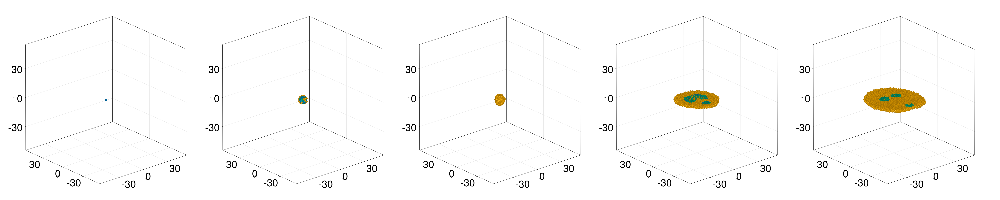

GLMakie.Screen(...)

In [12]:

#_size_=15
_size_ = ((maximum(com.x) - minimum(com.x)) + com.r[1]) / 1.0
_every_=4

fig = Figure(resolution=(5000,1000), figure_padding = 50)
labelsize = 50

# DECIDE IF TO COLOUR ACCORDING TO CELL FATE OR AGGREGATE:
if Colour_according_to_cell_fate == 1
    d = getParameter(com,[:x,:y,:z,:r,:cellFate])
else
    d = getParameter(com,[:x,:y,:z,:r,:cell_aggregate])
end

for (i,pos) in enumerate([1:round(Int64,length(com)/_every_):length(com);length(com)])
    println("Here is i, pos, length(com) = ", i, ", ", pos, ", ", length(com))
    ax = Axis3(fig[1,i],
        xticklabelsize = labelsize,
		yticklabelsize = labelsize,
		zticklabelsize = labelsize,
        aspect = :data)

    if Colour_according_to_cell_fate == 1
        color = [colorMapNum[i] for i in d[:cellFate][pos]]
    else
        color = [colorMapNum[i] for i in d[:cell_aggregate][pos]]
    end
    
    #For transparency:
    #color = [(colorMapNum[i], 0.5) for i in d[:cell_aggregate][pos]]
    meshscatter!(ax,d[:x][pos],d[:y][pos],d[:z][pos],markersize=d[:r][pos],color=color)
    xlims!(ax,-_size_,_size_)
    ylims!(ax,-_size_,_size_)
    zlims!(ax,-_size_,_size_)
end

display(fig)

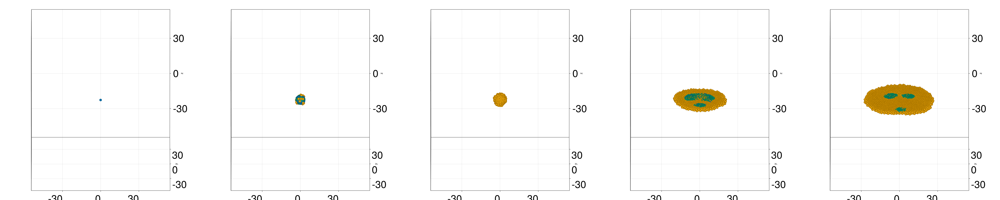

GLMakie.Screen(...)

In [13]:
_size_ = ((maximum(com.x) - minimum(com.x)) + com.r[1]) / 1.0
_every_ = 4

fig = Figure(resolution=(5000,1000))
labelsize = 50

# DECIDE IF TO COLOUR ACCORDING TO CELL FATE OR AGGREGATE:
if Colour_according_to_cell_fate == 1
    d = getParameter(com,[:x,:y,:z,:r,:cellFate])
else
    d = getParameter(com,[:x,:y,:z,:r,:cell_aggregate])
end

for (i,pos) in enumerate([1:round(Int64,length(com)/_every_):length(com);length(com)])
    #println("Here is i, pos, length(com) = ", i, ", ", pos, ", ", length(com))
    ax = Axis3(fig[1,i],
        xticklabelsize = labelsize,
		yticklabelsize = labelsize,
		zticklabelsize = labelsize,
        aspect = :data, 
        azimuth = 1.5 * pi)
    
    if Colour_according_to_cell_fate == 1
        color = [colorMapNum[i] for i in d[:cellFate][pos]]
    else
        color = [colorMapNum[i] for i in d[:cell_aggregate][pos]]
    end
    
    meshscatter!(ax,d[:x][pos],d[:y][pos],d[:z][pos],markersize=d[:r][pos],color=color)
    xlims!(ax,-_size_,_size_)
    ylims!(ax,-_size_,_size_)
    zlims!(ax,-_size_,_size_)
end

display(fig)

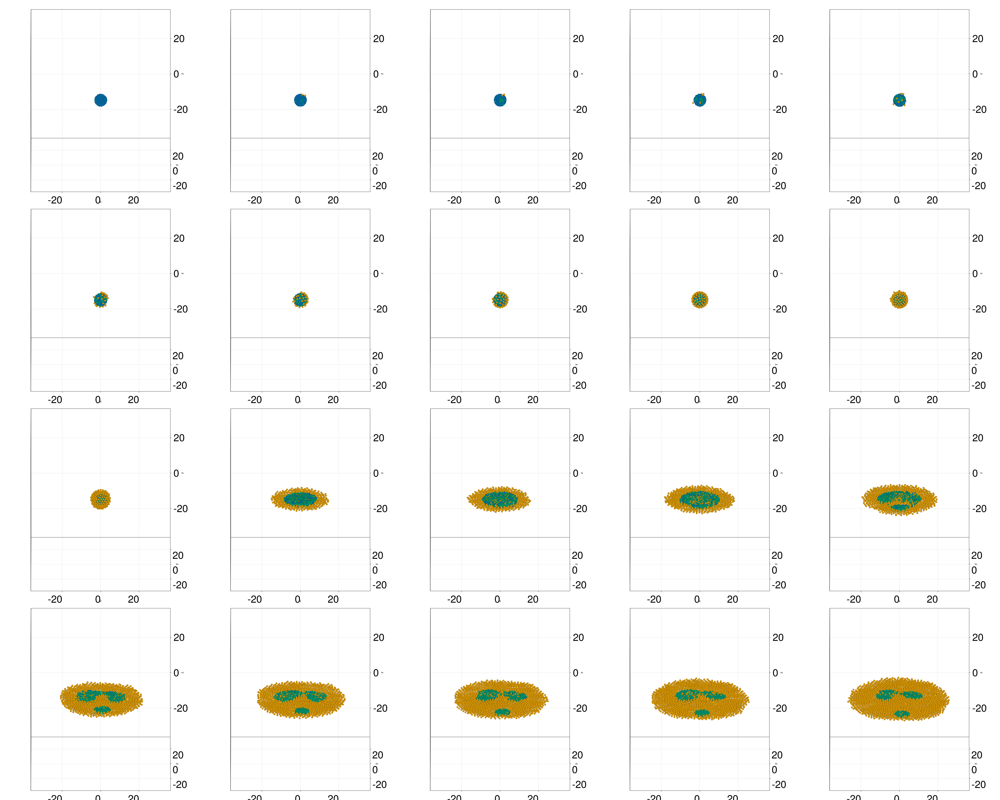

In [14]:
_size_ = ((maximum(com.x) - minimum(com.x)) + com.r[1]) / 1.5
#_size_ = 5
_every_ = 23
_azimuth_ = 1.5
_elevation_ = 0.5
labelsize = 50

fig = Figure(resolution=(5000, 4000))  # Create a larger figure

# Function to add subplots
function add_subplot(row, d, range)
    for (i, pos) in enumerate(range)
        ax = Axis3(fig[row, i], 
            xticklabelsize = labelsize,
            yticklabelsize = labelsize,
            zticklabelsize = labelsize,
            aspect = :data, 
            azimuth = _azimuth_ * π,
            #elevation = _elevation_ * π
        )

        # Corrected color mapping
        if Colour_according_to_cell_fate == 1
            color = [colorMapNum[i] for i in d[:cellFate][pos]]
        else
            color = [colorMapNum[i] for i in d[:cell_aggregate][pos]]
        end

        meshscatter!(ax, d[:x][pos], d[:y][pos], d[:z][pos], markersize=d[:r][pos]*0.5, color=color)
        xlims!(ax, -_size_, _size_)
        ylims!(ax, -_size_, _size_)
        zlims!(ax, -_size_, _size_)
    end
end

# Load data
if Colour_according_to_cell_fate == 1
    d = getParameter(com, [:x, :y, :z, :r, :cellFate])
else
    d = getParameter(com, [:x, :y, :z, :r, :cell_aggregate])
end

# Add the four rows of subplots
add_subplot(1, d, 1+round(Int64, length(com)/_every_):round(Int64, length(com)/_every_):round(Int64, length(com)/4))
add_subplot(2, d, round(Int64, length(com)/4)+round(Int64, length(com)/_every_):round(Int64, length(com)/_every_):round(Int64, length(com)/4*2))
add_subplot(3, d, round(Int64, length(com)/4*2)+round(Int64, length(com)/_every_):round(Int64, length(com)/_every_):round(Int64, length(com)/4*3))
add_subplot(4, d, round(Int64, length(com)/4*3)+round(Int64, length(com)/_every_):round(Int64, length(com)/_every_):length(com))

# Display and save
display(fig)
save("z_snapshots_1.png", fig)


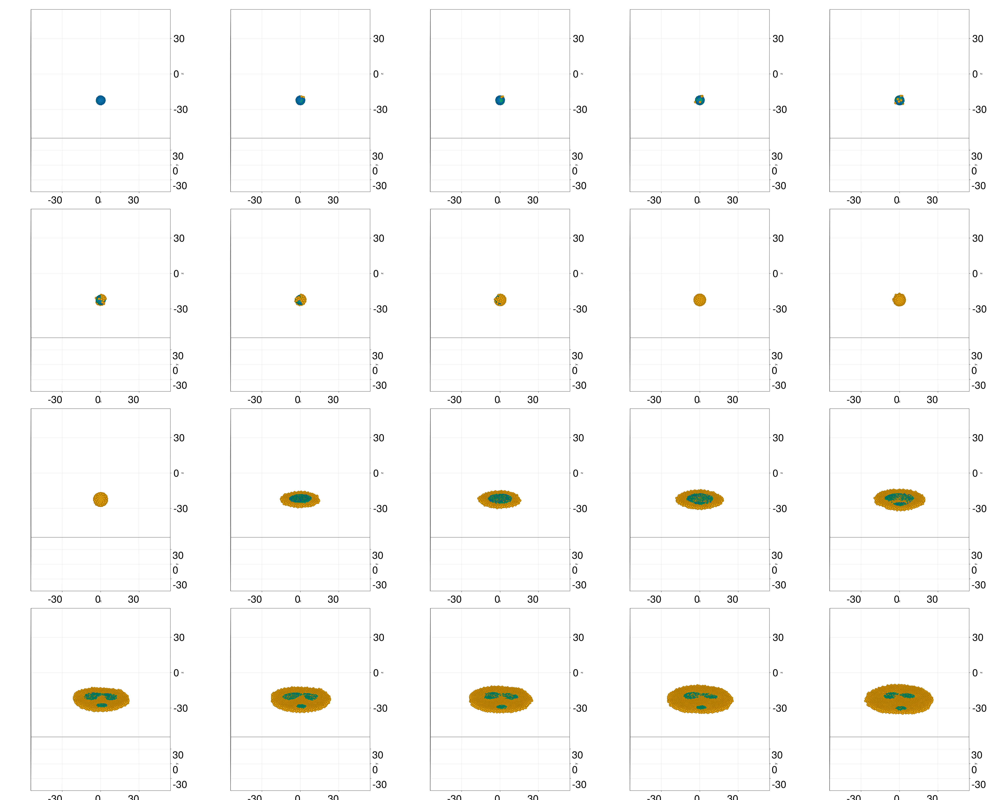

In [15]:
_size_ = ((maximum(com.x) - minimum(com.x)) + com.r[1]) / 1.0
_every_ = 23
_azimuth_ = 1.5
labelsize = 50

fig = Figure(resolution=(5000, 4000))  # Create a larger figure

# Function to add subplots
function add_subplot(row, d, range)
    for (i, pos) in enumerate(range)
        ax = Axis3(fig[row, i], 
            xticklabelsize = labelsize,
            yticklabelsize = labelsize,
            zticklabelsize = labelsize,
            azimuth = _azimuth_ * π,
            aspect = :data)

        # Corrected color mapping
        if Colour_according_to_cell_fate == 1
            color = [colorMapNum[i] for i in d[:cellFate][pos]]
        else
            color = [colorMapNum[i] for i in d[:cell_aggregate][pos]]
        end

        meshscatter!(ax, d[:x][pos], d[:y][pos], d[:z][pos], markersize=d[:r][pos], color=color)
        xlims!(ax, -_size_, _size_)
        ylims!(ax, -_size_, _size_)
        zlims!(ax, -_size_, _size_)
    end
end

# Load data
if Colour_according_to_cell_fate == 1
    d = getParameter(com, [:x, :y, :z, :r, :cellFate])
else
    d = getParameter(com, [:x, :y, :z, :r, :cell_aggregate])
end

# Add the four rows of subplots
add_subplot(1, d, 1+round(Int64, length(com)/_every_):round(Int64, length(com)/_every_):round(Int64, length(com)/4))
add_subplot(2, d, round(Int64, length(com)/4)+round(Int64, length(com)/_every_):round(Int64, length(com)/_every_):round(Int64, length(com)/4*2))
add_subplot(3, d, round(Int64, length(com)/4*2)+round(Int64, length(com)/_every_):round(Int64, length(com)/_every_):round(Int64, length(com)/4*3))
add_subplot(4, d, round(Int64, length(com)/4*3)+round(Int64, length(com)/_every_):round(Int64, length(com)/_every_):length(com))

# Display and save
display(fig)
save("z_snapshots_2.png", fig)


### Make directory for saving output files 



In [16]:
dir_name = "z_results"
mkpath(dir_name)

"z_results"

### Segregation score & Polarisation



In [17]:
t0 = 38.36
tf = steps * dt
t_scale = 4 / 60 #mins
#t0 = 44.24
#t0 = 47.19

0.06666666666666667

In [18]:
d2 = getParameter(com,[:x,:y,:z,:cellFate]);
d2[:cellFate];
df = DataFrame(d2)  # Convert Dict to DataFrame
df[!,1];
#typeof(df[!,1])
#size(df[!,1])
df[8,1];
#df[!,1][8]
last(df, 5)  # preview last 5 rows
first(df, 5)

#names(df)

Row,cellFate,x,y,z
,Array…,Array…,Array…,Array…
1,[1],[0.0],[0.0],[0.0]
2,"[1, 1]","[-0.714439, 0.714439]","[0.700157, -0.700157]","[-0.000289234, 0.000289234]"
3,"[1, 1]","[-0.71421, 0.71421]","[0.699932, -0.699932]","[-0.000289142, 0.000289142]"
4,"[1, 1, 1]","[-1.18448, 0.673686, 0.0515059]","[0.115183, -0.59998, 1.49712]","[0.0258816, -0.00124594, -0.0389955]"
5,"[1, 1, 1]","[-1.24155, 0.668641, 0.170687]","[0.0762582, -0.484332, 1.45932]","[0.0282499, -0.00403894, -0.040939]"


In [19]:
d2 = getParameter(com,[:x,:y,:z,:cellFate,:z_plate_height,:z_substrate_height]);
d2[:cellFate];
df = DataFrame(d2)  # Convert Dict to DataFrame
df[!,1];
typeof(df[!,1])
size(df[!,5])
#df[8,1];
#df[!,1][8]
last(df, 5)  # preview last 5 rows
df
#first(df, 5)

#names(df)

Row,cellFate,x,y,z,z_plate_height,z_substrate_height
,Array…,Array…,Array…,Array…,Array…,Array…
1,[1],[0.0],[0.0],[0.0],[10.0],[-10.0]
2,"[1, 1]","[-0.714439, 0.714439]","[0.700157, -0.700157]","[-0.000289234, 0.000289234]",[10.0],[-10.0]
3,"[1, 1]","[-0.71421, 0.71421]","[0.699932, -0.699932]","[-0.000289142, 0.000289142]",[10.0],[-10.0]
4,"[1, 1, 1]","[-1.18448, 0.673686, 0.0515059]","[0.115183, -0.59998, 1.49712]","[0.0258816, -0.00124594, -0.0389955]",[10.0],[-10.0]
5,"[1, 1, 1]","[-1.24155, 0.668641, 0.170687]","[0.0762582, -0.484332, 1.45932]","[0.0282499, -0.00403894, -0.040939]",[10.0],[-10.0]
6,"[1, 1, 1]","[-1.2495, 0.672079, 0.183145]","[0.0719477, -0.478056, 1.46167]","[0.0285517, -0.00428071, -0.0413008]",[10.0],[-10.0]
7,"[1, 1, 1]","[-1.25042, 0.672419, 0.18468]","[0.0713896, -0.477327, 1.46203]","[0.0285881, -0.00430736, -0.0413472]",[10.0],[-10.0]
8,"[1, 1, 1, 1]","[-1.27488, 0.11913, 0.225667, 1.53965]","[0.147234, -0.785258, 1.32265, -0.0220734]","[0.163609, -0.338005, 0.0408034, 0.371602]",[10.0],[-10.0]
9,"[1, 1, 1, 1]","[-1.14829, 0.154233, 0.268105, 1.43914]","[0.173649, -0.820244, 1.31432, 0.00295146]","[0.254236, -0.472226, 0.00302687, 0.469562]",[10.0],[-10.0]


In [20]:
using DataFrames

times_expanded = Int[]
x_expanded = Float64[]
y_expanded = Float64[]
z_expanded = Float64[]
fate_expanded = Int[]

for (i, row) in enumerate(eachrow(df))  # i is timestep index
    n_cells = length(row.x)
    
    append!(times_expanded, fill(i, n_cells))  # use i as time
    
    append!(x_expanded, row.x)
    append!(y_expanded, row.y)
    append!(z_expanded, row.z)
    append!(fate_expanded, row.cellFate)
end

flat_df = DataFrame(t = times_expanded,
                    x = x_expanded,
                    y = y_expanded,
                    z = z_expanded,
                    cellFate = fate_expanded)

# Now save as CSV
using CSV
CSV.write("$dir_name/cells_flat.csv", flat_df)

"z_results/cells_flat.csv"

In [21]:
using DataFrames, CSV

# Arrays to store flattened cell data
times_expanded = Int[]
x_expanded = Float64[]
y_expanded = Float64[]
z_expanded = Float64[]
fate_expanded = Int[]
z_plate_height_expanded = Float64[]
z_substrate_height_expanded = Float64[]

# Array to store plate positions (one per timestep)
plate_times = Int[]
plate_heights = Float64[]
substrate_heights = Float64[]

for (i, row) in enumerate(eachrow(df))
    # Flatten cells
    for j in eachindex(row.x)
        push!(times_expanded, i)
        push!(x_expanded, row.x[j])
        push!(y_expanded, row.y[j])
        push!(z_expanded, row.z[j])
        push!(fate_expanded, row.cellFate[j])
        push!(z_plate_height_expanded, row.z_plate_height[1])
        push!(z_substrate_height_expanded, row.z_substrate_height[1])
    end

    # Record plate position once per timestep
    push!(plate_times, i)
    push!(plate_heights, row.z_plate_height[1])
    push!(substrate_heights, row.z_substrate_height[1])
end

# Create DataFrame for cells
cells_flat_df = DataFrame(
    t = times_expanded,
    x = x_expanded,
    y = y_expanded,
    z = z_expanded,
    cellFate = fate_expanded,
)

# Create DataFrame for plate positions
plate_df = DataFrame(
    t = plate_times,
    z_plate_height = plate_heights,
    z_substrate_height = substrate_heights,
)

# Save CSVs
CSV.write("$dir_name/cells_flat.csv", cells_flat_df)
CSV.write("$dir_name/plate_positions.csv", plate_df)

"z_results/plate_positions.csv"

#### Segregation score —— New



In [48]:

# --- Function to compute per-cell segregation scores at a given timestep ---
function per_cell_segregation_scores(com, t; cutoff = 2.0)
    d = getParameter(com, [:x, :y, :z, :cellFate])
    x, y, z, fates = d[:x][t], d[:y][t], d[:z][t], d[:cellFate][t]
    N = length(x)

    scores = Float64[]
    fate_scores = Dict{Int, Vector{Float64}}()

    for i in 1:N
        pi = @SVector [x[i], y[i], z[i]]
        fi = fates[i]

        same_fate = 0
        total_neighbors = 0

        for j in 1:N
            if i == j
                continue
            end
            pj = @SVector [x[j], y[j], z[j]]
            if euclidean(pi, pj) < cutoff
                total_neighbors += 1
                same_fate += (fates[j] == fi) ? 1 : 0
            end
        end

        score = total_neighbors > 0 ? same_fate / total_neighbors : 0.0
        push!(scores, score)
        push!(get!(fate_scores, fi, Float64[]), score)
    end

    return scores, fate_scores
end

per_cell_segregation_scores (generic function with 1 method)

In [21]:

# --- Loop over time to collect segregation scores ---
timesteps = 1:length(com)
mean_scores = Float64[]
std_scores = Float64[]

fate_scores = Dict{Int, Vector{Float64}}()
fate_stds = Dict{Int, Vector{Float64}}()

for (t_idx, t) in enumerate(timesteps)
    scores, scores_by_fate = per_cell_segregation_scores(com, t; cutoff = 2.0)

    # Whole system
    push!(mean_scores, mean(scores))
    push!(std_scores, std(scores))

    # Collect all fates seen so far
    all_fates = union(keys(fate_scores), keys(scores_by_fate))

    for fate in all_fates
        # Handle new fates by padding with NaNs
        if !haskey(fate_scores, fate)
            fate_scores[fate] = fill(NaN, t_idx - 1)
            fate_stds[fate] = fill(NaN, t_idx - 1)
        end

        if haskey(scores_by_fate, fate)
            fs = scores_by_fate[fate]
            push!(fate_scores[fate], mean(fs))
            push!(fate_stds[fate], std(fs))
        else
            push!(fate_scores[fate], NaN)
            push!(fate_stds[fate], NaN)
        end
    end
end

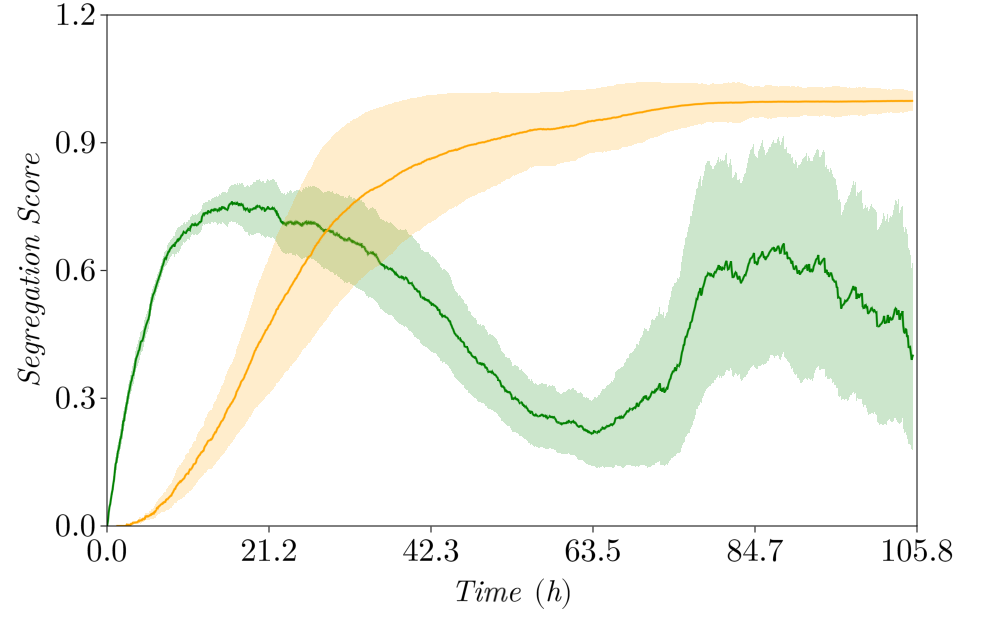

In [22]:
using GLMakie, LaTeXStrings

# --- Plotting ---
sim_start_time = t0
#t0 = sim_start_time
#x_lim_min = 45
x_lim_min = t0
x_lim_max = tf + 5
fontsize = 32


## Compute tick positions (on the original x scale)
#xtick_positions = range(x_lim_min, x_lim_max; length=6)

## Convert them to hours for labels, then to LaTeXStrings
#xtick_labels = round.(((xtick_positions .- t0) .* 10 ./ 60); digits=1)
#xtick_labels_latex = [latexstring(string(val)) for val in xtick_labels]

# Compute tick positions (on the original x scale)
xtick_positions = range(x_lim_min, x_lim_max; length=6)

# Set t0 as reference time: the tick closest to it should be labeled 0.0
#xtick_labels = round.(((xtick_positions .- t0) .* 10 ./ 60); digits=1)
xtick_labels = round.(((xtick_positions .- t0) .* t_scale); digits=1)

# Replace -0.0 with 0.0
xtick_labels = map(x -> x == -0.0 ? 0.0 : x, xtick_labels)

xtick_labels_latex = [latexstring(string(val)) for val in xtick_labels]

# Y-ticks, for example 0 to 1.2 in 5 steps, all LaTeXStrings
ytick_positions = range(0, 1.2; length=5)
ytick_labels_latex = [latexstring(string(round(val, digits=2))) for val in ytick_positions]

fig = Figure(resolution = (1000, 625))
ax = Axis(fig[1, 1],
    xlabel = L"Time \,\; (h)",
    ylabel = L"Segregation \,\, Score",
    xlabelsize = fontsize-2,
    ylabelsize = fontsize-2,
    titlesize = fontsize+4,
    xticks = (xtick_positions, xtick_labels_latex),
    yticks = (ytick_positions, ytick_labels_latex),
    xticklabelsize = fontsize,
    yticklabelsize = fontsize,
    xgridvisible = false,
    ygridvisible = false,
    ylabelpadding = 10,  # <-- increase this number as needed
    xlabelpadding = 10,  # <-- increase this number as needed
)

# Add empty slot in second column to add spacing
fig[1, 2] = GridLayout()  # acts like a blank spacer
colsize!(fig.layout, 2, Relative(0.05))

ylims!(ax, 0, 1.2)
xlims!(ax, x_lim_min, x_lim_max)

# Overall system curve (black)
#band!(ax, timesteps, mean_scores .- std_scores, mean_scores .+ std_scores;
#    color = (:gray, 0.3))
#lines!(ax, timesteps, mean_scores;
#    color = :black, linewidth = 2)

# Example plotting loop, make sure you define `fate_scores`, `fate_stds`, `timesteps` somewhere
colors = [:blue, :green, :orange, :yellow, :purple, :teal, :brown, :red]
color_keys = sort(collect(keys(fate_scores)))

for (i, fate) in enumerate(color_keys)
    if i == 1  # skip the first fate (blue line)
        continue
    end
    color = colors[mod1(i, length(colors))]
    fs = fate_scores[fate]
    stds = fate_stds[fate]

    band!(ax, timesteps, fs .- stds, fs .+ stds; color = (color, 0.2))
    lines!(ax, timesteps, fs; color = color, linewidth = 2, label = "Fate $fate")
end

fig
display(fig)
save("z_segregation_score_per_fate.png", fig; px_per_unit = 4)


In [23]:
#using CSV, DataFrames
#
## Export global segregation scores
#global_df = DataFrame(timestep = timesteps,
#                      mean_score = mean_scores,
#                      std_score = std_scores)
#CSV.write("z_results_compare/global_segregation_scores.csv", global_df)
#
## Export per-fate segregation scores
#for (fate, scores) in fate_scores
#    stds = fate_stds[fate]
#    df_temp = DataFrame(timestep = timesteps,
#                   mean_score = scores,
#                   std_score = stds)
#    CSV.write("z_results_compare/fate_$fate.csv", df_temp)
#end


In [24]:
using CSV, DataFrames

combined_df = DataFrame(timestep = Int[], fate = String[], mean_score = Float64[], std_score = Float64[])

# Add global data
for (i, t) in enumerate(timesteps)
    push!(combined_df, (t, "all", mean_scores[i], std_scores[i]))
end

# Add fate-specific data
for (fate, scores) in fate_scores
    stds = fate_stds[fate]
    for (i, t) in enumerate(timesteps)
        push!(combined_df, (t, string(fate), scores[i], stds[i]))
    end
end

CSV.write("$dir_name/segregation_scores_combined.csv", combined_df)


"z_results/segregation_scores_combined.csv"

In [25]:
using DataFrames

# Filter combined_df to get only mean segregation scores (not std)
mean_df = combined_df[:, [:timestep, :fate, :mean_score]]

# Pivot the table so that each fate becomes a column
wide_df = unstack(mean_df, :fate, :mean_score)

# Optionally rename columns for clarity
rename!(wide_df, Dict(
    "all" => "score_all",
    "1" => "score_1",
    "2" => "score_2",
    "3" => "score_3"
))

# Sort by timestep just in case
sort!(wide_df, :timestep)

# Save to CSV (optional)
CSV.write("z_results/segregation_scores_wide.csv", wide_df)


"z_results/segregation_scores_wide.csv"

#### Polarisation



In [31]:
min_cluster_size = 30
cutoff = 1.5
#t0 = 39.54

1.5

In [32]:
using DataFrames, LinearAlgebra, Distances, StaticArrays, Statistics

function biggest_cluster_com(
    df::DataFrame, 
    timestep::Int, 
    fate_value::Int, 
    cutoff::Float64, 
    min_cluster_size::Int = 1
)

    # 1. Extract arrays at given timestep
    cellfates = df[timestep, 1]
    x = df[timestep, 2]
    y = df[timestep, 3]
    z = df[timestep, 4]

    # 2. Compute global center of mass
    global_com = (
        x = mean(x),
        y = mean(y),
        z = mean(z)
    )

    # 3. Filter particles with desired fate
    idxs = findall(f -> f == fate_value, cellfates)
    if isempty(idxs)
        return (
            #cluster_com = (x = -2.0, y = -2.0, z = -2.0),
            cluster_com = (x = 0, y = 0, z = 0),
            #global_com = global_com,
            global_com = (x = 0, y = 0, z = 0),
            #relative_com = (x = -2.0, y = -2.0, z = -2.0),
            relative_com = (x = 0, y = 0, z = 0),
        )
    end

    # Coordinates of selected particles
    coords = [SVector(x[i], y[i], z[i]) for i in idxs]

    # 4. Cluster using cutoff
    n = length(coords)
    visited = falses(n)
    clusters = Vector{Vector{Int}}()

    for i in 1:n
        if visited[i]
            continue
        end
        neighbors = [j for j in 1:n if euclidean(coords[i], coords[j]) ≤ cutoff]
        if length(neighbors) > 1
            cluster = Set(neighbors)
            new_members = Set(neighbors)
            while !isempty(new_members)
                current = pop!(new_members)
                visited[current] = true
                next_neighbors = [j for j in 1:n if euclidean(coords[current], coords[j]) ≤ cutoff && !(j in cluster)]
                foreach(j -> push!(new_members, j), next_neighbors)
                union!(cluster, next_neighbors)
            end
            push!(clusters, collect(cluster))
        else
            visited[i] = true
        end
    end

    if isempty(clusters)
        return (
            #cluster_com = (x = -1.0, y = -1.0, z = -1.0),
            cluster_com = (x = 0.0, y = 0.0, z = 0.0),
            #global_com = global_com,
            global_com = (x = 0.0, y = 0.0, z = 0.0),
            #relative_com = (x = -1.0, y = -1.0, z = -1.0),
            relative_com = (x = 0.0, y = 0.0, z = 0.0),
        )
    end

    # 5. Find largest cluster
    largest = argmax(length.(clusters))
    cluster_indices = clusters[largest]
    
    if length(cluster_indices) < min_cluster_size
        return (
            #cluster_com = (x = -1.0, y = -1.0, z = -1.0),
            cluster_com = (x = 0.0, y = 0.0, z = 0.0),
            #global_com = global_com,
            global_com = (x = 0.0, y = 0.0, z = 0.0),
            #relative_com = (x = -1.0, y = -1.0, z = -1.0),
            relative_com = (x = 0.0, y = 0.0, z = 0.0),
        )
    end

    original_idxs = idxs[cluster_indices]
    cluster_com = (
        x = mean(x[original_idxs]),
        y = mean(y[original_idxs]),
        z = mean(z[original_idxs])
    )

    relative_com = (
        x = cluster_com.x - global_com.x,
        y = cluster_com.y - global_com.y,
        z = cluster_com.z - global_com.z
    )

    return (
        cluster_com = cluster_com,
        global_com = global_com,
        relative_com = relative_com
    )
end


biggest_cluster_com (generic function with 2 methods)

In [33]:
# FORMAT: biggest_cluster_com(df, timestep, cellFate, cutoff, Nmin):
result = biggest_cluster_com(df, 25, 1, 2.0, 20)

println("Cluster COM: ", result.cluster_com)
println("Global COM: ", result.global_com)
println("Relative COM: ", result.relative_com)


Cluster COM: (x = 0.01257040463005143, y = 0.13257227786505252, z = 0.31104823794770853)
Global COM: (x = 0.012570404630051435, y = 0.1325722778650525, z = 0.31104823794770853)
Relative COM: (x = -5.204170427930421e-18, y = 2.7755575615628914e-17, z = 0.0)


In [34]:
using DataFrames, LinearAlgebra, Distances, StaticArrays, Statistics

function biggest_cluster_com_2(
    df::DataFrame, 
    timestep::Int, 
    fate_value::Int, 
    cutoff::Float64, 
    min_cluster_size::Int = 1
)

    # 1. Extract arrays at given timestep
    cellfates = df[timestep, 1]
    x = df[timestep, 2]
    y = df[timestep, 3]
    z = df[timestep, 4]

    # 2. Compute global center of mass
    global_com = (
        x = mean(x),
        y = mean(y),
        z = mean(z)
    )

    # 3. Filter particles with desired fate
    idxs = findall(f -> f == fate_value, cellfates)
    if isempty(idxs)
        return (
            cluster_com = (x = 0.0, y = 0.0, z = 0.0),
            global_com = global_com,
            relative_com = (x = 0.0, y = 0.0, z = 0.0),
            cluster_size = 0
        )
    end

    # Coordinates of selected particles
    coords = [SVector(x[i], y[i], z[i]) for i in idxs]

    # 4. Cluster using cutoff
    n = length(coords)
    visited = falses(n)
    clusters = Vector{Vector{Int}}()

    for i in 1:n
        if visited[i]
            continue
        end
        neighbors = [j for j in 1:n if euclidean(coords[i], coords[j]) <= cutoff]
        if length(neighbors) > 1
            cluster = Set(neighbors)
            new_members = Set(neighbors)
            while !isempty(new_members)
                current = pop!(new_members)
                visited[current] = true
                next_neighbors = [j for j in 1:n if euclidean(coords[current], coords[j]) <= cutoff && !(j in cluster)]
                foreach(j -> push!(new_members, j), next_neighbors)
                union!(cluster, next_neighbors)
            end
            push!(clusters, collect(cluster))
        else
            visited[i] = true
        end
    end

    # 5. Handle no clusters found
    if isempty(clusters)
        return (
            cluster_com = (x = 0.0, y = 0.0, z = 0.0),
            global_com = global_com,
            relative_com = (x = 0.0, y = 0.0, z = 0.0),
            cluster_size = 0
        )
    end

    # 6. Find largest cluster
    largest = argmax(length.(clusters))
    cluster_indices = clusters[largest]
    size_largest = length(cluster_indices)

    # 7. Respect min_cluster_size
    if size_largest < min_cluster_size
        return (
            cluster_com = (x = 0.0, y = 0.0, z = 0.0),
            global_com = global_com,
            relative_com = (x = 0.0, y = 0.0, z = 0.0),
            #cluster_size = 0
            cluster_size = size_largest
        )
    end

    # 8. Compute COM of the largest cluster
    original_idxs = idxs[cluster_indices]
    cluster_com = (
        x = mean(x[original_idxs]),
        y = mean(y[original_idxs]),
        z = mean(z[original_idxs])
    )

    relative_com = (
        x = cluster_com.x - global_com.x,
        y = cluster_com.y - global_com.y,
        z = cluster_com.z - global_com.z
    )

    return (
        cluster_com = cluster_com,
        global_com = global_com,
        relative_com = relative_com,
        cluster_size = size_largest
    )
end

biggest_cluster_com_2 (generic function with 2 methods)

In [35]:
# FORMAT: biggest_cluster_com(df, timestep, cellFate, cutoff, Nmin):
result = biggest_cluster_com_2(df, 350, 2, 2.0, 300)

println("Cluster COM: ", result.cluster_com)
println("Global COM: ", result.global_com)
println("Relative COM: ", result.relative_com)
println("COM cluster size: ", result.cluster_size)

Cluster COM: (x = 0.0, y = 0.0, z = 0.0)
Global COM: (x = 0.1044953699889827, y = 0.09787437565256826, z = 0.20213960300954564)
Relative COM: (x = 0.0, y = 0.0, z = 0.0)
COM cluster size: 196


In [36]:
function compute_com_series(df::DataFrame, fate_value::Int, cutoff::Float64, min_cluster_size::Int = 1)
    results = []

    for t in 1:size(df, 1)
        result = biggest_cluster_com(df, t, fate_value, cutoff, min_cluster_size)

        push!(results, (
            timestep = t,
            cluster_x = result.cluster_com.x,
            cluster_y = result.cluster_com.y,
            cluster_z = result.cluster_com.z,
            global_x = result.global_com.x,
            global_y = result.global_com.y,
            global_z = result.global_com.z,
            rel_x = result.relative_com.x,
            rel_y = result.relative_com.y,
            rel_z = result.relative_com.z,
            rel_dist = norm([
                result.relative_com.x,
                result.relative_com.y,
                result.relative_com.z
            ])
        ))
    end

    df_result = DataFrame(results)

    # Compute normalized norm (skip negative marker values)
    valid_norms = filter(!isnan, filter(x -> x ≥ 0, df_result.rel_dist))
    max_norm = isempty(valid_norms) ? NaN : maximum(valid_norms)

    df_result.rel_dist_norm = if isnan(max_norm) || max_norm == 0
        fill(NaN, size(df_result, 1))
    else
        [r ≥ 0 ? r / max_norm : r for r in df_result.rel_dist]
    end

    return df_result
end


compute_com_series (generic function with 2 methods)

In [37]:
#min_cluster_size = 200
#cutoff = 2.0
cell_fate = 2
# FORMAT: compute_com_series(df, cellFate, cutoff, min_cluster_size):
df_com_series = compute_com_series(df, cell_fate, cutoff, min_cluster_size)

#first(df_com_series, 5)  # preview first 5 rows
last(df_com_series, 5)  # preview last 5 rows


Row,timestep,cluster_x,cluster_y,cluster_z,global_x,global_y,global_z,rel_x,rel_y,rel_z,rel_dist,rel_dist_norm
,Int64,Float64,Float64,Float64,Float64,Float64,Float64,Float64,Float64,Float64,Float64,Float64
1,1896,-7.63793,0.418334,0.665781,1.44178,0.15504,0.000840263,-9.07971,0.263294,0.664941,9.10783,0.995851
2,1897,-7.62184,0.424821,0.66555,1.44118,0.155177,0.000199169,-9.06302,0.269644,0.665351,9.09141,0.994055
3,1898,-7.60484,0.445318,0.67093,1.44312,0.155907,0.00286905,-9.04796,0.289411,0.668061,9.07721,0.992502
4,1899,-7.59985,0.450081,0.672768,1.44293,0.155784,0.00241192,-9.04278,0.294297,0.670356,9.07237,0.991973
5,1900,-7.59723,0.453484,0.674512,1.44307,0.155891,0.001246,-9.0403,0.297593,0.673266,9.07022,0.991738


In [38]:
# Set parameters


In [39]:
function compute_com_series_2(df::DataFrame, fate_value::Int, cutoff::Float64, min_cluster_size::Int = 1)
    results = []

    for t in 1:size(df, 1)
        result = biggest_cluster_com_2(df, t, fate_value, cutoff, min_cluster_size)

        push!(results, (
            timestep = t,
            cluster_x = result.cluster_com.x,
            cluster_y = result.cluster_com.y,
            cluster_z = result.cluster_com.z,
            global_x = result.global_com.x,
            global_y = result.global_com.y,
            global_z = result.global_com.z,
            rel_x = result.relative_com.x,
            rel_y = result.relative_com.y,
            rel_z = result.relative_com.z,
            cluster_size = result.cluster_size,
            rel_dist = norm([
                result.relative_com.x,
                result.relative_com.y,
                result.relative_com.z
            ])
        ))
    end

    df_result = DataFrame(results)

    # Compute normalized norm (skip negative marker values)
    valid_norms = filter(!isnan, filter(x -> x ≥ 0, df_result.rel_dist))
    max_norm = isempty(valid_norms) ? NaN : maximum(valid_norms)

    df_result.rel_dist_norm = if isnan(max_norm) || max_norm == 0
        fill(NaN, size(df_result, 1))
    else
        [r ≥ 0 ? r / max_norm : r for r in df_result.rel_dist]
    end

    return df_result
end

compute_com_series_2 (generic function with 2 methods)

In [40]:
#min_cluster_size = 300
#cutoff = 2.0
cell_fate = 2
# FORMAT: compute_com_series(df, cellFate, cutoff, min_cluster_size):
df_com_series = compute_com_series_2(df, cell_fate, cutoff, min_cluster_size)

#first(df_com_series, 5)  # preview first 5 rows
last(df_com_series, 5)  # preview last 5 rows

Row,timestep,cluster_x,cluster_y,cluster_z,global_x,global_y,global_z,rel_x,rel_y,rel_z,cluster_size,rel_dist,rel_dist_norm
,Int64,Float64,Float64,Float64,Float64,Float64,Float64,Float64,Float64,Float64,Int64,Float64,Float64
1,1896,-7.63793,0.418334,0.665781,1.44178,0.15504,0.000840263,-9.07971,0.263294,0.664941,96,9.10783,0.995851
2,1897,-7.62184,0.424821,0.66555,1.44118,0.155177,0.000199169,-9.06302,0.269644,0.665351,96,9.09141,0.994055
3,1898,-7.60484,0.445318,0.67093,1.44312,0.155907,0.00286905,-9.04796,0.289411,0.668061,95,9.07721,0.992502
4,1899,-7.59985,0.450081,0.672768,1.44293,0.155784,0.00241192,-9.04278,0.294297,0.670356,95,9.07237,0.991973
5,1900,-7.59723,0.453484,0.674512,1.44307,0.155891,0.001246,-9.0403,0.297593,0.673266,95,9.07022,0.991738


In [41]:
using GLMakie, DataFrames, LaTeXStrings

#sim_start_time = 47.28
sim_start_time = t0
#t0 = 46.48
#x_lim_min = 45
x_lim_min = t0
x_lim_max = tf + 5

function plot_relative_com_evolution_2(com_df::DataFrame; normalized=true, min_cluster_size=min_cluster_size, fontsize=30, padding_frac=0.05)
    rel_dist_col = normalized ? :rel_dist_norm : :rel_dist
    valid_mask = com_df[!, rel_dist_col] .> 0
    cluster_sizes = com_df.cluster_size

    min_size = isnothing(min_cluster_size) ? minimum(cluster_sizes) : min_cluster_size
    max_size = maximum(cluster_sizes)
    norm_sizes = max_size > min_size ? (cluster_sizes .- min_size) ./ (max_size - min_size) : fill(0.5, length(cluster_sizes))
    cmap = :viridis

    x_valid = com_df.timestep[valid_mask]
    y_valid = com_df[valid_mask, rel_dist_col]
    c_valid = norm_sizes[valid_mask]

    # X-axis: first and last tick exactly at data boundaries + 2 intermediate ticks
    xmin_data = minimum(x_valid)
    xmax_data = maximum(x_valid)
    xrange = xmax_data - xmin_data

    first_tick = xmin_data
    last_tick = xmax_data
    n_intermediate = 2

    intermediate_ticks = collect(range(first_tick, last_tick; length=n_intermediate + 2))[2:end-1]
    xtick_positions = vcat(first_tick, intermediate_ticks, last_tick)
    #xtick_labels = round.((xtick_positions .* 10 ./ 60); digits=1)
    #xtick_labels_latex = [latexstring(string(val)) for val in xtick_labels]
    xtick_labels = round.(((xtick_positions .- t0) .* t_scale); digits=1)
    xtick_labels_latex = [latexstring(string(val)) for val in xtick_labels]

    xmin_padded = xmin_data - padding_frac * xrange
    xmax_padded = xmax_data + padding_frac * xrange

    # Y-axis: first tick exactly zero, padding only on top
    y_min = 0
    y_max = maximum(y_valid)
    y_range = y_max - y_min
    y_max_padded = y_max + padding_frac * y_range

    n_yticks = 5
    y_tick_positions = range(y_min, y_max_padded; length=n_yticks)
    y_tick_labels_latex = [latexstring(string(round(val, digits=2))) for val in y_tick_positions]

    fig = Figure(resolution = (900, 600))
    ax = Axis(fig[1, 1],
        xlabel = L"Time \, (h)",
        ylabel = normalized ? L"Normalized \, Relative \, COM \, Distance" : L"Relative \, COM \, Distance \,\; (r)",
        xlabelsize = fontsize,
        ylabelsize = fontsize,
        titlesize = fontsize + 4,
        xticklabelsize = fontsize - 2,
        yticklabelsize = fontsize - 2,
        xticks = (xtick_positions, xtick_labels_latex),
        yticks = (y_tick_positions, y_tick_labels_latex),
        ylabelpadding = 10,  # <-- increase this number as needed
        xlabelpadding = 10,  # <-- increase this number as needed
    )
    ax.xgridvisible = false
    ax.ygridvisible = false

    xlims!(ax, xmin_padded, xmax_padded)
    ylims!(ax, y_min, y_max_padded)

    scatter!(ax, x_valid, y_valid, color = c_valid, colormap = cmap, markersize = 12)

    cb_ticks = round.(Int, range(min_size, max_size; length=3))
    cb_tick_labels_latex = [latexstring(string(val)) for val in cb_ticks]

    cb = Colorbar(fig[1, 2],
        colormap = cmap,
        limits = (min_size, max_size),
        label = L"Cluster \, Size \,\; (cells)",
        labelsize = fontsize,
        ticklabelsize = fontsize,
        ticks = (cb_ticks, cb_tick_labels_latex),
        width = 20,
        height = Relative(1),
        labelpadding = 10,  # Increase this to add more space
    )

    return fig
end


plot_relative_com_evolution_2 (generic function with 1 method)

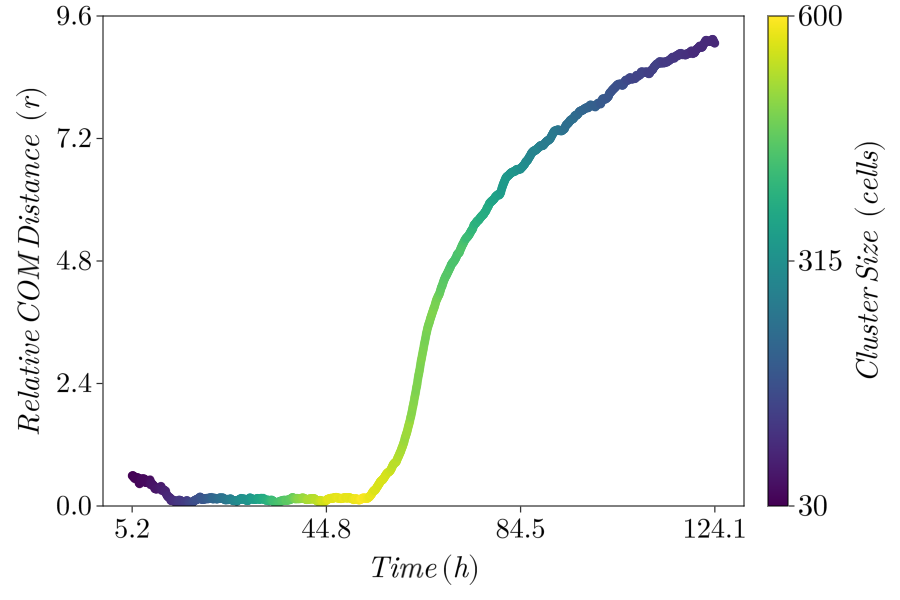

In [42]:
fig = plot_relative_com_evolution_2(df_com_series; normalized=false, min_cluster_size)
display(fig)
save("z_colored_relative_com_evolution.png", fig)


In [43]:
function plot_relative_com_evolution(com_df::DataFrame; normalized=true)
    # Choose data column
    rel_dist_col = normalized ? :rel_dist_norm : :rel_dist

    # Logical masks
    valid_mask = com_df[!, rel_dist_col] .> 0
    invalid_mask = .!valid_mask

    # Start a figure
    fig = Figure(resolution = (800, 500))
    ax = Axis(fig[1, 1], 
        xlabel = "Time step",
        ylabel = normalized ? "Normalized Relative COM Distance" : "Relative COM Distance",
        title = "Temporal Evolution of Relative Distance"
    )

    #ylims!(ax, 0, 1.2)
    #xlims!(ax, minimum(timesteps), maximum(timesteps))
    #xlims!(ax, 35, 355)
    xlims!(ax, t0, tf)

    # Plot valid values
    lines!(ax, com_df.timestep[valid_mask], com_df[valid_mask, rel_dist_col],
        color = :dodgerblue,
        linewidth = 2,
        label = "Valid"
    )

    # Mark invalid values
    scatter!(ax, com_df.timestep[invalid_mask], com_df[invalid_mask, rel_dist_col],
        color = :red,
        marker = :x,
        markersize = 8,
        label = "Invalid or Missing"
    )

    axislegend(ax; position = :lt)
    fig
end


plot_relative_com_evolution (generic function with 1 method)

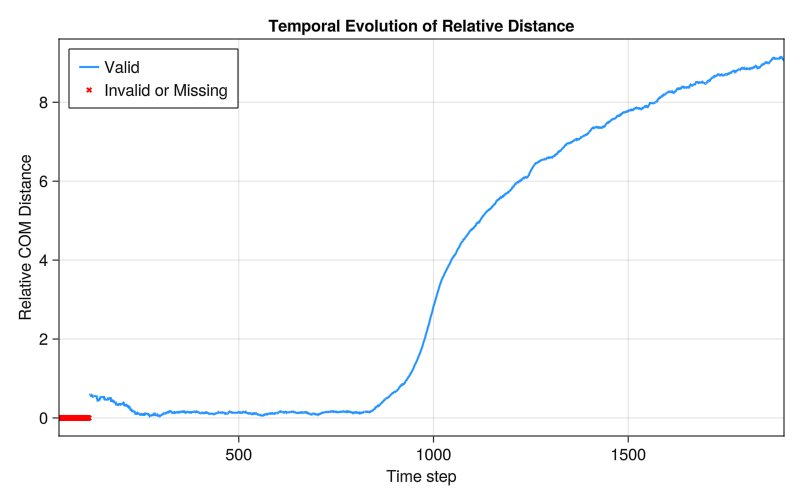

In [44]:
fig = plot_relative_com_evolution(df_com_series, normalized=false)
display(fig)
save("z_com_evolution.png", fig)  # Save to file if you want


In [45]:
function get_largest_cluster_diameter(
    df::DataFrame, 
    fate_value::Int, 
    cutoff::Float64, 
    min_cluster_size::Int = 1;
    t_start::Int = 1  # default to the first timepoint
)
    max_cluster_diameter = 0.0
    system_diameter = 0.0

    for t in 1:size(df, 1)
        # Extract relevant particles
        cellfates = df[t, 1]
        x = df[t, 2]
        y = df[t, 3]
        z = df[t, 4]

        idxs = findall(f -> f == fate_value, cellfates)
        if isempty(idxs)
            continue
        end

        coords = [SVector(x[i], y[i], z[i]) for i in idxs]
        n = length(coords)
        visited = falses(n)
        clusters = Vector{Vector{Int}}()

        for i in 1:n
            if visited[i]
                continue
            end
            neighbors = [j for j in 1:n if euclidean(coords[i], coords[j]) ≤ cutoff]
            if length(neighbors) > 1
                cluster = Set(neighbors)
                new_members = Set(neighbors)
                while !isempty(new_members)
                    current = pop!(new_members)
                    visited[current] = true
                    next_neighbors = [j for j in 1:n if euclidean(coords[current], coords[j]) ≤ cutoff && !(j in cluster)]
                    foreach(j -> push!(new_members, j), next_neighbors)
                    union!(cluster, next_neighbors)
                end
                push!(clusters, collect(cluster))
            else
                visited[i] = true
            end
        end

        if !isempty(clusters)
            largest = argmax(length.(clusters))
            cluster_indices = clusters[largest]

            if length(cluster_indices) ≥ min_cluster_size
                points = [coords[i] for i in cluster_indices]
                d = maximum(pairwise(Euclidean(), points))
                max_cluster_diameter = max(max_cluster_diameter, d)
            end
        end
    end

    # Compute system-wide diameter at t_start
    x_all = df[t_start, 2]
    y_all = df[t_start, 3]
    z_all = df[t_start, 4]
    coords_all = [SVector(x_all[i], y_all[i], z_all[i]) for i in 1:length(x_all)]
    system_diameter = maximum(pairwise(Euclidean(), coords_all))

    return max_cluster_diameter, system_diameter
end


get_largest_cluster_diameter (generic function with 2 methods)

In [46]:
cell_fate = 2
cluster_d, system_d = get_largest_cluster_diameter(df, cell_fate, cutoff, min_cluster_size; t_start = Int64(ceil(t0+5)))
println("Cluster diameter: ", cluster_d)
println("System diameter at t=50: ", system_d)

Cluster diameter: 6.557343398909628
System diameter at t=50: 6.025020192433495


In [47]:
function compute_com_series_norm_diameter(df::DataFrame, fate_value::Int, cutoff::Float64, min_cluster_size::Int = 1)
    results = []

    for t in 1:size(df, 1)
        result = biggest_cluster_com_2(df, t, fate_value, cutoff, min_cluster_size)

        push!(results, (
            timestep = t,
            cluster_x = result.cluster_com.x,
            cluster_y = result.cluster_com.y,
            cluster_z = result.cluster_com.z,
            global_x = result.global_com.x,
            global_y = result.global_com.y,
            global_z = result.global_com.z,
            rel_x = result.relative_com.x,
            rel_y = result.relative_com.y,
            rel_z = result.relative_com.z,
            cluster_size = result.cluster_size,
            rel_dist = norm([
                result.relative_com.x,
                result.relative_com.y,
                result.relative_com.z
            ])
        ))
    end

    df_result = DataFrame(results)

    # Compute normalized norm (skip negative marker values)
    valid_norms = filter(!isnan, filter(x -> x ≥ 0, df_result.rel_dist))
    max_norm = isempty(valid_norms) ? NaN : maximum(valid_norms)

    df_result.rel_dist_norm = if isnan(max_cluster_size) || max_cluster_size == 0
        fill(NaN, size(df_result, 1))
    else
        [r ≥ 0 ? r / max_cluster_size : r for r in df_result.rel_dist]
    end

    return df_result
end

compute_com_series_norm_diameter (generic function with 2 methods)

In [48]:
#min_cluster_size = 300
#cutoff = 2.0
cell_fate = 2
max_cluster_size = system_d
# FORMAT: compute_com_series(df, cellFate, cutoff, min_cluster_size):
df_com_series = compute_com_series_norm_diameter(df, cell_fate, cutoff, min_cluster_size)

#first(df_com_series, 5)  # preview first 5 rows
last(df_com_series, 5)  # preview last 5 rows

Row,timestep,cluster_x,cluster_y,cluster_z,global_x,global_y,global_z,rel_x,rel_y,rel_z,cluster_size,rel_dist,rel_dist_norm
,Int64,Float64,Float64,Float64,Float64,Float64,Float64,Float64,Float64,Float64,Int64,Float64,Float64
1,1896,-7.63793,0.418334,0.665781,1.44178,0.15504,0.000840263,-9.07971,0.263294,0.664941,96,9.10783,1.51167
2,1897,-7.62184,0.424821,0.66555,1.44118,0.155177,0.000199169,-9.06302,0.269644,0.665351,96,9.09141,1.50894
3,1898,-7.60484,0.445318,0.67093,1.44312,0.155907,0.00286905,-9.04796,0.289411,0.668061,95,9.07721,1.50659
4,1899,-7.59985,0.450081,0.672768,1.44293,0.155784,0.00241192,-9.04278,0.294297,0.670356,95,9.07237,1.50578
5,1900,-7.59723,0.453484,0.674512,1.44307,0.155891,0.001246,-9.0403,0.297593,0.673266,95,9.07022,1.50543


In [49]:
#cutoff = 2.0
#min_cluster_size = 300
cell_fate_main = 2 # CellFate we are interested in
cell_fate_ref = 3 # Size of largest cluster of given cellFate to be used as normalisation factor for distance

# Compute max cluster size for fate = 3
#max_cluster_size = get_largest_cluster_diameter(df, cell_fate_ref, cutoff, min_cluster_size)
max_cluster_size = system_d

# Run normal computation
df_com_series_2 = compute_com_series_norm_diameter(df, cell_fate_main, cutoff, min_cluster_size)

# Inject normalized distances (by fate=3 cluster size)
df_com_series_2.rel_dist_norm = if isnan(max_cluster_size) || max_cluster_size == 0
    fill(NaN, size(df_com_series_2, 1))
else
    [r ≥ 0 ? r / max_cluster_size : r for r in df_com_series_2.rel_dist]
end;

last(df_com_series_2, 5)  # preview last 5 rows

Row,timestep,cluster_x,cluster_y,cluster_z,global_x,global_y,global_z,rel_x,rel_y,rel_z,cluster_size,rel_dist,rel_dist_norm
,Int64,Float64,Float64,Float64,Float64,Float64,Float64,Float64,Float64,Float64,Int64,Float64,Float64
1,1896,-7.63793,0.418334,0.665781,1.44178,0.15504,0.000840263,-9.07971,0.263294,0.664941,96,9.10783,1.51167
2,1897,-7.62184,0.424821,0.66555,1.44118,0.155177,0.000199169,-9.06302,0.269644,0.665351,96,9.09141,1.50894
3,1898,-7.60484,0.445318,0.67093,1.44312,0.155907,0.00286905,-9.04796,0.289411,0.668061,95,9.07721,1.50659
4,1899,-7.59985,0.450081,0.672768,1.44293,0.155784,0.00241192,-9.04278,0.294297,0.670356,95,9.07237,1.50578
5,1900,-7.59723,0.453484,0.674512,1.44307,0.155891,0.001246,-9.0403,0.297593,0.673266,95,9.07022,1.50543


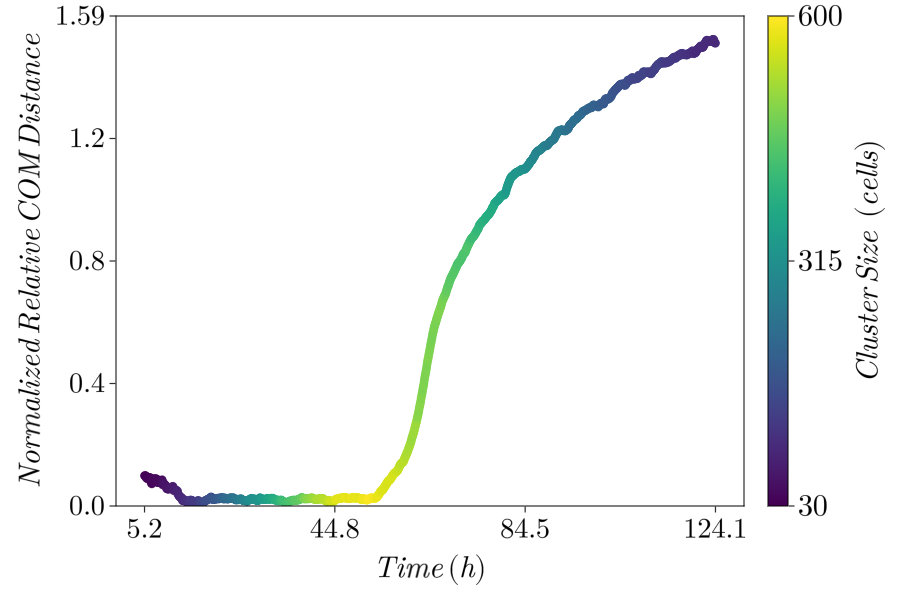

In [50]:
fig = plot_relative_com_evolution_2(df_com_series_2, normalized=true)
display(fig)
save("z_colored_normalised_relative_com_evolution.png", fig)

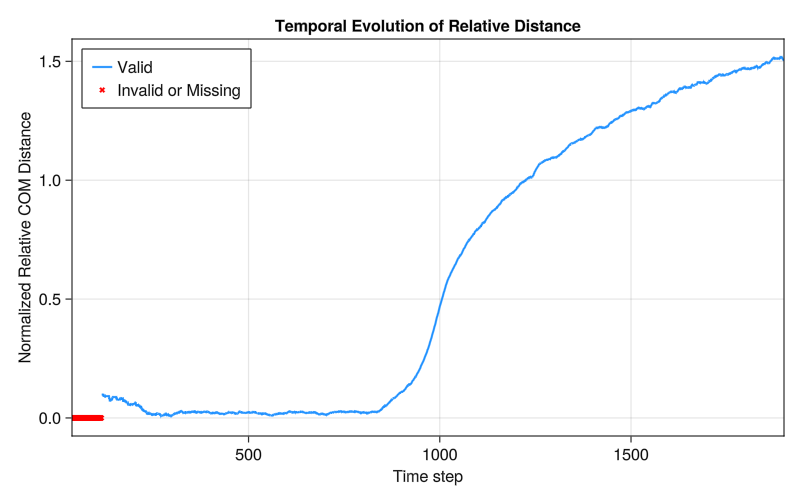

In [51]:
fig = plot_relative_com_evolution(df_com_series_2, normalized=true)
display(fig)
save("z_relative_com_evolution.png", fig)  # Save to file if you want

In [52]:
using GLMakie, DataFrames, LaTeXStrings
#t0 = 46.48

function plot_com_with_dual_yaxes(com_df::DataFrame; 
        min_cluster_size=min_cluster_size, fontsize=30, padding_frac=0.05)

    # Columns for normalized and raw distances
    normalized_col = :rel_dist_norm
    raw_col = :rel_dist

    # Filter valid data points (only those with positive normalized distance)
    valid_mask = com_df[!, normalized_col] .> 0

    # Cluster size and color normalization
    cluster_sizes = com_df.cluster_size
    min_size = isnothing(min_cluster_size) ? minimum(cluster_sizes) : min_cluster_size
    max_size = maximum(cluster_sizes)
    norm_sizes = max_size > min_size ? (cluster_sizes .- min_size) ./ (max_size - min_size) : fill(0.5, length(cluster_sizes))
    cmap = :viridis

    # Extract valid data for plotting
    x_valid = com_df.timestep[valid_mask]
    y_norm = com_df[valid_mask, normalized_col]
    y_raw = com_df[valid_mask, raw_col]
    c_valid = norm_sizes[valid_mask]

    # X axis ticks and padding (same as original)
    xmin_data, xmax_data = minimum(x_valid), maximum(x_valid)
    xrange = xmax_data - xmin_data
    first_tick, last_tick = xmin_data, xmax_data
    intermediate_ticks = collect(range(first_tick, last_tick; length=4))[2:end-1]
    xtick_positions = vcat(first_tick, intermediate_ticks, last_tick)
    #xtick_labels = round.((xtick_positions .* 10 ./ 60); digits=1)
    xtick_labels = round.(((xtick_positions .- t0) .* t_scale); digits=1)
    xtick_labels_latex = [latexstring(string(val)) for val in xtick_labels]

    xmin_padded = xmin_data - padding_frac * xrange
    xmax_padded = xmax_data + padding_frac * xrange

    # Y axis limits and ticks for normalized values (left axis)
    y_norm_min = 0
    y_norm_max = maximum(y_norm)
    y_norm_range = y_norm_max - y_norm_min
    y_norm_max_padded = y_norm_max + padding_frac * y_norm_range
    n_yticks = 5
    y_norm_ticks = range(y_norm_min, y_norm_max_padded; length=n_yticks)
    y_norm_labels = [latexstring(string(round(val, digits=2))) for val in y_norm_ticks]

    # Y axis limits and ticks for raw values (right axis)
    y_raw_min = 0
    y_raw_max = maximum(y_raw)
    y_raw_range = y_raw_max - y_raw_min
    y_raw_max_padded = y_raw_max + padding_frac * y_raw_range
    y_raw_ticks = range(y_raw_min, y_raw_max_padded; length=n_yticks)
    y_raw_labels = [latexstring(string(round(val, digits=2))) for val in y_raw_ticks]

    # Create figure and left axis (normalized y-axis)
    fig = Figure(resolution = (900, 600))
    ax_left = Axis(fig[1, 1],
        xlabel = L"Time \, (h)",
        ylabel = L"Normalized \, Relative \, COM \, Distance",
        xlabelsize = fontsize,
        ylabelsize = fontsize,
        xticks = (xtick_positions, xtick_labels_latex),
        yticks = (y_norm_ticks, y_norm_labels),
        xticklabelsize = fontsize - 2,
        yticklabelsize = fontsize - 2,
        ylabelpadding = 10,
        xlabelpadding = 10,
    )
    ax_left.xgridvisible = false
    ax_left.ygridvisible = false
    xlims!(ax_left, xmin_padded, xmax_padded)
    ylims!(ax_left, y_norm_min, y_norm_max_padded)

    # Scatter plot on left axis
    scatter!(ax_left, x_valid, y_norm, color = c_valid, colormap = cmap, markersize = 12)

    # Create right axis sharing the x axis with ax_left
    ax_right = Axis(fig[1, 1], 
        ylabel = L"Relative \, COM \, Distance \, (r)",
        ylabelsize = fontsize,
        yticklabelsize = fontsize - 2,
        yticks = (y_raw_ticks, y_raw_labels),
        yaxisposition = :right,
        xticksvisible = false,  # Hide x ticks on right axis
        ygridvisible = false,
        backgroundcolor = (:transparent),
    )
    ax_right.xticksvisible = false
    ax_right.xticks = ([], [])
    ax_right.xlabelvisible = false
    ax_right.xlabelvisible = false
    ax_right.xgridvisible = false  # optional, if you want no grid lines on top

    
    xlims!(ax_right, xmin_padded, xmax_padded)
    ylims!(ax_right, y_raw_min, y_raw_max_padded)

    # Make right axis transparent except for labels
    hidespines!(ax_right, :l, :t, :b)  # your spine hiding as before
    ax_right.xticksvisible = false     # hide x ticks on secondary axis
    ax_right.xlabelvisible = false     # hide x label on secondary axis
    ax_right.xgridvisible = false      # hide x grid on secondary axis (optional)

    # Add colorbar (optional) on the right side outside axes
    cb_ticks = round.(Int, range(min_size, max_size; length=3))
    cb_tick_labels = [latexstring(string(val)) for val in cb_ticks]

    cb = Colorbar(fig[1, 2],
        colormap = cmap,
        limits = (min_size, max_size),
        label = L"Cluster \, Size \,\; (cells)",
        labelsize = fontsize,
        ticklabelsize = fontsize,
        ticks = (cb_ticks, cb_tick_labels),
        width = 20,
        height = Relative(1),
        labelpadding = 10,
    )

    return fig
end


plot_com_with_dual_yaxes (generic function with 1 method)

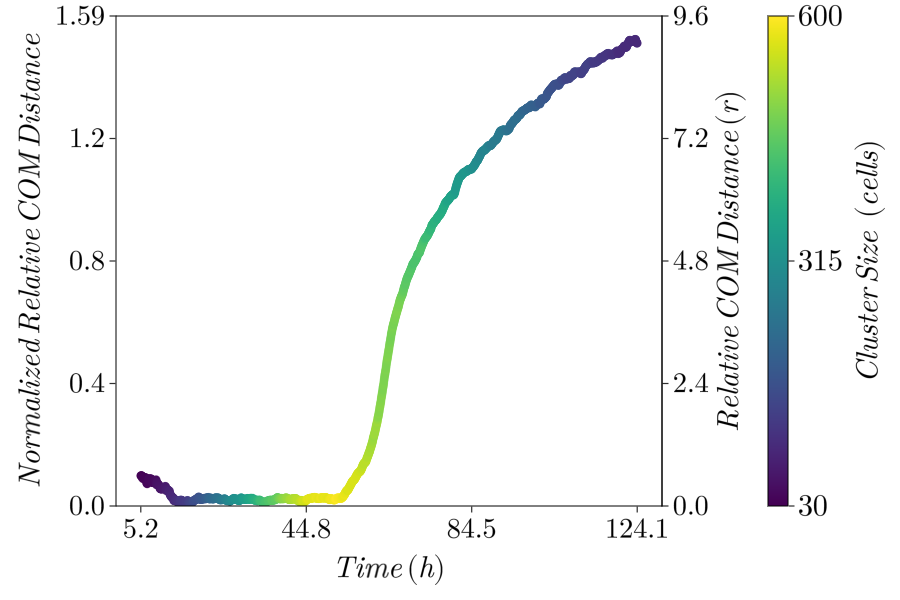

In [53]:
fig = plot_com_with_dual_yaxes(df_com_series_2)
display(fig)
save("z_com_dual_axis_plot.png", fig)


#### Save cluster COM dataframe to file



In [75]:
CSV.write("$dir_name/cluster_com_series.csv", df_com_series_2)

"z_results/cluster_com_series.csv"

In [76]:
# Assuming you already have:
# wide_df with columns: :timestep, :score_all, :score_1, :score_2, :score_3
# df_com_series_2 with columns including :timestep, :cluster_x, :cluster_y, ... etc

# Perform an inner join by timestep
#merged_df = join(df_com_series_2, wide_df, on = :timestep, kind = :inner)
merged_df = innerjoin(df_com_series_2, wide_df, on = :timestep)

# Optionally, sort by timestep
sort!(merged_df, :timestep)

# Save merged dataframe if needed
CSV.write("z_results/merged_com_segregation.csv", merged_df)


LoadError: UndefVarError: wide_df not defined

#### Plot COM of Largest cluster of B-type cells 



In [51]:
# DECIDE IF TO COLOUR ACCORDING TO CELL FATE OR AGGREGATE:
# FOR COLOURING ACCORDING TO CELL FATE:
if Colour_according_to_cell_fate == 1
    #colorMapNum = Dict(1=>Makie.wong_colors()[1],3=>Makie.wong_colors()[2],2=>Makie.wong_colors()[3]);
    colorMapNum = Dict(1=>(Makie.wong_colors()[1],0.1),2=>(Makie.wong_colors()[3],1.0),3=>(Makie.wong_colors()[2],0.1));
# FOR COLOURING ACCORDING TO AGGREGATE:
else  
    colorMapNum = Dict(1=>(Makie.wong_colors()[5],1.0),2=>(Makie.wong_colors()[4],1.0),3=>(Makie.wong_colors()[7],1.0),4=>(Makie.wong_colors()[6],1.0));
end

Dict{Int64, Tuple{RGBA{Float32}, Float64}} with 3 entries:
  2 => (RGBA{Float32}(0.0,0.619608,0.45098,1.0), 1.0)
  3 => (RGBA{Float32}(0.901961,0.623529,0.0,1.0), 0.1)
  1 => (RGBA{Float32}(0.0,0.447059,0.698039,1.0), 0.1)

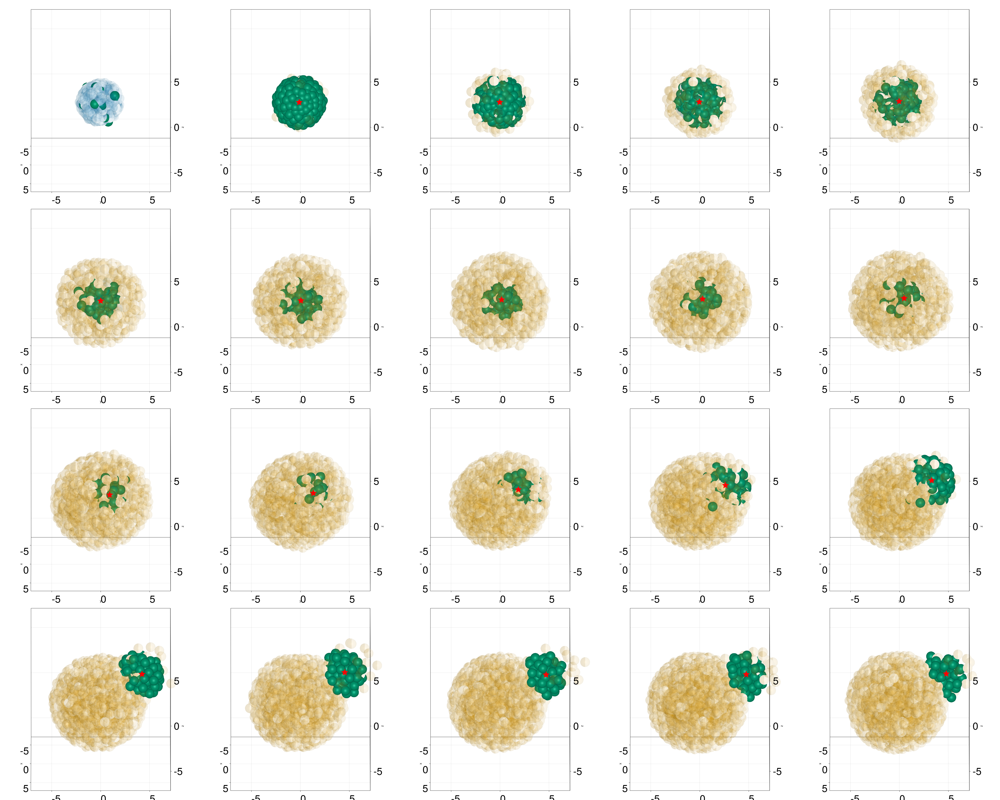

In [52]:
#using CairoMakie
_size_ = ((maximum(com.x) - minimum(com.x)) + com.r[1]) / 1.5
_every_ = 23
_azimuth_ = 0.0
labelsize = 50

fig = Figure(resolution=(5000, 4000))  # Create a larger figure

function add_subplot(row, d, range; cellFateOfInterest::Int, cutoff::Float64 = 5.0, min_cluster_size::Int = 1)
    for (i, pos) in enumerate(range)
        ax = Axis3(fig[row, i], 
            xticklabelsize = labelsize,
            yticklabelsize = labelsize,
            zticklabelsize = labelsize,
            aspect = :data, 
            azimuth = _azimuth_ * π)

        # Color particles by cell fate or aggregate
        if Colour_according_to_cell_fate == 1
            color = [colorMapNum[i] for i in d[:cellFate][pos]]
        else
            color = [colorMapNum[i] for i in d[:cell_aggregate][pos]]
        end

        # Plot particles
        meshscatter!(ax, d[:x][pos], d[:y][pos], d[:z][pos], 
                     markersize=d[:r][pos] ./ 2.0, color=color)

        # Create a mini dataframe for this timestep
        df_t = DataFrame(
            cellFate = [d[:cellFate][pos]],
            x = [d[:x][pos]],
            y = [d[:y][pos]],
            z = [d[:z][pos]],
        )

        # Compute COM of largest cluster of given fate
        result = biggest_cluster_com(df_t, 1, cellFateOfInterest, cutoff, min_cluster_size)
        com = result.cluster_com

        # If valid COM, draw it as a red star
        #if com != (x = 0.0, y = 0.0, z = 0.0)
        #    scatter!(ax, [com.x], [com.y], [com.z], 
        #             color = :red, marker = :star5, markersize = 40)
        #end

        if com != (x = 0.0, y = 0.0, z = 0.0)
            scatter!(ax, [com.x], [com.y], [com.z]; 
            color = :red, marker = :star5, markersize = 40,
            overdraw = true, depth_shift = -1e-3)
        end


        # Set axis limits
        xlims!(ax, -_size_, _size_)
        ylims!(ax, -_size_, _size_)
        zlims!(ax, -_size_, _size_)
    end
end




# Add the four rows of subplots:

cellFateOfInterest = 2
#cutoff = 2.0
#min_cluster_size = 100

add_subplot(1, d, 1+round(Int64, length(com)/_every_):round(Int64, length(com)/_every_):round(Int64, length(com)/4); 
            cellFateOfInterest=cellFateOfInterest, cutoff=cutoff, min_cluster_size=min_cluster_size)

add_subplot(2, d, 1+round(Int64, length(com)/4)+round(Int64, length(com)/_every_):round(Int64, length(com)/_every_):round(Int64, length(com)/4*2); 
            cellFateOfInterest=cellFateOfInterest, cutoff=cutoff, min_cluster_size=min_cluster_size)

add_subplot(3, d, 1+round(Int64, length(com)/4*2)+round(Int64, length(com)/_every_):round(Int64, length(com)/_every_):round(Int64, length(com)/4*3); 
            cellFateOfInterest=cellFateOfInterest, cutoff=cutoff, min_cluster_size=min_cluster_size)

add_subplot(4, d, 1+round(Int64, length(com)/4*3)+round(Int64, length(com)/_every_):round(Int64, length(com)/_every_):length(com); 
            cellFateOfInterest=cellFateOfInterest, cutoff=cutoff, min_cluster_size=min_cluster_size)

# Repeat for other rows...


# Add the four rows of subplots
#add_subplot(1, d, 1+round(Int64, length(com)/_every_):round(Int64, length(com)/_every_):round(Int64, length(com)/4))
#add_subplot(2, d, round(Int64, length(com)/4)+round(Int64, length(com)/_every_):round(Int64, length(com)/_every_):round(Int64, length(com)/4*2))
#add_subplot(3, d, round(Int64, length(com)/4*2)+round(Int64, length(com)/_every_):round(Int64, length(com)/_every_):round(Int64, length(com)/4*3))
#add_subplot(4, d, round(Int64, length(com)/4*3)+round(Int64, length(com)/_every_):round(Int64, length(com)/_every_):length(com))

# Display and save
display(fig)
save("z_snapshots_3.png", fig)

### Make movie of simulation 1



In [61]:
# MAKE MOVIE WITH CM OF COM & TRACKING OF CM OF COM:

function animate_cells(df::DataFrame, com; 
    framerate=15, filename="cells_animation.mp4", 
    cellFateOfInterest::Int=2, cutoff::Float64=5.0, min_cluster_size::Int=10)

    fig = Figure(resolution = (2000, 2000))
    ax = Axis3(fig[1, 1], aspect = :data)

    # Adjust axis limits based on your domain
    xlims!(ax, -10, 10)
    ylims!(ax, -10, 10)
    zlims!(ax, -10, 10)

    # Observables for cell rendering
    positions = Observable(Point3f0[])
    colors = Observable(RGBA[])
    sizes = Observable(Float32[])
    meshscatter!(ax, positions; color=colors, markersize=sizes)

    # Observables for cluster COM
    cluster_marker = Observable(Point3f0[])
    scatter!(ax, cluster_marker; color = :red, marker = :star5, markersize = 40)

    # Observable for trail
    com_trail = Observable(Point3f0[])
    lines!(ax, com_trail; color = :red, linewidth = 2)

    # Observables for arrows
    #arrow_start = Observable(Point3f0[])
    #arrow_vec = Observable(Vec3f0[])
    #arrows!(ax, arrow_start, arrow_vec; color = :black, linewidth = 3)

    # Define colors for each cell fate
    c1 = Makie.wong_colors()[1]
    c2 = Makie.wong_colors()[3]
    c3 = Makie.wong_colors()[2]

    fate_colors = Dict(
        1 => RGBA(red(c1), green(c1), blue(c1), 0.1),
        2 => RGBA(red(c2), green(c2), blue(c2), 1.0),
        3 => RGBA(red(c3), green(c3), blue(c3), 0.1)
    )

    n_frames = size(df, 1)

    record(fig, filename, 1:n_frames; framerate=framerate) do t
        # Particle positions and properties
        x = df[!, :x][t]
        y = df[!, :y][t]
        z = df[!, :z][t]
        fates = df[!, :cellFate][t]
        r_t = com.r[t]
        r = isa(r_t, AbstractVector) ? r_t : fill(r_t, length(x))

        positions[] = Point3f0.(x, y, z)
        colors[] = [get(fate_colors, f, RGBA(0.5, 0.5, 0.5, 1.0)) for f in fates]
        sizes[] = Float32.(r) ./ 2.0

        # Create mini-DataFrame for this timestep
        df_t = DataFrame(
            cellFate = [df[!, :cellFate][t]],
            x = [df[!, :x][t]],
            y = [df[!, :y][t]],
            z = [df[!, :z][t]],
        )

        # Compute cluster COM and global COM
        result = biggest_cluster_com(df_t, 1, cellFateOfInterest, cutoff, min_cluster_size)
        cluster_com = result.cluster_com
        global_com = result.global_com

        if cluster_com != (x = 0.0, y = 0.0, z = 0.0)
            cpt = Point3f0(cluster_com.x, cluster_com.y, cluster_com.z)
            gpt = Point3f0(global_com.x, global_com.y, global_com.z)

            cluster_marker[] = [cpt]

            # Update trail (keep last 100 frames)
            push!(com_trail[], cpt)
            length(com_trail[]) > 100 && popfirst!(com_trail[])
            notify(com_trail)

            #arrow_start[] = [gpt]
            #arrow_vec[] = [Vec3f0(cpt .- gpt)]
        else
            cluster_marker[] = Point3f0[]
            #arrow_start[] = Point3f0[]
            #arrow_vec[] = Vec3f0[]
        end
    end
end

animate_cells(df, com; 
    filename="z_cells_animation_full.mp4", 
    cellFateOfInterest=2, 
    cutoff=cutoff, 
    min_cluster_size=min_cluster_size
)



"z_cells_animation_full.mp4"

### Make GIF of simulation 2



In [56]:
#t0 = 46.48
function movie_frames(com, color_map, mstart, mstop;
    size = ((maximum(com.x) - minimum(com.x)) + com.r[1]) / 1.5,
    showtime = true,
    shownumbers = false,
    cellFateOfInterest::Int = 2,
    cutoff::Float64 = 2.0,
    #min_cluster_size::Int = 100,
    min_cluster_size::Int = min_cluster_size,
    skip::Int = 1  # New parameter: default no skipping
)
    # Build the time indices with skipping
    time_indices = collect(mstart:skip:mstop)
    m = length(string(length(time_indices)))  # for filename padding

    d = getParameter(com, Colour_according_to_cell_fate == 1 ?
        [:x, :y, :z, :r, :cellFate] :
        [:x, :y, :z, :r, :cell_aggregate]
    )
    labelsize = 30
    plots = []

    com_trail_x = Float64[]
    com_trail_y = Float64[]
    com_trail_z = Float64[]

    for (i, pos) in enumerate(time_indices)
        pos = floor(Int, pos)
        t = round(com[pos].t, digits = 2)

        fig_gif = Figure(resolution = (800, 800))
        
        t_scaled = round((com[pos].t - t0) * (t_scale), digits=2)


        ax = Axis3(
            fig_gif[1, 1],
            aspect = :data,
            azimuth = _azimuth_ * π,
            #elevation = _elevation_ * π,
            xlabel = "", ylabel = "", zlabel = "",
            xticklabelsize = shownumbers ? labelsize : 0,
            yticklabelsize = shownumbers ? labelsize : 0,
            zticklabelsize = shownumbers ? labelsize : 0,
            xticksvisible = false,
            yticksvisible = false,
            zticksvisible = false,
            xgridvisible = false,
            ygridvisible = false,
            zgridvisible = false,
            xspinesvisible = false,
            yspinesvisible = false,
            zspinesvisible = false,
            titlevisible = showtime,
            titlealign = :center,
            titlegap = 12,
            titlesize = labelsize,
            title = L"t = %$(t_scaled) \, h",
        )

        color = [colorMapNum[i] for i in d[Colour_according_to_cell_fate == 1 ? :cellFate : :cell_aggregate][pos]]
        meshscatter!(ax, d[:x][pos], d[:y][pos], d[:z][pos],
                     markersize = d[:r][pos]/2.0, color = color)

        # Compute COM of largest cluster for current timestep
        df_t = DataFrame(
            cellFate = [d[:cellFate][pos]],
            x = [d[:x][pos]],
            y = [d[:y][pos]],
            z = [d[:z][pos]],
        )
        result = biggest_cluster_com(df_t, 1, cellFateOfInterest, cutoff, min_cluster_size)
        com_point = result.cluster_com

        if com_point != (x = 0.0, y = 0.0, z = 0.0)
            push!(com_trail_x, com_point.x)
            push!(com_trail_y, com_point.y)
            push!(com_trail_z, com_point.z)

            lines!(ax, com_trail_x, com_trail_y, com_trail_z;
                   color = :red, linewidth = 2)

            scatter!(ax, [com_point.x], [com_point.y], [com_point.z];
                     color = :red, marker = :star5, markersize = 40,
                     overdraw = true, depth_shift = -1e-3)
        end

        xlims!(ax, -size, size)
        ylims!(ax, -size, size)
        zlims!(ax, -size, size)

        push!(plots, fig_gif)

        formatted_i = lpad(string(i), m, '0')
        save("frame_$formatted_i.png", fig_gif)
    end
end


movie_frames (generic function with 1 method)

In [57]:
#color_map = Dict("A"=>Makie.wong_colors()[1],"C"=>Makie.wong_colors()[2],"B"=>Makie.wong_colors()[3])
color_map = Dict(1=>Makie.wong_colors()[5],2=>Makie.wong_colors()[4],3=>Makie.wong_colors()[7],4=>Makie.wong_colors()[6]);
# FOR COLOURING ACCORDING TO CELL FATE:
if Colour_according_to_cell_fate == 1
    colorMapNum = Dict(1=>(Makie.wong_colors()[1],1.0),3=>(Makie.wong_colors()[2],1.0),2=>(Makie.wong_colors()[3],1.0));
    #colorMapNum = Dict(1=>(Makie.wong_colors()[1],0.2),2=>(Makie.wong_colors()[3],1.0),3=>(Makie.wong_colors()[2],0.2));
    # FOR CAIRO MAKIE:
    #colorMapNum = Dict(1=>(Makie.wong_colors()[1],0.1),2=>(Makie.wong_colors()[3],1.0),3=>(Makie.wong_colors()[2],0.1));
# FOR COLOURING ACCORDING TO AGGREGATE:
else  
    colorMapNum = Dict(1=>(Makie.wong_colors()[5],1.0),2=>(Makie.wong_colors()[4],1.0),3=>(Makie.wong_colors()[7],1.0),4=>(Makie.wong_colors()[6],1.0));
end

_azimuth_ = 1.5
#_elevation_ = 0.5
#m1 = 1;
#m1 = 1000;
#m1 = 47;
m1 = floor(t0)
#m1 = 1;
m2 = length(com);
#m2 = 50;
prop = 1
n_images = round(Int, prop * (m2 - m1))
#movie_frames(com, color_map, m1, m2, n_images)
movie_frames(
    com,
    color_map,
    m1,       # mstart
    m2,      # mstop
    skip = 1,  # Generate a frame every skip steps
    cellFateOfInterest = 2,
    cutoff = cutoff,
    min_cluster_size = min_cluster_size,
)
moment = Dates.format(now(), "dd-mm_yyyy");

In [58]:
run(`magick "frame*".png -scale 800x800 z_movie.gif`)
#run(`magick "*".png -scale 1000x1000 -layers Optimize z_movie.gif`)
#run(`mkdir z_frames`)
#run(`mv "frame*".png 'z_frames'`)

Process(`magick 'frame*.png' -scale 800x800 z_movie.gif`, ProcessExited(0))

### Proportions of aggregate types with time



In [59]:



function get_props(com)

	d = getParameter(com, [:t, :cell_aggregate, :N])

	props = Dict()
	for state in 1:4  # 1=A, 2=B, 3=C
		props[state] = [sum(i .== state) for i in d[:cell_aggregate]]
        #println("Here is props = ", props)
        #println("Here is props[state] = ", props[state])
        #println("Here is d[:N] = ", d[:N])
		props[state] = props[state] ./ d[:N]
        #println("Here is props = ", props)
	end

	return props

end;

In [60]:
props = get_props(com);
#println("Here is props = ", props)
#println("Here is props = ", props[2][150])

In [61]:
function plot_proportions(com, color_map, mstart, mstop, props)

    t1 = com[mstart].t
    t2 = com[mstop].t
    
	fig = Figure(resolution = (1000, 800), figure_padding = 25)
    labelsize = 50
		ax = Axis(
        fig[1, 1],
        xlabel = "time",
        ylabel = "Proportion of cells", 
        xlabelsize = labelsize,
        ylabelsize = labelsize,
        xticklabelsize = labelsize,
        yticklabelsize = labelsize,
        aspect = 1,
        xticks = round.(range(t1, t2, 4), digits=1)
    )
	ylims!(ax, 0, 1)
	xlims!(ax, t1, t2)

	#d = getParameter(com, [:t, :cell_aggregate, :N])
    d = getParameter(com, [:t])
	plots = []
	for i in 1:4
		p = lines!(ax, d[:t][mstart:mstop], props[i][mstart:mstop], color = color_map[i], linewidth = 5) # linestyle=:dash
		push!(plots, p)
	end
	#labels = [L"state ", L"state ", L"state ", L"state "]
    labels = [" ", " ", " ", " "]
    Legend(
        fig[1, 2], 
        plots, labels, 
        labelsize = labelsize,
    )    
	display(fig)

end;


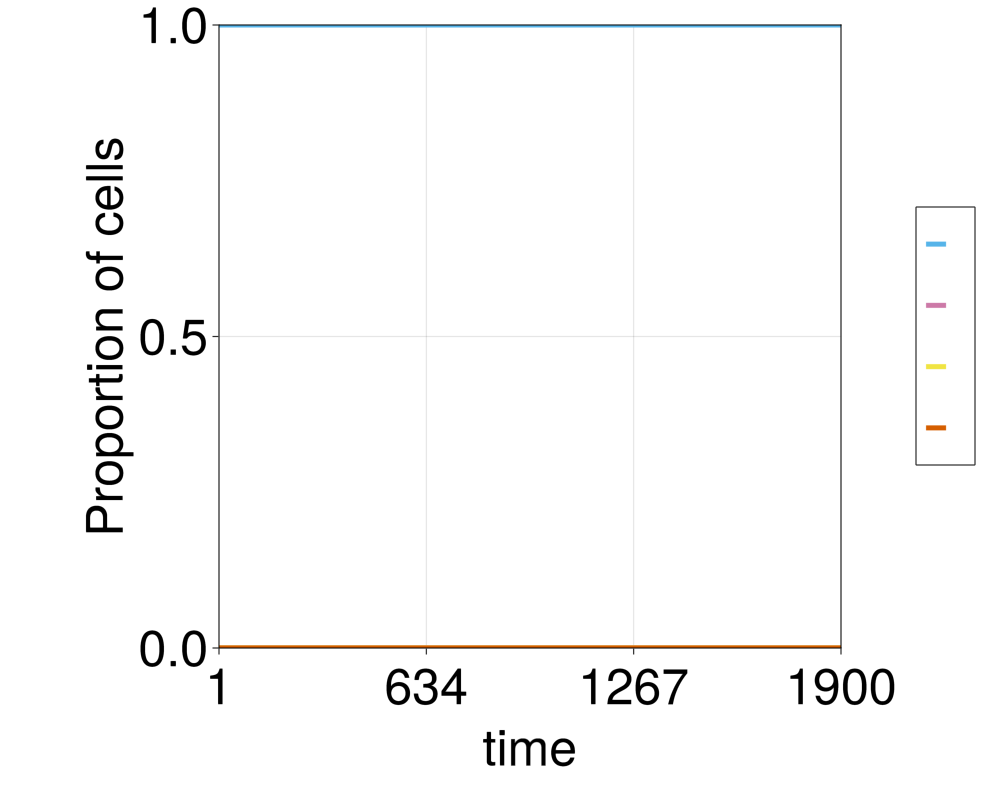

GLMakie.Screen(...)

In [62]:
props = get_props(com);      # compute proportion of each state for the saved timestamps
     
m1 = 1;
m2 = length(com);
plot_proportions(com, color_map, m1, m2, props)
# plot_proportions_analytical(com, color_map, m1, m2)
# plot_proportions_numerical_meanfield(com, color_map, m1, m2)
# plot_proportions_vs_analytical(com, color_map, m1, m2, props)
# plot_proportions_vs_meanfield(com, color_map, m1, m2, props)

### Evolution of Centre of Mass



In [63]:
using LinearAlgebra
function get_CM(com)

	#d = getParameter(com, [:t, :cell_aggregate, :N])
    d = getParameter(com, [:t, :x, :y, :z, :N])
    #d = getParameter(com, [:x, :y, :z, :N])

    CM = Array{Float64}(undef, 3, length(com))
    CM2 = Array{Float64}(undef, 4, length(com))
    #println( "    CM = ", CM)
    #println( "    CM = ", CM[2,3])
    #CM[1] = Array{Float64}
    #CM[2] = Array{Float64}
    #CM[3] = Array{Float64}
    
	CM_ = Dict()
    #CM = d[:x]
    CM_[1] = d[:x]
    CM_[2] = d[:y]
    CM_[3] = d[:z]
    #CM[4] = d[:N]

    #propsiqs = diq[:x][11]
    
    #propsiqs = sum(diq[:x])
    
    #propsiqs[1] = sum(diq[:x])
	#for state in 1:4  # 1=A, 2=B, 3=C
    #	propsiqs[state] = [sum(i .== state) for i in d[:cell_aggregate]]
	#	propsiqs[state] = propsiqs[state] ./ d[:N]
	#end

    i = 0
    for dim in CM_
    i += 1
    j = 0
        for t in CM_[i]
            j += 1
            #println( i,"  " , j, "    CM = ", state)
            #println("OK CM = ", sum(CM[i][j]))
            ###println(sum(CM[4][j]), "    N    CM = ", sum(CM[i][j]) / sum(CM[4][j]))
            #println(d[:N][j], "    N    CM = ", sum(CM_[i][j]) / d[:N][j])
            CM[i,j] = sum(CM_[i][j]) / d[:N][j]
        end
    end

    for t in 1:length(com)
        CM2[1,t] = CM[1,t]
        CM2[2,t] = CM[2,t]
        CM2[3,t] = CM[3,t]
        CM2[4,t] = norm(CM[:,t])
    end

	return CM2

end;

In [64]:
#println("    CM = ", CM)
#println("    CM = ", CM[1])
#println("    CM = ", CM[1][1])
CM = get_CM(com);    
#println("    CM = ", CM)
#println("    CM = ", CM[:,41])
#println("    CM = ", norm(CM[:,41]))

#println("    CM = ", CM[1][150])
#println("    CM = ", CM[3][3:101])

#println("    CM = ", CM[:,41])
#println("    size(CM) = ", size(CM))
average = mean(CM[4,:])
std_dev = std(CM[4,:])
println("    CM average = ", average)
println("    CM std_dev = ", std_dev)

    CM average = 0.9345821865930493
    CM std_dev = 0.7152185978481714


In [65]:
function plot_CM(com, color_map, mstart, mstop, CM, CM_av)

    t1 = com[mstart].t
    t2 = com[mstop].t
    
    fig = Figure(resolution = (1500, 1000), figure_padding = 25)
    labelsize = 50
    ax = Axis(
        fig[1, 1],
        xlabel = L"\text{time}",
        ylabel = L"\text{CM position}", 
        xlabelsize = labelsize,
        ylabelsize = labelsize,
        xticklabelsize = labelsize,
        yticklabelsize = labelsize,
        aspect = 1,
        xticks = round.(range(t1, t2, 4), digits=1)
    )
    ylims!(ax, minimum(CM)*1.1, maximum(CM)*1.1)
    xlims!(ax, t1, t2)

    # Extract time data
    d = getParameter(com, [:t])
    plots = []

    # Plot CM components
    for i in 1:4
        p = lines!(ax, d[:t][mstart:mstop], CM[i, mstart:mstop], color = color_map[i], linewidth = 3)
        push!(plots, p)
    end

    # Plot CM_av as a horizontal line
    av_color = :black  # Choose a color for the average plot
    av_line = lines!(ax, [t1, t2], [CM_av, CM_av], color = av_color, linewidth = 3, linestyle=:dash)
    push!(plots, av_line)

    # Add label for CM_av curve in LaTeX format
    label_x = t1 + (t2 - t1) * 0.03  # Adjust position of the label
    label_y = CM_av * 1.15
    text!(
        ax, label_x, label_y, 
        text = "<CM> = $(round(CM_av, digits=2))",  # Display CM_av value rounded to 2 decimals
        align = (:left, :center), 
        fontsize = labelsize/2,
        color = av_color
    )

    # Add labels for the legend
    labels = [L"CM_x", L"CM_y", L"CM_z", L"|CM|", L"\langle CM \rangle"]

    Legend(
        fig[1, 2], 
        plots, labels, 
        labelsize = labelsize,
    )    
    display(fig)

    # For saving figure:
     save("z_CM.png", fig)

end;


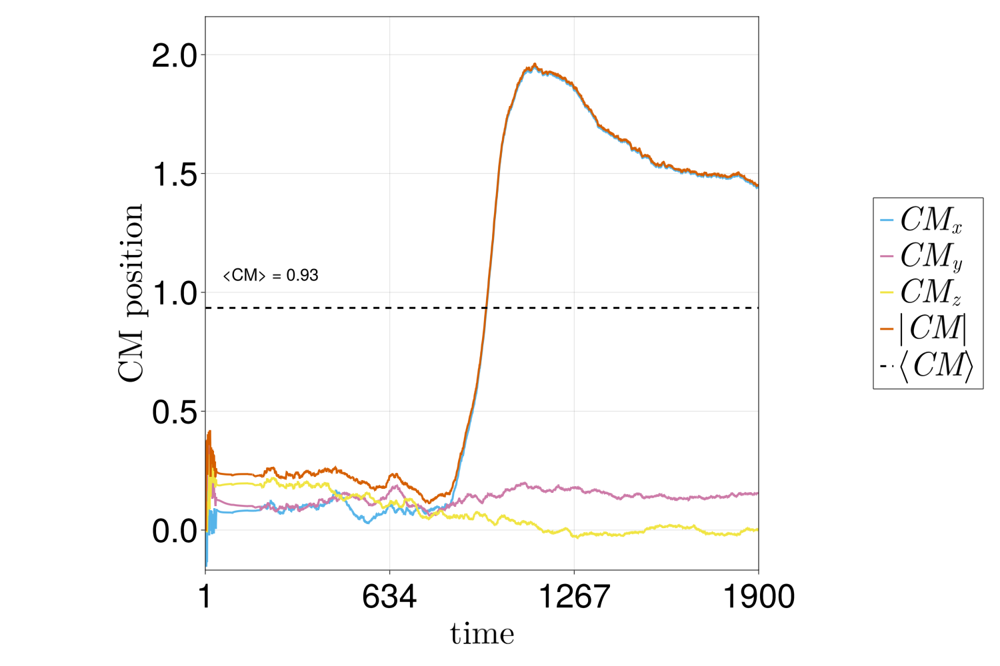

In [66]:
color_map = Dict(1=>Makie.wong_colors()[5],2=>Makie.wong_colors()[4],3=>Makie.wong_colors()[7],4=>Makie.wong_colors()[6]);
m1 = 1;
m2 = length(com);
#println("    m1 = ", m1)
#println("    m2 = ", m2)
plot_CM(com, color_map, m1, m2, CM, average)

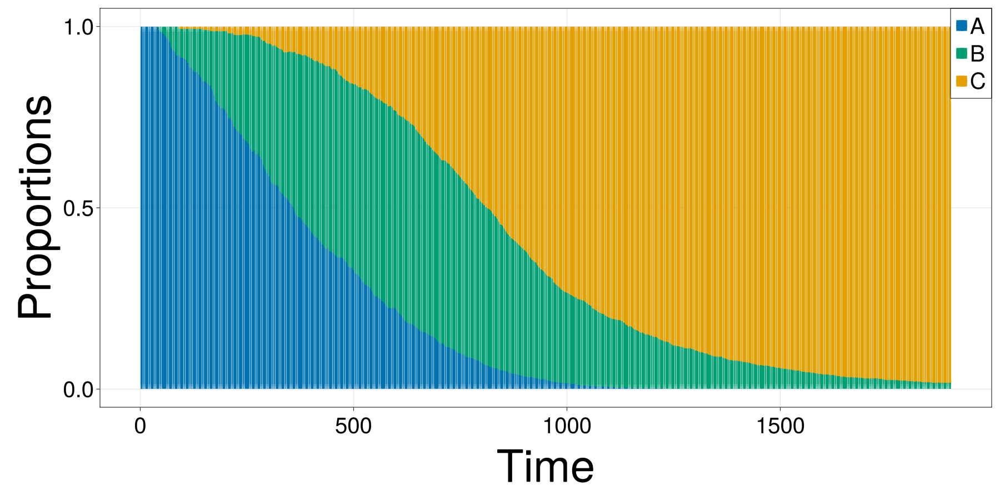

In [67]:
colorMap = Dict("A"=>Makie.wong_colors()[1],"C"=>Makie.wong_colors()[2],"B"=>Makie.wong_colors()[3])
fig = Figure(resolution=(1801,901))

ax = Axis(fig[1,1],xlabel="Time",ylabel="Proportions",xlabelsize=80,ylabelsize=80,
          xticklabelsize = 40,  # Tick label size for x-axis
          yticklabelsize = 40)  # Tick label size for y-axis
fates = getFates(com)
#println("    fates = ", fates)
offset = zeros(length(fates["N"]))
plots2 = []
for i in ["A","B","C"]
#for i in ["B","C"]
    prop = fates[i]./fates["N"]
    p = barplot!(ax,fates["t"],prop,offset=offset,color=colorMap[i])
    push!(plots2,p)
    offset .+= prop
end
Legend(fig[1,1], plots2, ["A","B","C"], halign = :right, valign = :top, tellheight = false, tellwidth = false, labelsize=40)
#Legend(fig[1,1], plots2, ["B","C"], halign = :right, valign = :top, tellheight = false, tellwidth = false, labelsize=40)

display(fig)

# For saving figure:
save("z_proportions.png", fig)

### Make statistics of the model

This model contains stochasticity in the division times and the concentration of chemical components that the daughter agents receive. This will make different runs of the simulation to differ. In order to make statistics we run the model several times and collect information of the size and fates of the cells.

In [147]:
function makeStatistics(comBase,parameters,dt,steps,saveEach,nRepetitions)

    #Make simulations and add results to list
    d = Dict("id"=>Int64[],"N"=>Int64[],"t"=>Float64[],"A"=>Int64[],"B"=>Int64[],"C"=>Int64[])
    for i in 1:nRepetitions
        #Make the simulations
        com = initializeEmbryo(parameters,dt=dt);
        setfield!(com,:abm,comBase.abm) #Avoid world problem assigning the functions of globally declared function model
        customEvolve!(com,steps,saveEach)
    
        #Add them to the model
        fates = getFates(com)
        append!(d["id"],i*ones(Int64,length(fates["N"])))
        append!(d["N"],fates["N"])
        append!(d["t"],fates["t"])
        append!(d["A"],fates["A"])
        append!(d["B"],fates["B"])
        append!(d["C"],fates["C"])
    end

    return d
end;

In [398]:
dt = 0.001
steps = round(Int64,50/dt)
saveEach = round(Int64,1/dt)
nRepetitions = 5

prop = makeStatistics(com,parameters,dt,steps,saveEach,nRepetitions);

LoadError: UndefKeywordError: keyword argument N not assigned

In [399]:
fig = Figure(resolution=(1000,800))

ax = Axis(fig[1,1],xlabel="N",xlabelsize=40,ylabel="proportions",ylabelsize=40)
for i in ["DP","EPI","PRE"]
    boxplot!(ax,prop["N"],prop[i]./prop["N"],color=colorMap[i])
end
Legend(fig[1,1], plots, ["DP","EPI","PRE"], halign = :right, valign = :top, tellheight = false, tellwidth = false, labelsize=40)

ax = Axis(fig[2,1],xlabel="t",xlabelsize=40,ylabel="proportions",ylabelsize=40)
for i in ["DP","EPI","PRE"]
    boxplot!(ax,prop["t"],prop[i]./prop["N"],color=colorMap[i])
end
Legend(fig[2,1], plots, ["DP","EPI","PRE"], halign = :right, valign = :top, tellheight = false, tellwidth = false, labelsize=40)

display(fig)

LoadError: ArgumentError: invalid index: "N" of type String

## Fitting the model

The parameters above described were chosen to match the experimental observation. This was a qualitative fitting where the parameters where tuned by hand.

In this section we will show how we can use tuning functions to choose optimize certain parameters of the model. In particular, we tune the model to fit parameters related with the chemical circuit to match the correct distributions of cells.

### Upload experimental data

We upload the experimental data that gives raise to this model.

In [1282]:
dataFull = CSV.read("data/development.csv",DataFrame)
fates = ["DP","EPI","PRE"];

LoadError: ArgumentError: "data/development.csv" is not a valid file or doesn't exist

In [1283]:
data = Dict("N"=>Float64[],[i=>Float64[] for i in ["DP","EPI","PRE"]]...)
for embryo in unique(dataFull[!,"Embryo_ID"])
    embryoData = dataFull[dataFull[!,"Embryo_ID"] .== embryo,:]
    push!(data["N"], 0)
    for celltype in fates
        if celltype in embryoData[!,"Identity.hc"] && celltype in ["DP","EPI","PRE"]
            val = embryoData[embryoData[!,"Identity.hc"].==celltype,"count"][1]
            push!(data[celltype],val)
            data["N"][end] += val 
        elseif celltype in ["DP","EPI","PRE"]
            push!(data[celltype],0)
        end
    end
end

LoadError: UndefVarError: dataFull not defined

Some of the types have been truncated in the stacktrace for improved reading. To emit complete information
in the stack trace, evaluate `TruncatedStacktraces.VERBOSE[] = true` and re-run the code.


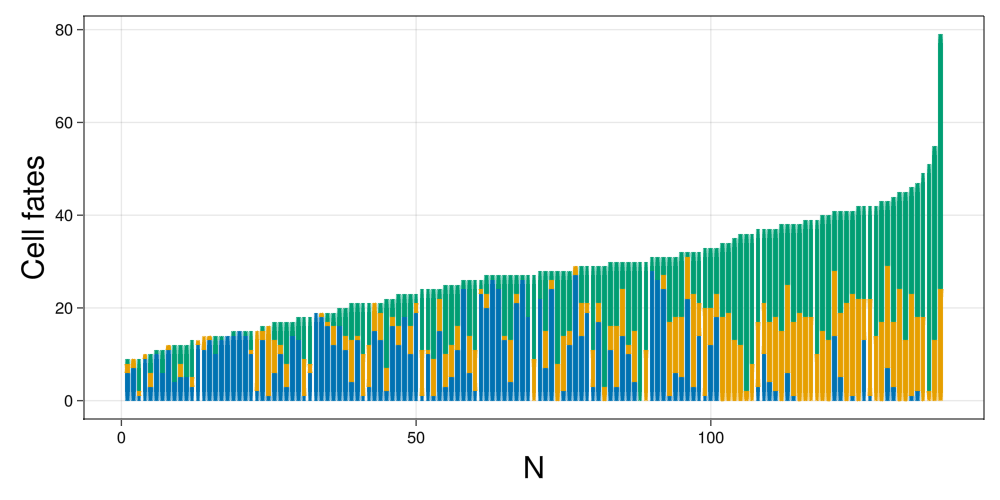

In [17]:
fig = Figure(resolution=(1000,500))

ax = Axis(fig[1,1],xlabel="N",xlabelsize=30,ylabel="Cell fates",ylabelsize=30)

offset = zeros(size(data["DP"])[1])
legend = []
order = sortperm(data["N"])
for cellId in fates
    bp = barplot!(ax,data[cellId][order], offset=offset, color = colorMap[cellId])
    push!(legend,bp)
    offset .+= data[cellId][order]
end

fig

We see that the data corresponds to sets ranging from 5 to 60 cells, being the usual sized between 5 to 30. 

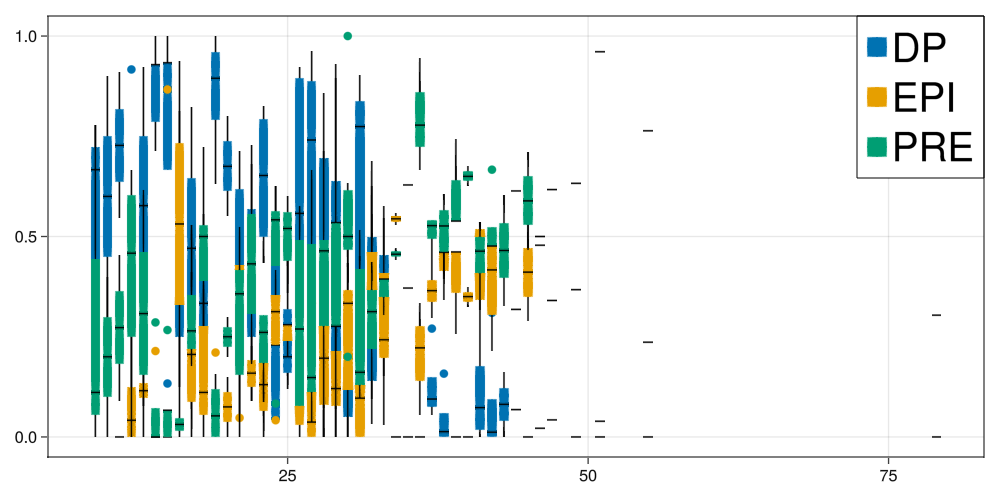

In [18]:
fig = Figure(resolution=(1000,500))
ax = Axis(fig[1,1])
legend = []

cluster = 1
for cellId in fates
    Ngrouped = round.(Int64,data["N"]/cluster).*cluster
    l = boxplot!(ax,Ngrouped,(data[cellId]./data["N"]),label=cellId, color=colorMap[cellId])
    push!(legend,l)
end
Legend(fig[1,1], legend, fates, halign = :right, valign = :top, tellheight = false, tellwidth = false, labelsize=40)

fig

### Set the exploration space

The optimization algorithms require that you specify a set of parameters to optimize. in our case, our parameters correspond to parameters to the agent. However, they does not need to correcpond to parameters of the agent at all. They will be specified for the algorithm to sample from them and give new updates while optimising. 

We have to define them as a dicctionary.

In [19]:
explore = Dict([
            :α=>(0,20),
            :K=>(0,2),
            :nn=>(0,5),
            :mm=>(0,5),
            :nCirc=>(0,30),
            :σNCirc=>(0,20),
            :c0=>(0,20)
        ]);

### Construct loos function

With the data prepared to be compared, we set the loos function. 

The loos function is a function that has to receive at least one argument, a `RowDataframe` object that contains the information of the parameters that are being fitted and has to return a value indicating how good wwere the simulations.

The function is very general so it can fit a many different routines.

Our function basically contains the following steps:

 - Sets the new parameters
 - Run several simulations for that set of parameters to get robust statistics
 - Cluster the results from the simulations as before to compare it to the experimental data
 - Compare the experimental and simulation results using a Chi Square metric as loos value.
 
The specific form of the function will depend on the optimization algorithm at hand.

In [20]:
function loosFunction(params;parameters=parameters,data=data,nRepetitions=1,saveEach=10,dt=0.001)

    #Modify the set of parameters
    parametersModified = copy(parameters)
    parametersModified[:α] = params[:α][1]
    parametersModified[:K] = params[:K][1]
    parametersModified[:nn] = params[:nn][1]
    parametersModified[:mm] = params[:mm][1]
    parametersModified[:nCirc] = params[:nCirc][1]
    parametersModified[:σNCirc] = params[:σNCirc][1]
    parametersModified[:c0] = params[:c0][1]
    
    #Make a batch of simulations and get relevant information
    prop = makeStatistics(com,parametersModified,dt,steps,saveEach,nRepetitions);

    #Prepare data for fitting
    p = transpose([prop["DP"] prop["EPI"] prop["PRE"]]./prop["N"])
    
    #Xi square loos
    loos = 0.
    for n in minimum(data["N"]):maximum(data["N"])
        p = prop["N"] .== n
        if sum(p) > 0
            dist = [mean(prop["DP"][p])/n,mean(prop["EPI"][p])/n,mean(prop["PRE"][p])/n]
            for (nn,dp,epi,pre) in zip(data["N"],data["DP"],data["EPI"],data["PRE"])
                if nn == n
                    loos += sum((dist.-[dp,epi,pre]./n).^2)
                end
            end
        end
    end
    #Return loos
    return loos
    
end

loosFunction (generic function with 1 method)

### Check stability of loos function

We run the loos function several times to check that the results are consistent between runs. If the loos function returned different results outside the expected fluctuations, the model would not be proporly fitted as the algorithms would not be able to minimize consistently the cost.

The fluctuations for the simulations using 10 repetitions of the simulation for the same parameters show already enough consistency.

In [25]:
#initialisation = DataFrame([:α=>parameters[:α],:K=>parameters[:K],:nn=>parameters[:nn],:mm=>parameters[:mm],:nCirc=>parameters[:nCirc],:σNCirc=>parameters[:σNCirc],:c0=>parameters[:c0]])

initialisation = DataFrame([:α=>parameters[:α],:K=>parameters[:K],:nn=>parameters[:nn],:mm=>parameters[:mm],:nCirc=>parameters[:nCirc],:σNCirc=>parameters[:σNCirc],:c0=>parameters[:c0]])

Threads.@threads for i in 1:3
    println(loosFunction(initialisation,nRepetitions=1))
end

LoadError: TaskFailedException

[91m    nested task error: [39mArgumentError: syntax df[column] is not supported use df[!, column] instead
    Stacktrace:
     [1] [0m[1mgetindex[22m[0m[1m([22m[90m#unused#[39m::[0mDataFrame, [90m#unused#[39m::[0mSymbol[0m[1m)[22m
    [90m   @ [39m[35mDataFrames[39m [90m~/.julia/packages/DataFrames/LteEl/src/abstractdataframe/[39m[90m[4mabstractdataframe.jl:2448[24m[39m
     [2] [0m[1mloosFunction[22m[0m[1m([22m[90mparams[39m::[0mDataFrame; [90mparameters[39m::[0mDict[90m{Symbol, Any}[39m, [90mdata[39m::[0mDict[90m{String, Vector{Float64}}[39m, [90mnRepetitions[39m::[0mInt64, [90msaveEach[39m::[0mInt64, [90mdt[39m::[0mFloat64[0m[1m)[22m
    [90m   @ [39m[36mMain[39m [90m./[39m[90m[4mIn[20]:5[24m[39m
     [3] [0m[1mmacro expansion[22m
    [90m   @ [39m[90m./[39m[90m[4mIn[25]:6[24m[39m[90m [inlined][39m
     [4] [0m[1m(::var"#136#threadsfor_fun#45"{var"#136#threadsfor_fun#44#46"{UnitRange{Int64}}})[22m[0m[1m([22m[90mtid[39m::[0mInt64; [90monethread[39m::[0mBool[0m[1m)[22m
    [90m   @ [39m[36mMain[39m [90m./[39m[90m[4mthreadingconstructs.jl:84[24m[39m
     [5] [0m[1m#136#threadsfor_fun[22m
    [90m   @ [39m[90m./[39m[90m[4mthreadingconstructs.jl:51[24m[39m[90m [inlined][39m
     [6] [0m[1m(::Base.Threads.var"#1#2"{var"#136#threadsfor_fun#45"{var"#136#threadsfor_fun#44#46"{UnitRange{Int64}}}, Int64})[22m[0m[1m([22m[0m[1m)[22m
    [90m   @ [39m[90mBase.Threads[39m [90m./[39m[90m[4mthreadingconstructs.jl:30[24m[39m

In [22]:
#CBMFitting.swarmAlgorithm(loosFunction,explore,population=10,stopMaxGenerations=10,saveFileName="Optimization",verbose=true)

In [23]:
optimization = CSV.read("Optimization.csv",DataFrame);

LoadError: ArgumentError: "Optimization.csv" is not a valid file or doesn't exist

In [24]:
fig = Figure()
ax = Axis(fig[1,1],xticks=1:10,xlabel="Generations",xlabelsize=30,ylabel="Log loos",ylabelsize=30)

scatter!(ax,optimization._generation_.+rand(Uniform(-.2,.2),length(optimization._generation_)),(optimization._score_))
#xticks!(ax,[1,2,3],[1,2,3])

display(fig)

LoadError: UndefVarError: optimization not defined

Some of the types have been truncated in the stacktrace for improved reading. To emit complete information
in the stack trace, evaluate `TruncatedStacktraces.VERBOSE[] = true` and re-run the code.


In [28]:
propQualitative = makeStatistics(com,parameters,dt,steps,saveEach,nRepetitions);

In [67]:
params = optimization[argmin(optimization[!,"_score_"]),:]
parametersModified = copy(parameters)
parametersModified[:α] = params[:α][1]
parametersModified[:K] = params[:K][1]
parametersModified[:nn] = params[:nn][1]
parametersModified[:mm] = params[:mm][1]
parametersModified[:nCirc] = params[:nCirc][1]
parametersModified[:σNCirc] = params[:σNCirc][1]
parametersModified[:c0] = params[:c0][1]

propFitted = makeStatistics(com,parametersModified,dt,steps,saveEach,10);

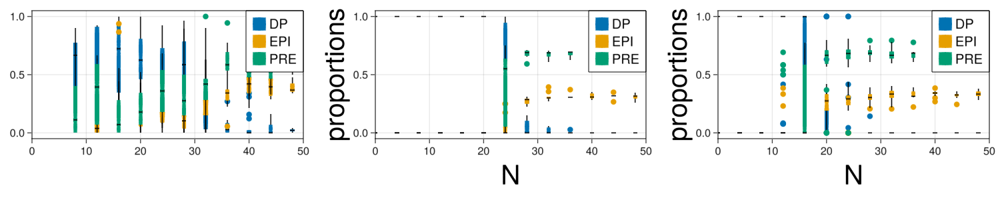

In [68]:
cluster = 4
dt = 0.001
steps = round(Int64,50/dt)
saveEach = round(Int64,1/dt)
nRepetitions = 5

fig = Figure(resolution=(1500,300))

#Real
ax = Axis(fig[1,1])
legend = []
for cellId in fates
    Ngrouped = round.(Int64,data["N"]/cluster).*cluster
    l = boxplot!(ax,Ngrouped,(data[cellId]./data["N"]),label=cellId, color=colorMap[cellId])
    push!(legend,l)
end
xlims!(0,50)
Legend(fig[1,1], legend, fates, halign = :right, valign = :top, tellheight = false, tellwidth = false, labelsize=20)

#Original fit
ax = Axis(fig[1,2],xlabel="N",xlabelsize=40,ylabel="proportions",ylabelsize=40)
legend = []
for i in ["DP","EPI","PRE"]
    Ngrouped = round.(Int64,propQualitative["N"]/cluster).*cluster
    l = boxplot!(ax,Ngrouped,propQualitative[i]./propQualitative["N"],color=colorMap[i])
    push!(legend,l)
end
xlims!(0,50)
Legend(fig[1,2], legend, ["DP","EPI","PRE"], halign = :right, valign = :top, tellheight = false, tellwidth = false, labelsize=20)

#Swarm fit
ax = Axis(fig[1,3],xlabel="N",xlabelsize=40,ylabel="proportions",ylabelsize=40)
legend = []
for i in ["DP","EPI","PRE"]
    Ngrouped = round.(Int64,propFitted["N"]/cluster).*cluster
    l = boxplot!(ax,Ngrouped,propFitted[i]./propFitted["N"],color=colorMap[i])
    push!(legend,l)
end
xlims!(0,50)
Legend(fig[1,3], legend, ["DP","EPI","PRE"], halign = :right, valign = :top, tellheight = false, tellwidth = false, labelsize=20)

display(fig)